### Import

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, MaxNLocator
%matplotlib inline

sns.set_style('whitegrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] =(10, 7)
plt.rcParams['figure.facecolor'] = '#FFE5B4'

In [2]:
pd.set_option('display.max_rows', None)

In [3]:
# Import Data

%store -r happiness_all_years
%store -r country_ids

In [4]:
# Create duplicates

data = happiness_all_years
country_ids = country_ids

In [5]:
data.sample(10)

,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1895,South Africa,114,Africa,2014,4.828456,9.546331,0.881152,53.200001,0.794031,-0.126051,0.820258
147,Bangladesh,9,Asia & Pacific,2013,4.660161,8.277083,0.530140,62.759998,0.741518,-0.029184,0.742774
548,Denmark,33,Europe,2005,8.018934,10.849012,0.972372,68.300003,0.971135,NaN,0.236522
458,Congo Brazzaville,26,Africa,2022,5.804919,8.077151,0.646345,57.174999,0.697694,0.027624,0.759754
138,Bahrain,8,Arab States,2020,6.173176,10.775782,0.847745,65.824997,0.945233,0.117025,NaN
1454,Myanmar,88,Asia & Pacific,2019,4.434237,8.482506,0.762995,60.900002,0.899064,0.563265,0.681796
910,India,54,Asia & Pacific,2021,3.558254,8.793618,0.569733,60.900002,0.866111,0.055863,0.756820
1442,Mozambique,87,Africa,2018,4.653714,7.164641,0.738480,49.950001,0.896622,0.047143,0.691220
1341,Mauritania,80,Arab States,2016,4.472149,8.533226,0.784827,59.125000,0.466561,-0.177736,0.841835
1294,Malaysia,77,Asia & Pacific,2018,5.338818,10.197493,0.789409,65.724998,0.874548,0.125394,0.894131


### Data All Years Analysis

In [6]:
test_data = data

In [7]:
print(test_data.shape)
test_data.describe()

(2336, 11)


,country_id,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,2336.000000,2336.000000,2316.000000,2323.000000,2332.000000,2303.000000,2263.000000,2220.000000
mean,75.260702,5.482776,9.393316,0.809993,63.770831,0.750212,0.001449,0.743972
std,43.791663,1.126221,1.156463,0.121455,7.194730,0.138948,0.160037,0.185325
min,1.000000,1.281271,5.526723,0.228217,6.720000,0.257534,-0.337527,0.035198
25%,37.000000,4.646820,8.502017,0.744791,59.480000,0.659464,-0.108697,0.687844
50%,74.500000,5.439057,9.502519,0.835509,65.255001,0.771577,-0.020794,0.798790
75%,112.000000,6.314347,10.380333,0.904686,69.000000,0.860766,0.095138,0.867713
max,165.000000,8.018934,11.663788,0.987343,85.497561,0.985178,0.702708,0.983276


In [8]:
# Number of reports over time

n_reports_year = test_data.groupby('year')['happiness_score'].count().reset_index().rename(columns = {'happiness_score':'n_reports'}).sort_values('year', ascending=False).reset_index().drop('index', axis=1)
n_reports_year

,year,n_reports
0,2023,137
1,2022,114
2,2021,122
3,2020,116
4,2019,143
5,2018,141
6,2017,147
7,2016,141
8,2015,142
9,2014,144


In [9]:
n_reports_year.sort_values('n_reports', ascending= False)

,year,n_reports
6,2017,147
12,2011,146
9,2014,144
4,2019,143
8,2015,142
11,2012,141
5,2018,141
7,2016,141
0,2023,137
10,2013,136


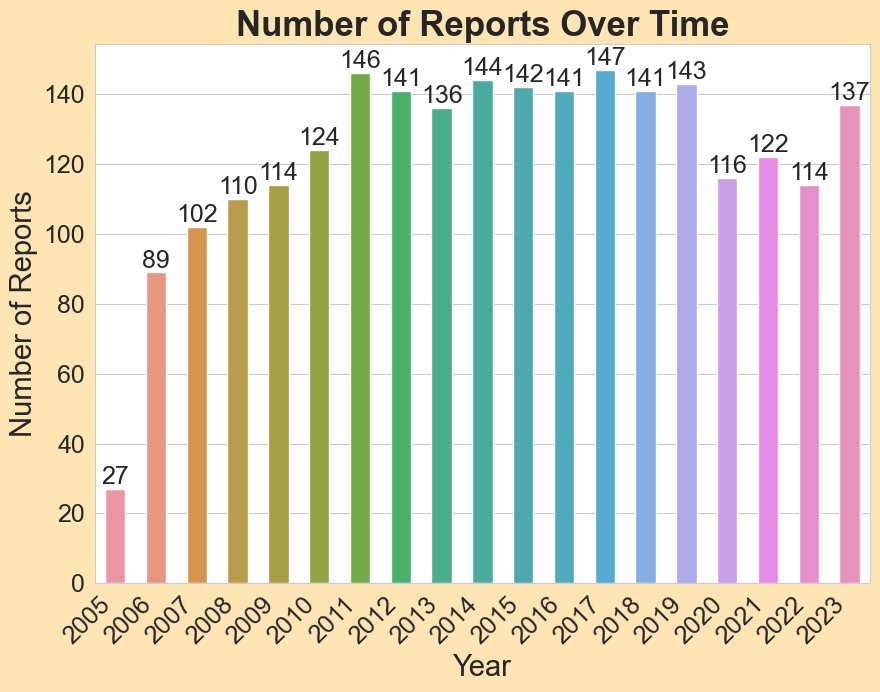

In [10]:
ax = sns.barplot(data=n_reports_year, x='year', y='n_reports', width=0.5)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.set_xlabel('Year', size=21)
ax.set_ylabel('Number of Reports', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], size=18)

plt.show()

In [11]:
# Average between 2011 and 2019

n_reports_year[(n_reports_year['year'] > 2010) & (n_reports_year['year'] < 2020)]['n_reports'].mean()

142.33333333333334

In [12]:
# Total number of countries representing in dataset

test_data['country_name'].drop_duplicates().count()

165

In [13]:
n_reports_country = test_data.groupby('country_name')['happiness_score'].count().sort_values(ascending=False).reset_index().rename(columns = {'happiness_score':'n_reports'})
n_reports_country.head(10)

,country_name,n_reports
0,Lebanon,18
1,Indonesia,18
2,Kyrgyzstan,18
3,Kenya,18
4,Kazakhstan,18
5,Jordan,18
6,Japan,18
7,Italy,18
8,Israel,18
9,India,18


In [14]:
n_reports_n_countries = n_reports_country.groupby('n_reports')['country_name'].count().sort_values(ascending=False).reset_index().rename(columns = {'country_name':'n_countries'})
n_reports_n_countries

,n_reports,n_countries
0,18,50
1,17,25
2,16,19
3,15,14
4,11,9
5,13,8
6,14,7
7,5,6
8,12,5
9,1,5


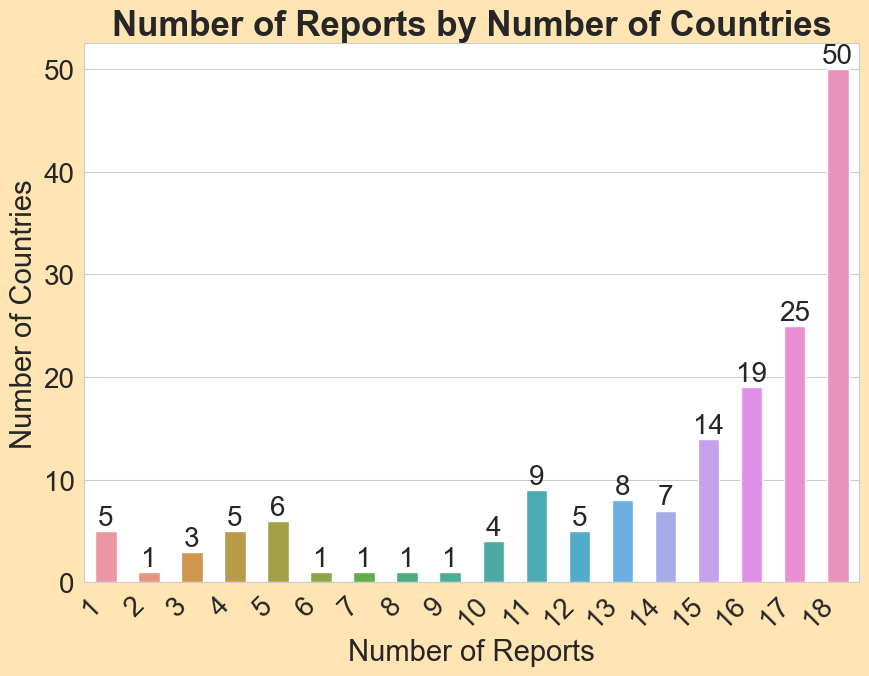

In [15]:
ax = sns.barplot(data=n_reports_n_countries, x='n_reports', y='n_countries', width=0.5)

ax.set_title('Number of Reports by Number of Countries',fontweight="bold", size=25)
ax.set_xlabel('Number of Reports', size=21)
ax.set_ylabel('Number of Countries', size=21)
ax.tick_params(labelsize=20)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], size=20)

plt.show()

In [16]:
test_data.groupby('country_name')['happiness_score'].mean().sort_values(ascending=False).reset_index().head(10)

,country_name,happiness_score
0,Denmark,7.668593
1,Finland,7.630711
2,Norway,7.469026
3,Iceland,7.465061
4,Switzerland,7.456454
5,Netherlands,7.449111
6,Sweden,7.378256
7,Canada,7.303492
8,Israel,7.277166
9,New Zealand,7.269344


In [17]:
test_data.groupby('year')['happiness_score'].mean().sort_values(ascending=False).reset_index()

,year,happiness_score
0,2005,6.446164
1,2020,5.727539
2,2021,5.636193
3,2022,5.585126
4,2019,5.570995
5,2023,5.539755
6,2018,5.498683
7,2010,5.496782
8,2017,5.460421
9,2009,5.457640


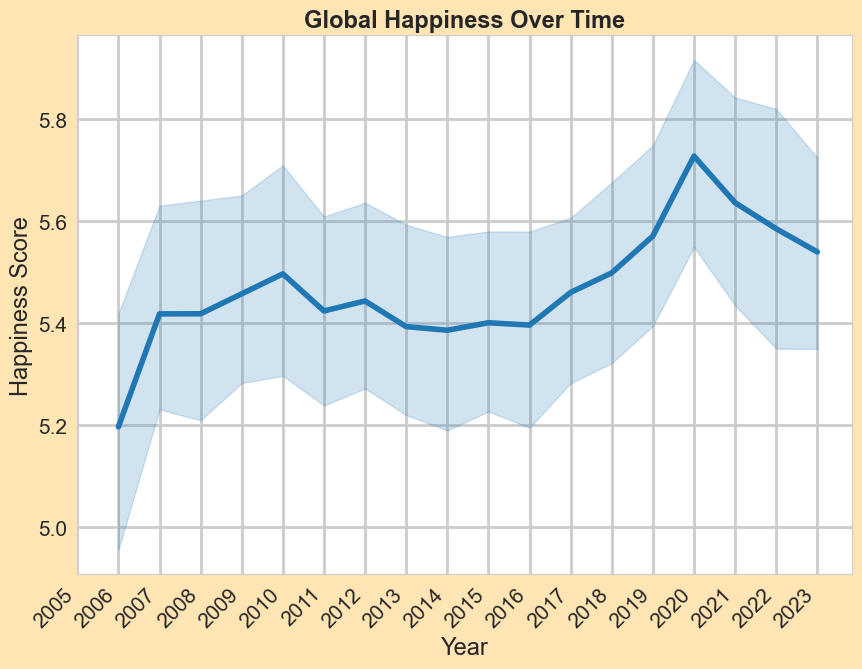

In [18]:
# Change of world happiness over time

year_labels = test_data['year'].drop_duplicates().sort_values(ascending=True).tolist()

ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0)

ax.set_title('Global Happiness Over Time',fontweight="bold", size=17)
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [19]:
legend=['Europe','Africa','Asia & Pacific','South/Latin America','Middle east','Arab States','North America','South/Central America']
legend

['Europe',
 'Africa',
 'Asia & Pacific',
 'South/Latin America',
 'Middle east',
 'Arab States',
 'North America',
 'South/Central America']

In [20]:
year_labels = test_data['year'].drop_duplicates().sort_values(ascending=True).tolist()
year_labels

[2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022,
 2023]

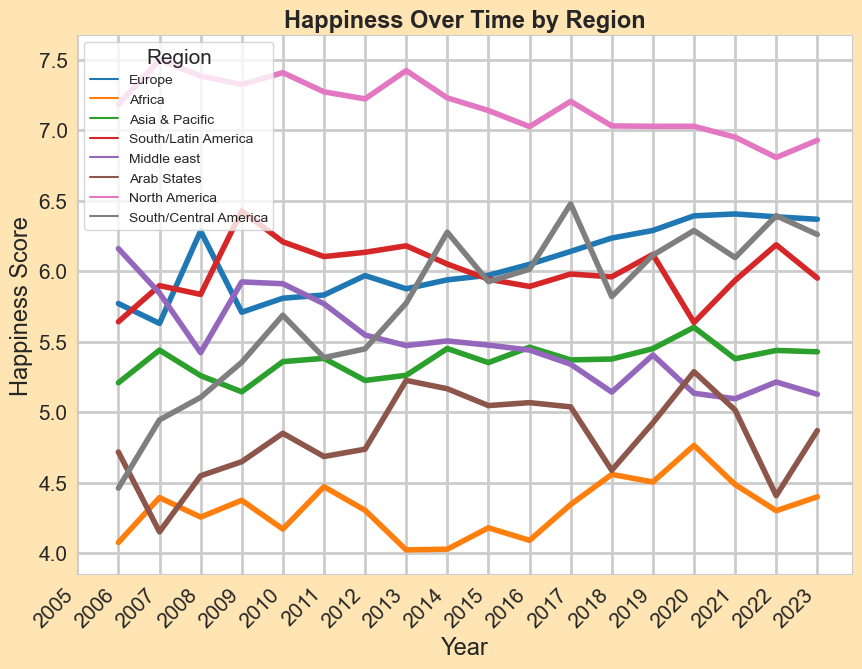

In [21]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0, hue='region', hue_order=legend, errorbar=None)

ax.set_title('Happiness Over Time by Region',fontweight="bold", size=17)
ax.legend(title='Region',loc='upper left', fontsize='10')
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

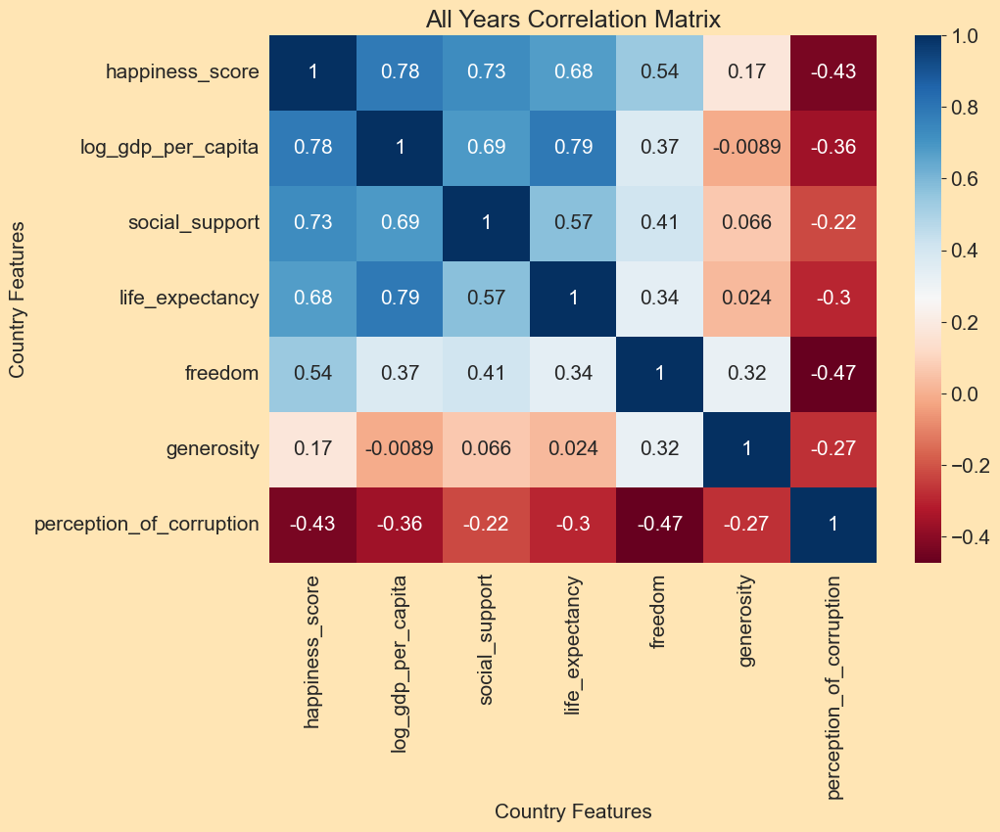

In [22]:
corr_matrix = test_data.drop(['year', 'country_id'], axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(corr_matrix, annot=True, cmap="RdBu")

plt.title('All Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

Text(0, 0.5, 'Social Support')

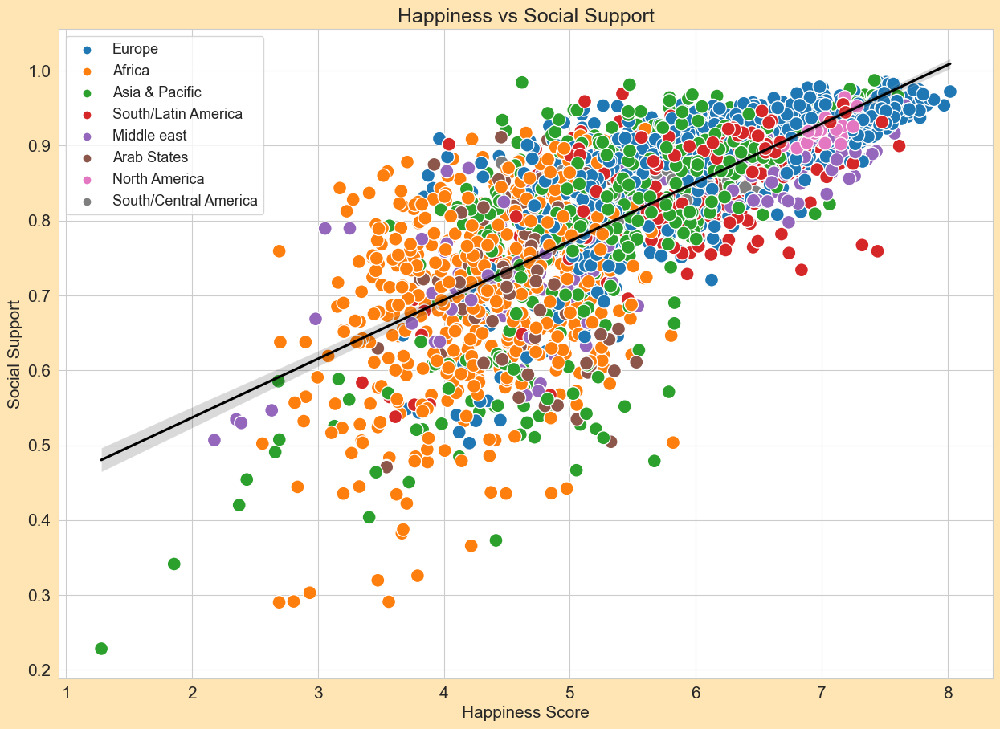

In [23]:
# Plot happiness_score and social_support

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Social Support')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.social_support, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="social_support",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Social Support')

Text(0, 0.5, 'Log GDP per Capita')

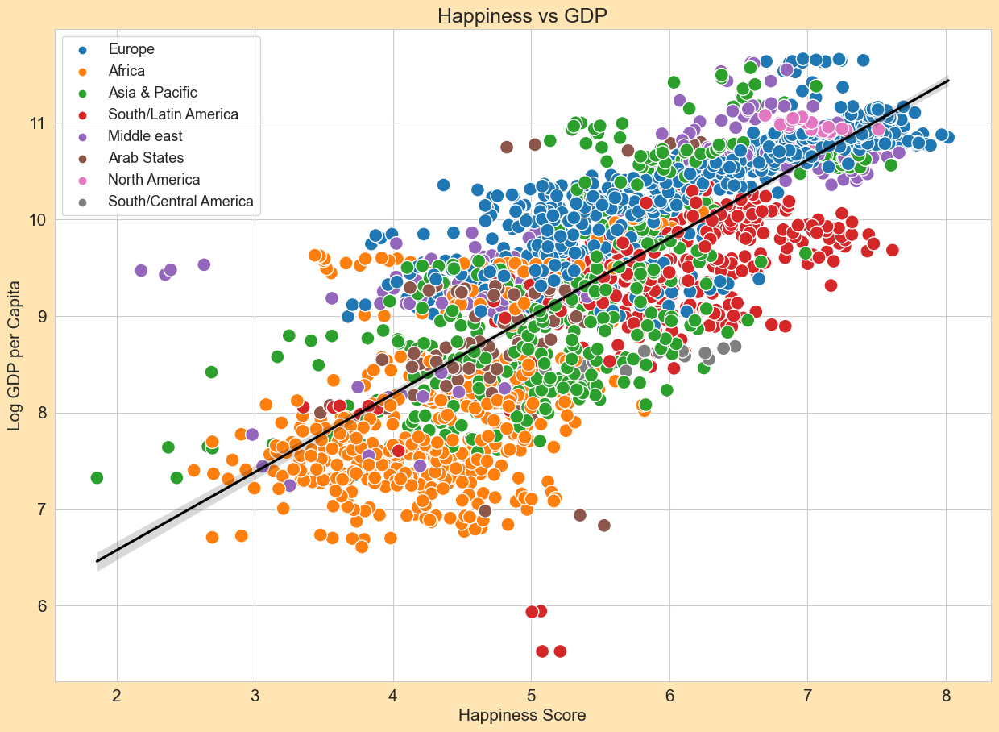

In [24]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [25]:
test_data.sort_values('life_expectancy').head(10)

,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
826,Haiti,149,South/Latin America,2006,3.754156,7.972617,0.693801,6.720000,0.449475,0.358533,0.853506
827,Haiti,149,South/Latin America,2008,3.846329,8.012043,0.679098,17.360001,0.464971,0.216526,0.811659
828,Haiti,149,South/Latin America,2010,3.765999,7.983535,0.554031,28.000000,0.372941,0.170872,0.848007
829,Haiti,149,South/Latin America,2011,4.844574,8.022003,0.567039,33.320000,0.412588,0.197880,0.681960
830,Haiti,149,South/Latin America,2012,4.413475,8.011640,0.748663,38.639999,0.482486,0.246083,0.717166
2318,Zimbabwe,137,Africa,2006,3.826268,7.459545,0.821656,40.400002,0.431110,-0.059926,0.904757
364,Central African Republic,144,Africa,2007,4.160130,6.945774,0.532297,41.480000,0.662871,0.082950,0.782131
1188,Lesotho,151,Africa,2011,4.897515,7.785040,0.824085,41.520000,0.618260,-0.089229,0.767676
2319,Zimbabwe,137,Africa,2007,3.280247,7.412637,0.828113,41.599998,0.455957,-0.065477,0.946287
1189,Lesotho,151,Africa,2016,3.808205,7.896603,0.798059,42.250000,0.729490,-0.096638,0.742873


Text(0, 0.5, 'Life Expectancy')

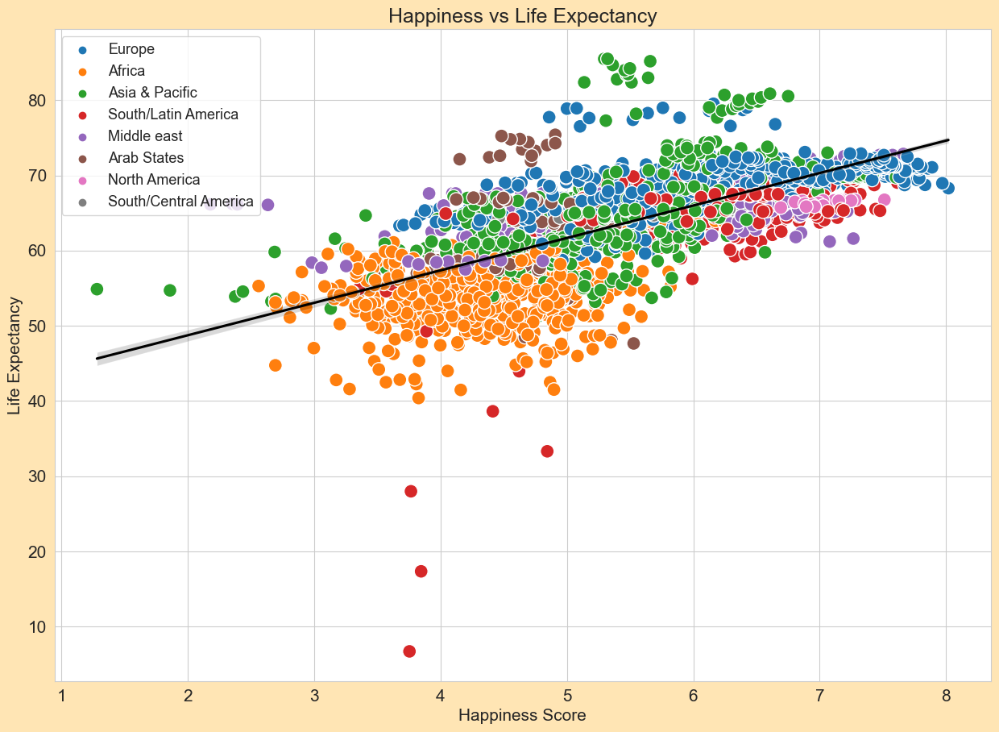

In [26]:
# Plot happiness_score and life_expectancy

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Life Expectancy')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.life_expectancy, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="life_expectancy",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Life Expectancy')

Text(0, 0.5, 'Freedom')

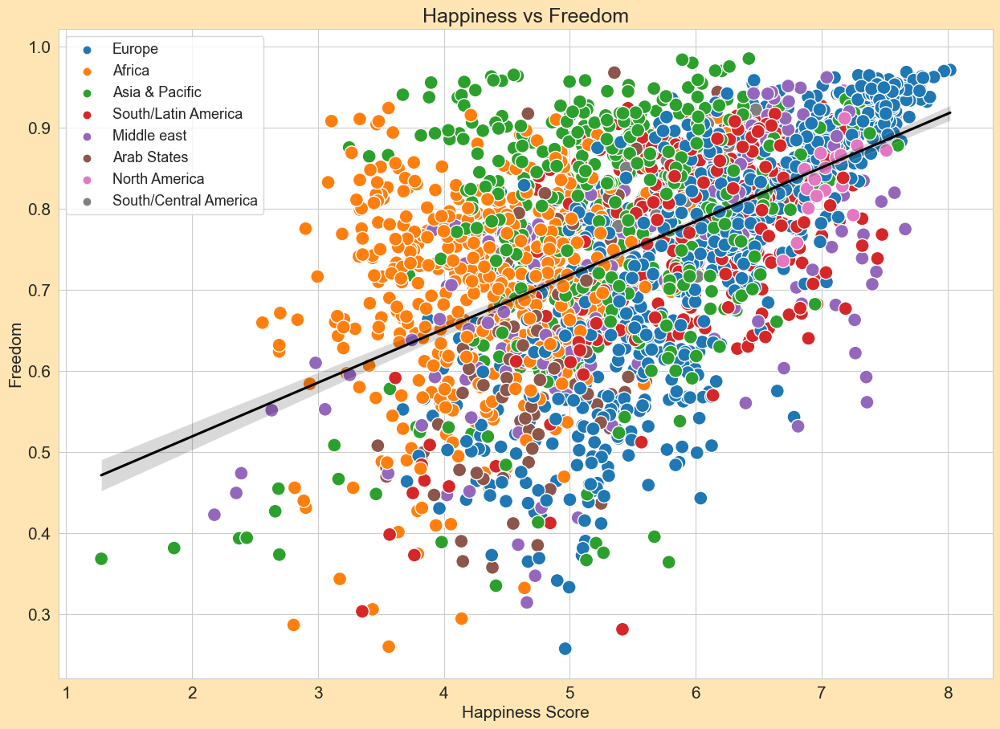

In [27]:
# Plot happiness_score and freedom

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Freedom')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.freedom, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="freedom",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Freedom')

Text(0, 0.5, 'Generosity')

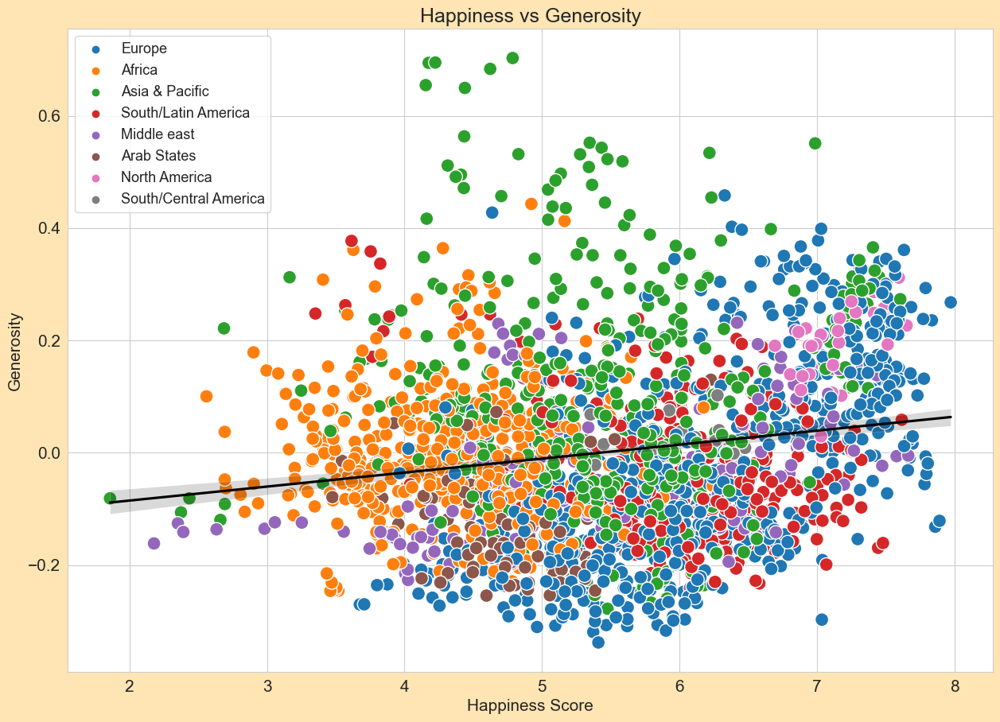

In [28]:
# Plot happiness_score and generosity

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Generosity')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.generosity, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="generosity",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Generosity')

Text(0, 0.5, 'Perception of Corruption')

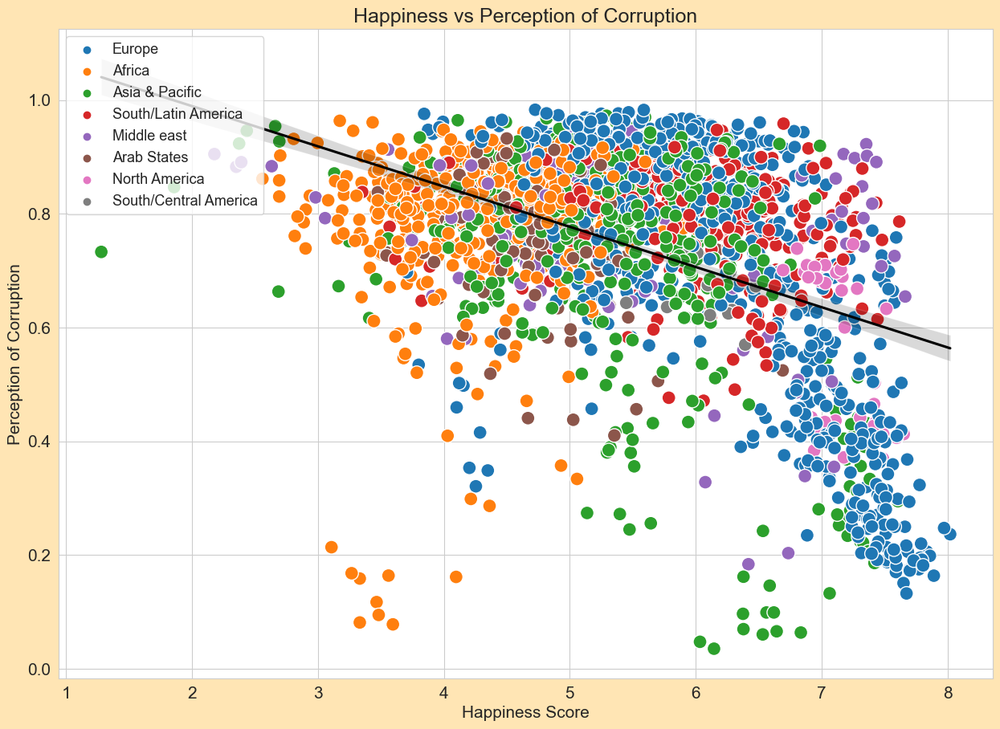

In [29]:
# Plot happiness_score and perception_of_corruption

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Perception of Corruption')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.perception_of_corruption, 
                                     hue_order = ['Europe',
                                                  'Africa',
                                                  'Asia & Pacific',
                                                  'South/Latin America',
                                                  'Middle east',
                                                  'Arab States',
                                                  'North America',
                                                  'South/Central America'], 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="perception_of_corruption",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Perception of Corruption')

Text(0, 0.5, 'Log GDP per Capita')

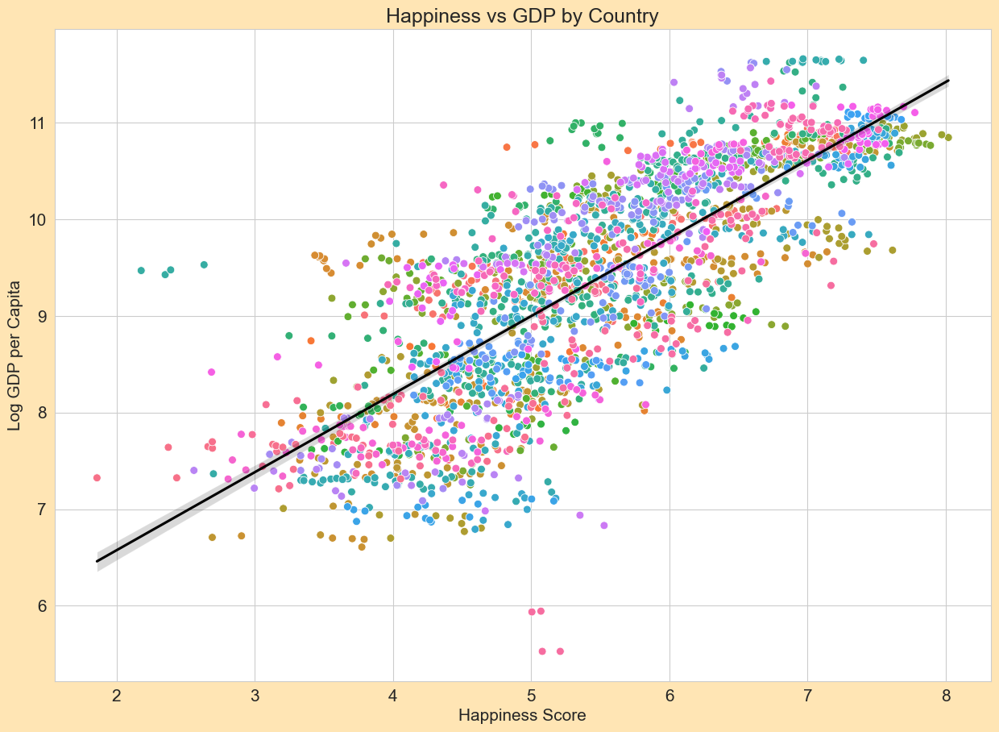

In [30]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP by Country')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['country_name'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

ax.get_legend().remove()
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [296]:
# Find variation in happiness by country
# How does this difference in variation affect correlated country features? Do more happiness stable countries differ from happines unstable countries?

In [32]:
test_data_pivot = pd.pivot_table(test_data, index='year', columns='country_name', values='happiness_score').reset_index()
test_data_pivot = test_data_pivot.drop(index=0)

In [33]:
test_data_pivot.head(20)

country_name,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [34]:
happiness_variation = test_data_pivot.drop('year', axis=1).var().sort_values().reset_index().rename(columns = {0:'variation'})
happiness_variation.head(20)

,country_name,variation
0,Netherlands,0.007962
1,Sweden,0.009218
2,Australia,0.012868
3,Belgium,0.015915
4,Denmark,0.017516
5,Norway,0.018259
6,New Zealand,0.018970
7,Japan,0.019681
8,Hong Kong,0.020887
9,Libya,0.024064


In [35]:
happiness_variation.describe()

,variation
count,160.000000
mean,0.186051
std,0.192392
min,0.007962
25%,0.064822
50%,0.131135
75%,0.239333
max,1.356672


In [36]:
happiness_variation[happiness_variation['variation'] <= 0.064822]

,country_name,variation
0,Netherlands,0.007962
1,Sweden,0.009218
2,Australia,0.012868
3,Belgium,0.015915
4,Denmark,0.017516
5,Norway,0.018259
6,New Zealand,0.018970
7,Japan,0.019681
8,Hong Kong,0.020887
9,Libya,0.024064


In [37]:
happiness_variation[happiness_variation['variation'] >= 0.239333]

,country_name,variation
120,Burkina Faso,0.241351
121,Pakistan,0.246703
122,Turkmenistan,0.255762
123,Ghana,0.258218
124,Nepal,0.263089
125,Greece,0.271997
126,Honduras,0.276167
127,Central African Republic,0.280654
128,Lithuania,0.281360
129,Congo Kinshasa,0.287386


In [38]:
lowest_25perc_variation_countries = happiness_variation[happiness_variation['variation'] <= 0.064822]['country_name'].tolist()
highest_25perc_variation_countries = happiness_variation[happiness_variation['variation'] >= 0.239333]['country_name'].tolist()

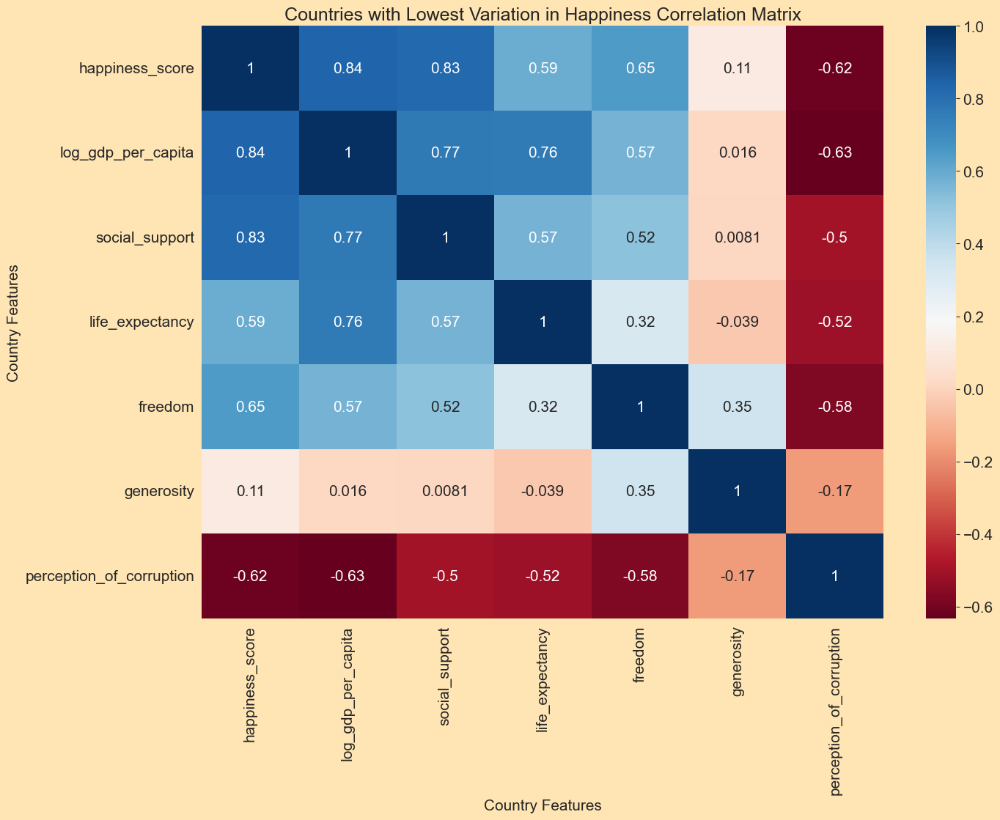

In [39]:
corr_matrix_lowest_variation = test_data.drop(['year', 'country_id'], axis=1)[test_data['country_name'].isin(lowest_25perc_variation_countries)].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr_matrix_lowest_variation, annot=True, cmap="RdBu")

plt.rcParams['figure.figsize'] =(10, 7)
plt.title('Countries with Lowest Variation in Happiness Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

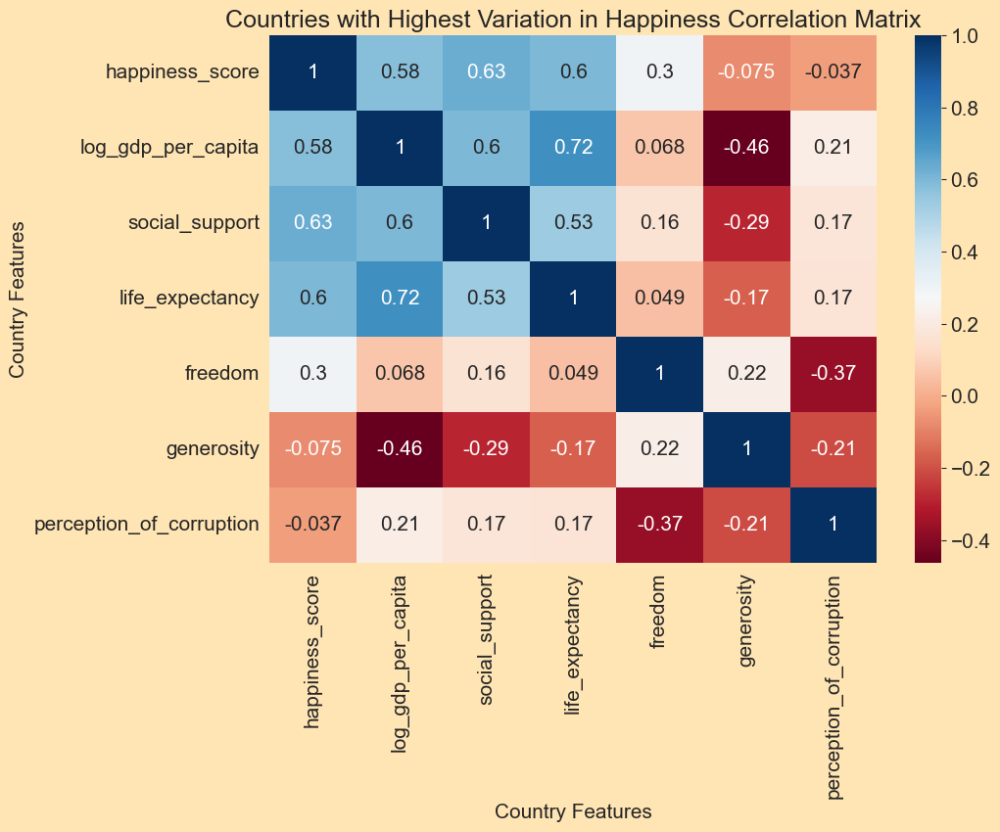

In [40]:
corr_matrix_highest_variation = test_data.drop(['year', 'country_id'], axis=1)[test_data['country_name'].isin(highest_25perc_variation_countries)].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr_matrix_highest_variation, annot=True, cmap="RdBu")

plt.rcParams['figure.figsize'] =(10, 7)
plt.title('Countries with Highest Variation in Happiness Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [41]:
low_var_happiness_corr = corr_matrix_lowest_variation['happiness_score'].reset_index().rename(columns = {'index':'country_feature','happiness_score':'low_var_happiness_corr'})
low_var_happiness_corr

,country_feature,low_var_happiness_corr
0,happiness_score,1.000000
1,log_gdp_per_capita,0.835829
2,social_support,0.827742
3,life_expectancy,0.588003
4,freedom,0.648066
5,generosity,0.111763
6,perception_of_corruption,-0.615807


In [42]:
high_var_happiness_corr = corr_matrix_highest_variation['happiness_score'].reset_index().rename(columns = {'index':'country_feature','happiness_score':'high_var_happiness_corr'})
high_var_happiness_corr

,country_feature,high_var_happiness_corr
0,happiness_score,1.000000
1,log_gdp_per_capita,0.579930
2,social_support,0.630160
3,life_expectancy,0.598619
4,freedom,0.302479
5,generosity,-0.075408
6,perception_of_corruption,-0.036867


In [43]:
variation_diff = low_var_happiness_corr.merge(high_var_happiness_corr, on='country_feature')
variation_diff['diff'] = abs(variation_diff['low_var_happiness_corr'] -variation_diff['high_var_happiness_corr'])
variation_diff.sort_values('diff', ascending=False).reset_index().drop('index', axis=1)

,country_feature,low_var_happiness_corr,high_var_happiness_corr,diff
0,perception_of_corruption,-0.615807,-0.036867,0.578939
1,freedom,0.648066,0.302479,0.345588
2,log_gdp_per_capita,0.835829,0.579930,0.255899
3,social_support,0.827742,0.630160,0.197582
4,generosity,0.111763,-0.075408,0.187171
5,life_expectancy,0.588003,0.598619,0.010616
6,happiness_score,1.000000,1.000000,0.000000


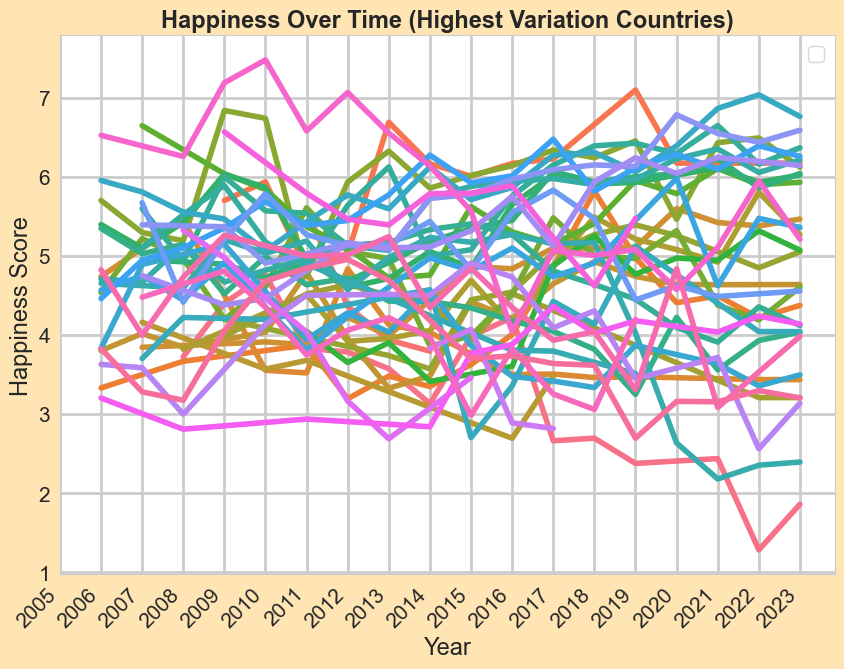

In [44]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, hue='country_name', errorbar=None)

ax.set_title('Happiness Over Time (Highest Variation Countries)',fontweight="bold", size=17)
ax.legend([])
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [45]:
# Countries with highest variation in happiness avg happiness over time
test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))].groupby('year')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})

,year,avg_happiness_score
0,2006,4.612863
1,2007,4.786665
2,2008,4.601964
3,2009,5.232447
4,2010,4.958243
5,2011,4.698586
6,2012,4.759351
7,2013,4.721810
8,2014,4.666221
9,2015,4.673848


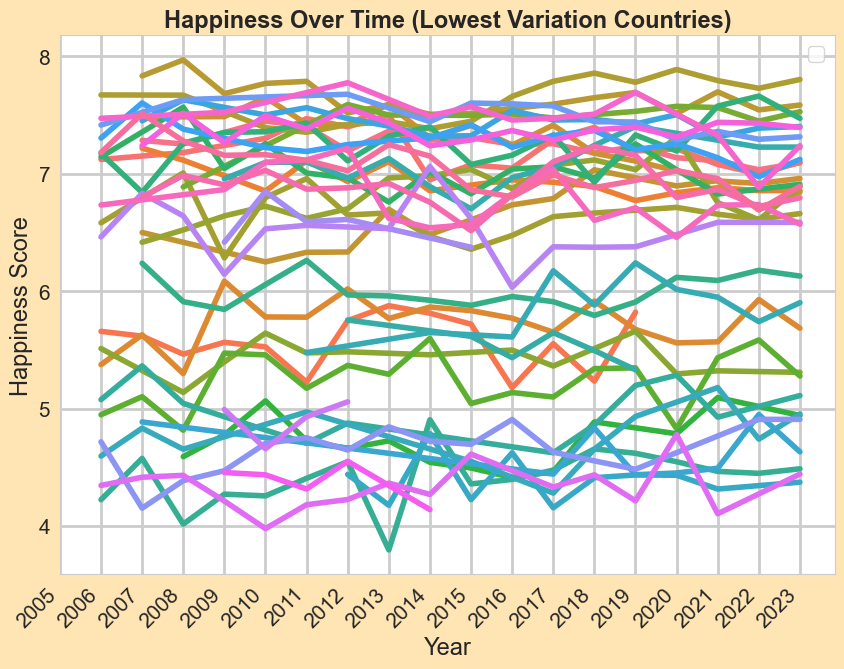

In [46]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, hue='country_name', errorbar=None)

ax.set_title('Happiness Over Time (Lowest Variation Countries)',fontweight="bold", size=17)
ax.legend([])
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [47]:
# Countries with lowest variation in happiness avg happiness over time

test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))].groupby('year')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})

,year,avg_happiness_score
0,2006,6.135642
1,2007,6.253588
2,2008,6.370305
3,2009,6.131002
4,2010,6.398577
5,2011,6.258084
6,2012,6.361578
7,2013,6.478584
8,2014,6.326119
9,2015,6.380832


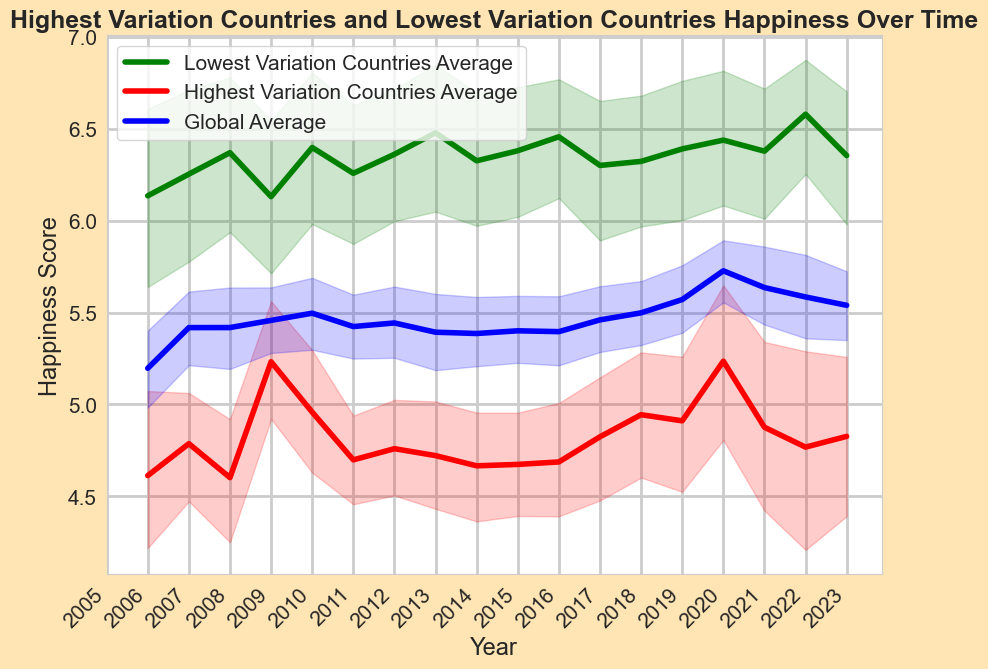

In [48]:
# Average global happines compared to highest variation average and lowest variation average

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, color='green', label='Lowest Variation Countries Average')
ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, color='red', label='Highest Variation Countries Average')
ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0, color='blue', label='Global Average')

ax.set_title('Highest Variation Countries and Lowest Variation Countries Happiness Over Time',fontweight="bold")
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.legend(loc='upper left')
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [49]:
# Add global average to test_data_pivot
# Is an individual country's happiness affected by Global Happiness or are countries independent of the global average?

test_data_pivot

country_name,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [50]:
global_average = test_data.groupby('year')['happiness_score'].mean().reset_index().rename(columns = {'happiness_score':'Global Average'})
global_average

,year,Global Average
0,2005,6.446164
1,2006,5.196935
2,2007,5.418291
3,2008,5.418554
4,2009,5.457640
5,2010,5.496782
6,2011,5.424088
7,2012,5.443612
8,2013,5.393302
9,2014,5.386267


In [51]:
# Merge

test_data_pivot = test_data_pivot.merge(global_average, on ='year')
test_data_pivot

,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe,Global Average
0,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268,5.196935
1,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247,5.418291
2,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264,5.418554
3,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914,5.457640
4,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570,5.496782
5,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642,5.424088
6,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101,5.443612
7,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188,5.393302
8,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451,5.386267
9,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191,5.400948


In [52]:
# Correlation to Global Average

corr_matrix_global = test_data_pivot.corr(numeric_only = True, method = "pearson")['Global Average'].reset_index().rename(columns = {'index':'country_name', 'Global Average':'corr'})
corr_matrix_global.sort_values('corr', ascending=False)

,country_name,corr
14,Belize,1.000000
166,Global Average,1.000000
131,Slovakia,0.860394
100,Mongolia,0.818731
80,Kyrgyzstan,0.809126
54,Georgia,0.795165
132,Slovenia,0.793679
47,Estonia,0.792605
23,Burundi,0.778423
88,Luxembourg,0.771760


In [53]:
corr_matrix_global.describe()

,corr
count,162.000000
mean,0.159053
std,0.470242
min,-0.839005
25%,-0.215601
50%,0.227168
75%,0.561466
max,1.000000


In [54]:
corr_matrix_global['corr'].var()

0.22112768483063475

In [55]:
############

In [56]:
# Are countries with not enough reports skewing data?

country_n_reports = test_data.groupby('country_name')['happiness_score'].count().reset_index().rename(columns={'happiness_score':'n_reports'})
country_n_reports.sort_values('n_reports', ascending=False).describe()

,n_reports
count,165.000000
mean,14.157576
std,4.811003
min,1.000000
25%,12.000000
50%,16.000000
75%,18.000000
max,18.000000


In [57]:
# Filter for countries with more than 10 reports. (Atleast 11 years of reported data)
countries_more10reports = country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=False)['country_name'].tolist()
print(test_data['country_name'].drop_duplicates().count(), country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=True)['country_name'].count())
country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=True).head(20)

165 137


,country_name,n_reports
2,Algeria,11
48,Ethiopia,11
60,Haiti,11
84,Liberia,11
80,Laos,11
64,Iceland,11
103,Myanmar,11
102,Mozambique,11
78,Kuwait,11
148,Togo,12


In [58]:
test_data_more10reports = test_data[test_data['country_name'].isin(countries_more10reports)]

In [59]:
test_data_more10reports_pivot = pd.pivot_table(test_data_more10reports, index='year', columns='country_name', values='happiness_score').reset_index()
test_data_more10reports_pivot = test_data_more10reports_pivot.drop(index=0)
test_data_more10reports_pivot

country_name,year,Afghanistan,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,6.671114,4.453083,7.288550,6.950000,5.251530,6.165134,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,6.007375,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [60]:
global_average_more10reports = test_data_more10reports.groupby('year')['happiness_score'].mean().reset_index().rename(columns = {'happiness_score':'Global Average'})
global_average_more10reports.drop(index=0).reset_index().drop('index', axis=1)

,year,Global Average
0,2006,5.175224
1,2007,5.420169
2,2008,5.428760
3,2009,5.510502
4,2010,5.545369
5,2011,5.477251
6,2012,5.478802
7,2013,5.422709
8,2014,5.445423
9,2015,5.427478


In [61]:
# Merge

test_data_more10reports_pivot = test_data_more10reports_pivot.merge(global_average_more10reports, on ='year')
test_data_more10reports_pivot

,year,Afghanistan,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe,Global Average
0,2006,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268,5.175224
1,2007,NaN,4.634252,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247,5.420169
2,2008,3.723590,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264,5.428760
3,2009,4.401778,5.485470,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914,5.510502
4,2010,4.758381,5.268937,5.463567,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570,5.545369
5,2011,3.831719,5.867422,5.317194,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642,5.477251
6,2012,3.782938,5.510124,5.604596,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101,5.478802
7,2013,3.572100,4.550648,NaN,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188,5.422709
8,2014,3.130896,4.813763,6.354898,6.671114,4.453083,7.288550,6.950000,5.251530,6.165134,...,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451,5.445423
9,2015,3.982855,4.606651,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,6.007375,...,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191,5.427478


In [62]:
# Correlation to Global Average

corr_matrix_global = test_data_more10reports_pivot.corr(numeric_only = True, method = "pearson")['Global Average'].reset_index().rename(columns = {'index':'country_name', 'Global Average':'corr'})
corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False)
corr_matrix_global = corr_matrix_global.drop(index=([0,138]))
corr_matrix_global

,country_name,corr
111,Slovakia,0.902882
83,Mongolia,0.860193
48,Guinea,0.814489
67,Kyrgyzstan,0.809754
43,Georgia,0.806507
38,Estonia,0.768825
73,Luxembourg,0.764049
27,Congo Brazzaville,0.754757
112,Slovenia,0.753274
32,Côte D'Ivoire,0.745928


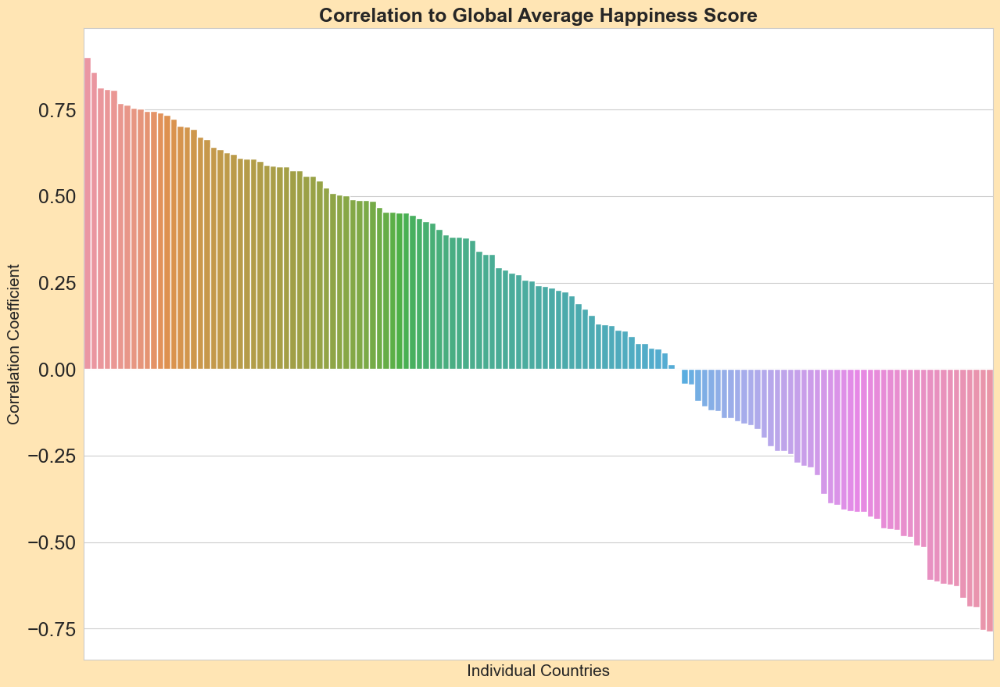

In [63]:
plt.rcParams['figure.figsize'] = (15,10.5)

ax = sns.barplot(data=corr_matrix_global, x='country_name', y='corr', width=1)

ax.set_title('Correlation to Global Average Happiness Score', fontweight="bold")
ax.set_xlabel('Individual Countries')
ax.set_ylabel('Correlation Coefficient')
ax.tick_params(labelsize=18, labelbottom=False)

In [64]:
corr_matrix_global['abs_corr'] = corr_matrix_global['corr'].abs()
corr_matrix_global['pos_neg'] = corr_matrix_global['corr'].apply(lambda x: 'Negative' if x < 0 else 'Positive')
corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False)
corr_matrix_global.head(20)

,country_name,corr,abs_corr,pos_neg
111,Slovakia,0.902882,0.902882,Positive
83,Mongolia,0.860193,0.860193,Positive
48,Guinea,0.814489,0.814489,Positive
67,Kyrgyzstan,0.809754,0.809754,Positive
43,Georgia,0.806507,0.806507,Positive
38,Estonia,0.768825,0.768825,Positive
73,Luxembourg,0.764049,0.764049,Positive
62,Jordan,-0.757381,0.757381,Negative
27,Congo Brazzaville,0.754757,0.754757,Positive
22,Canada,-0.753779,0.753779,Negative


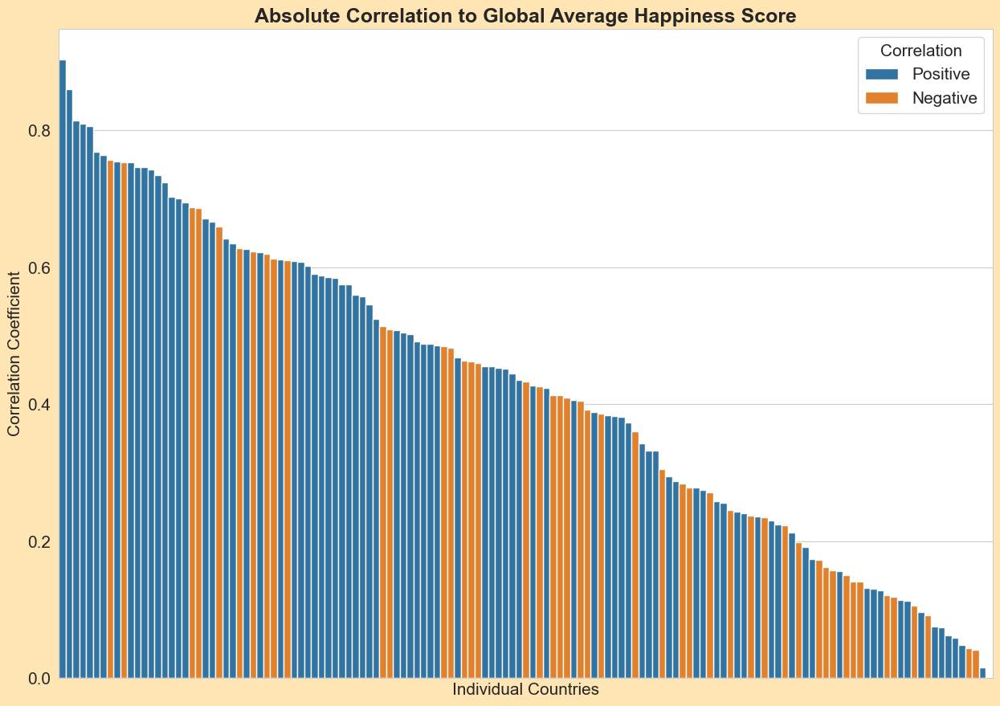

In [65]:
plt.rcParams['figure.figsize'] = (15,10.5)

ax = sns.barplot(data=corr_matrix_global, x='country_name', y='abs_corr', width=1, hue='pos_neg', dodge=False)

ax.set_title('Absolute Correlation to Global Average Happiness Score', fontweight="bold")
ax.legend(title='Correlation')
ax.set_xlabel('Individual Countries')
ax.set_ylabel('Correlation Coefficient')
ax.tick_params(labelbottom=False)

In [66]:
corr_describe = corr_matrix_global[['corr', 'abs_corr']].describe().reset_index().rename(columns={'index':'describe'})
corr_describe

,describe,corr,abs_corr
0,count,137.000000,137.000000
1,mean,0.168164,0.421959
2,std,0.448928,0.225089
3,min,-0.757381,0.000687
4,25%,-0.198869,0.236203
5,50%,0.242670,0.433213
6,75%,0.557927,0.608569
7,max,0.902882,0.902882


In [67]:
# Larger variance of correlation supports that a country's happiness is more independent rathen than dependent on the global average.

print(corr_matrix_global['corr'].var(), corr_matrix_global['abs_corr'].var())

0.20153663330064192 0.050664994971541165


In [68]:
corr_describe.loc[8] = ['variance', '0.201536', '0.0506649']
corr_describe

,describe,corr,abs_corr
0,count,137.0,137.0
1,mean,0.168164,0.421959
2,std,0.448928,0.225089
3,min,-0.757381,0.000687
4,25%,-0.198869,0.236203
5,50%,0.24267,0.433213
6,75%,0.557927,0.608569
7,max,0.902882,0.902882
8,variance,0.201536,0.0506649


In [69]:
top_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
111,Slovakia,0.902882,0.902882,Positive
83,Mongolia,0.860193,0.860193,Positive
48,Guinea,0.814489,0.814489,Positive
67,Kyrgyzstan,0.809754,0.809754,Positive
43,Georgia,0.806507,0.806507,Positive
38,Estonia,0.768825,0.768825,Positive
73,Luxembourg,0.764049,0.764049,Positive
27,Congo Brazzaville,0.754757,0.754757,Positive
112,Slovenia,0.753274,0.753274,Positive
32,Côte D'Ivoire,0.745928,0.745928,Positive


[Text(0, 0, '0.9'),
 Text(0, 0, '0.86'),
 Text(0, 0, '0.81'),
 Text(0, 0, '0.81'),
 Text(0, 0, '0.81'),
 Text(0, 0, '0.77'),
 Text(0, 0, '0.76'),
 Text(0, 0, '0.75'),
 Text(0, 0, '0.75'),
 Text(0, 0, '0.75'),
 Text(0, 0, '-0.61'),
 Text(0, 0, '-0.61'),
 Text(0, 0, '-0.62'),
 Text(0, 0, '-0.62'),
 Text(0, 0, '-0.63'),
 Text(0, 0, '-0.66'),
 Text(0, 0, '-0.69'),
 Text(0, 0, '-0.69'),
 Text(0, 0, '-0.75'),
 Text(0, 0, '-0.76')]

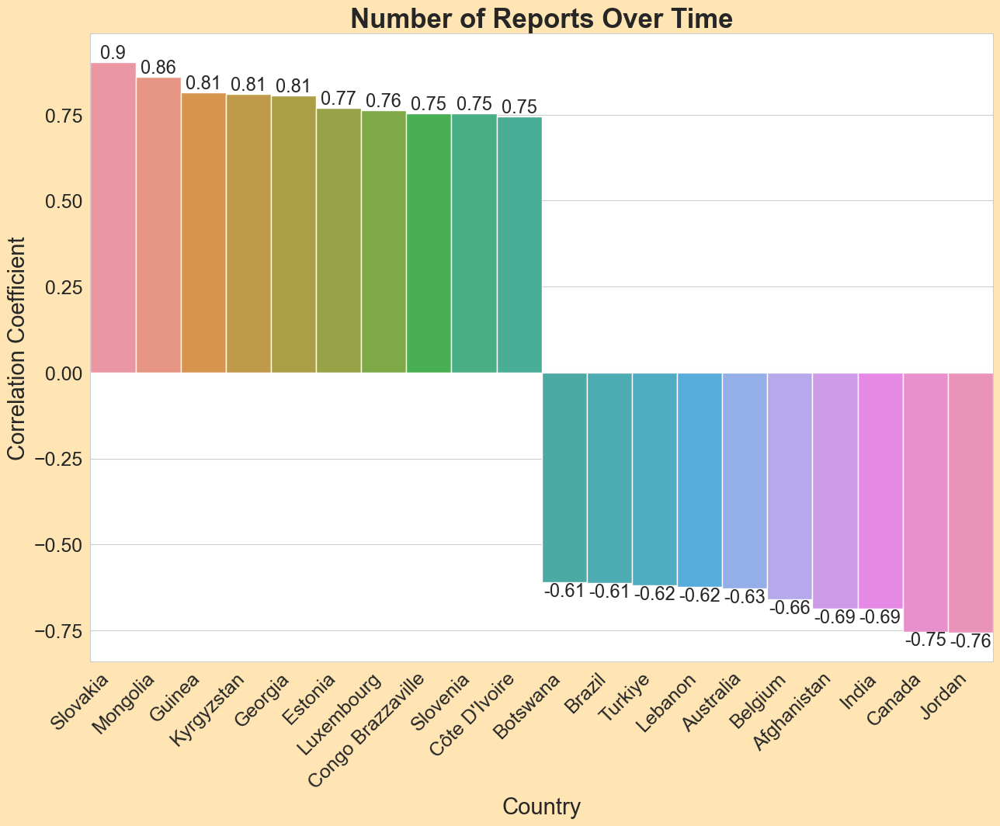

In [70]:
labels = top_bot_corr_matrix_global['corr'].round(decimals=2).tolist()

ax = sns.barplot(data=top_bot_corr_matrix_global, x='country_name', y='corr', width=1,)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.set_xlabel('Country', size=21)
ax.set_ylabel('Correlation Coefficient', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], labels=labels, size=17)

In [71]:
top_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
111,Slovakia,0.902882,0.902882,Positive
83,Mongolia,0.860193,0.860193,Positive
48,Guinea,0.814489,0.814489,Positive
67,Kyrgyzstan,0.809754,0.809754,Positive
43,Georgia,0.806507,0.806507,Positive
38,Estonia,0.768825,0.768825,Positive
73,Luxembourg,0.764049,0.764049,Positive
27,Congo Brazzaville,0.754757,0.754757,Positive
112,Slovenia,0.753274,0.753274,Positive
32,Côte D'Ivoire,0.745928,0.745928,Positive


In [72]:
corr_matrix_global['abs_corr'] = corr_matrix_global['corr'].abs()

In [73]:
top_corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global['pos_neg'] = top_bot_corr_matrix_global['corr'].apply(lambda x: 'Negative' if x < 0 else 'Positive')
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
111,Slovakia,0.902882,0.902882,Positive
83,Mongolia,0.860193,0.860193,Positive
48,Guinea,0.814489,0.814489,Positive
67,Kyrgyzstan,0.809754,0.809754,Positive
43,Georgia,0.806507,0.806507,Positive
38,Estonia,0.768825,0.768825,Positive
73,Luxembourg,0.764049,0.764049,Positive
62,Jordan,-0.757381,0.757381,Negative
27,Congo Brazzaville,0.754757,0.754757,Positive
22,Canada,-0.753779,0.753779,Negative


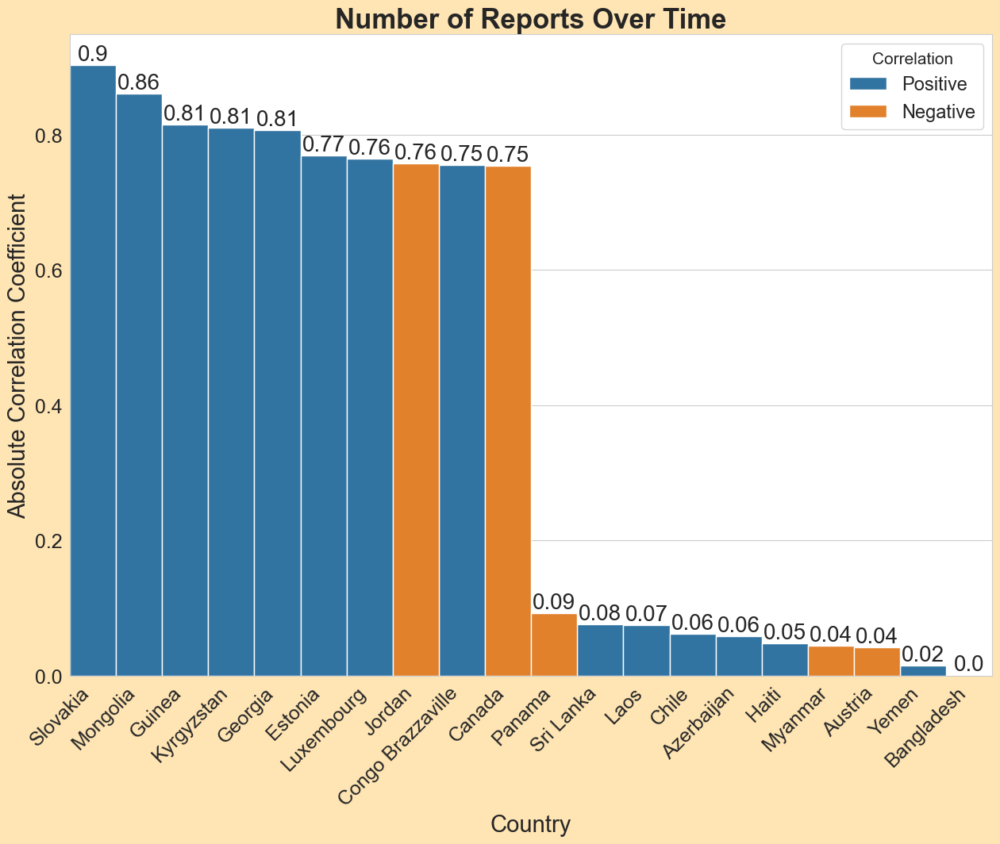

In [297]:
labels = top_bot_corr_matrix_global['abs_corr'].round(decimals=2).tolist()

ax = sns.barplot(data=top_bot_corr_matrix_global, x='country_name', y='abs_corr', width=1, hue='pos_neg', dodge=False)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.legend(title='Correlation',fontsize=17, loc = 'upper right')
ax.set_xlabel('Country', size=21)
ax.set_ylabel('Absolute Correlation Coefficient', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[1], labels=labels, size=20)
ax.bar_label(ax.containers[0], labels=labels, size=20)

plt.show()

In [75]:
# print(test_data_more10reports.groupby('country_name')['happiness_score'].mean().count())
# test_data_more10reports_avg = test_data_more10reports.groupby('country_name')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})
# test_data_more10reports_avg.head(20)

In [76]:
# corr_matrix_global = corr_matrix_global.merge(test_data_more10reports_avg, on='country_name')

In [77]:
corr_matrix_global = corr_matrix_global.merge(test_data_more10reports[['country_name', 'region']].drop_duplicates(), on='country_name')
corr_matrix_global.head(10)

,country_name,corr,abs_corr,pos_neg,region
0,Slovakia,0.902882,0.902882,Positive,Europe
1,Mongolia,0.860193,0.860193,Positive,Asia & Pacific
2,Guinea,0.814489,0.814489,Positive,Africa
3,Kyrgyzstan,0.809754,0.809754,Positive,Asia & Pacific
4,Georgia,0.806507,0.806507,Positive,Europe
5,Estonia,0.768825,0.768825,Positive,Europe
6,Luxembourg,0.764049,0.764049,Positive,Europe
7,Jordan,-0.757381,0.757381,Negative,Middle east
8,Congo Brazzaville,0.754757,0.754757,Positive,Africa
9,Canada,-0.753779,0.753779,Negative,North America


In [78]:
import random

random_sample = corr_matrix_global

In [79]:
random_sample['random'] = pd.Series(random.choices(random_sample.index.to_list(), k=len(random_sample)),index=random_sample.index)

Text(0, 0.5, 'Correlation')

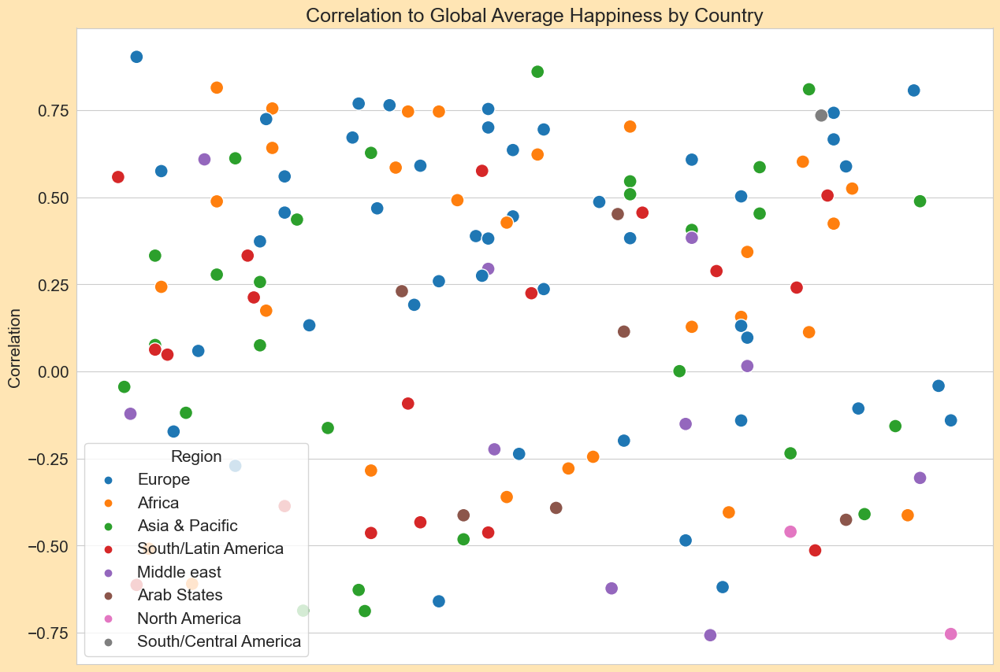

In [80]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_sample, x ='random', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region')   
plt.xticks([])
plt.xlabel('')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

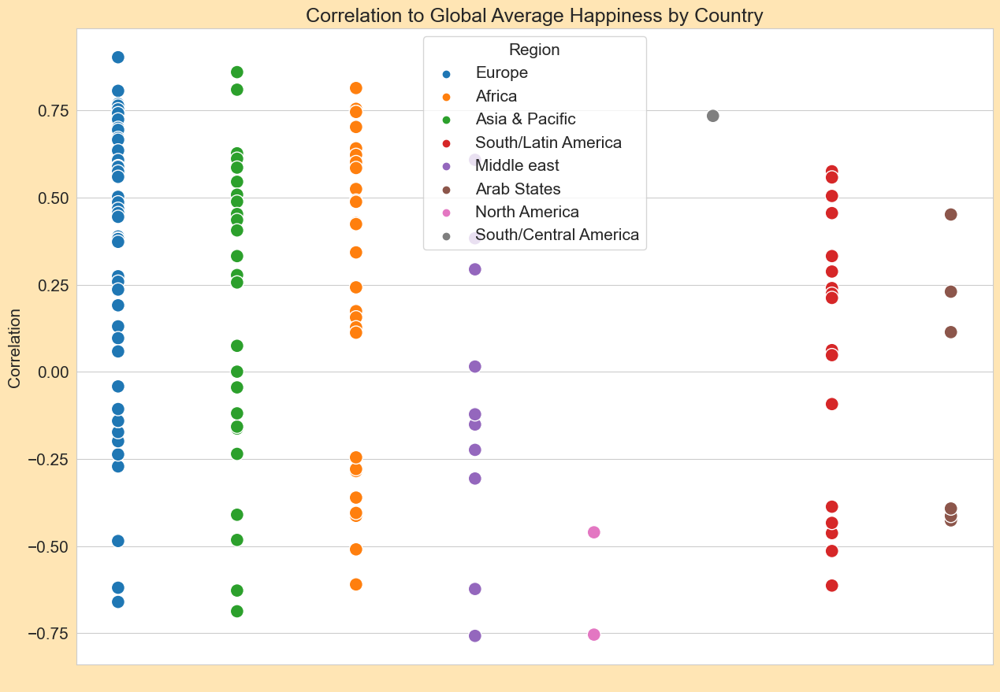

In [81]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = corr_matrix_global, x ='region', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region')   
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

In [82]:
legend_region_order = corr_matrix_global['region'].drop_duplicates().reset_index().drop('index',axis=1)
legend_region_order['legend_order'] = ([2,3,4,1,6,7,8,9])
legend_region_order

,region,legend_order
0,Europe,2
1,Asia & Pacific,3
2,Africa,4
3,Middle east,1
4,North America,6
5,South/Central America,7
6,South/Latin America,8
7,Arab States,9


In [83]:
random_region = corr_matrix_global.sort_values(['region','random']).reset_index().drop('index',axis=1).reset_index()
random_region.head(10)

,index,country_name,corr,abs_corr,pos_neg,region,random
0,0,Rwanda,-0.509170,0.509170,Negative,Africa,6
1,1,Mali,0.242670,0.242670,Positive,Africa,8
2,2,Botswana,-0.609828,0.609828,Negative,Africa,13
3,3,Guinea,0.814489,0.814489,Positive,Africa,17
4,4,Liberia,0.488018,0.488018,Positive,Africa,17
5,5,Madagascar,0.174292,0.174292,Positive,Africa,25
6,6,Congo Brazzaville,0.754757,0.754757,Positive,Africa,26
7,7,Niger,0.641465,0.641465,Positive,Africa,26
8,8,Malawi,-0.284617,0.284617,Negative,Africa,42
9,9,Benin,0.584958,0.584958,Positive,Africa,46


In [84]:
random_region = random_region.merge(legend_region_order, how='left', on='region')

In [299]:
random_region = random_region.drop('index',axis=1).sort_values(['legend_order','random']).reset_index().drop('index',axis=1).reset_index()
random_region.head(20)

,index,country_name,corr,abs_corr,pos_neg,region,random,legend_order
0,0,Iraq,0.608569,0.608569,Positive,Middle east,0,1
1,1,Jordan,-0.757381,0.757381,Negative,Middle east,7,1
2,2,Yemen,0.015362,0.015362,Positive,Middle east,39,1
3,3,Lebanon,-0.622862,0.622862,Negative,Middle east,44,1
4,4,Saudi Arabia,-0.223699,0.223699,Negative,Middle east,55,1
5,5,Egypt,-0.305850,0.305850,Negative,Middle east,63,1
6,6,United Arab Emirates,-0.150917,0.150917,Negative,Middle east,63,1
7,7,Iran,-0.121687,0.121687,Negative,Middle east,76,1
8,8,Israel,0.383435,0.383435,Positive,Middle east,77,1
9,9,Kuwait,0.294310,0.294310,Positive,Middle east,124,1


Text(0, 0.5, 'Correlation')

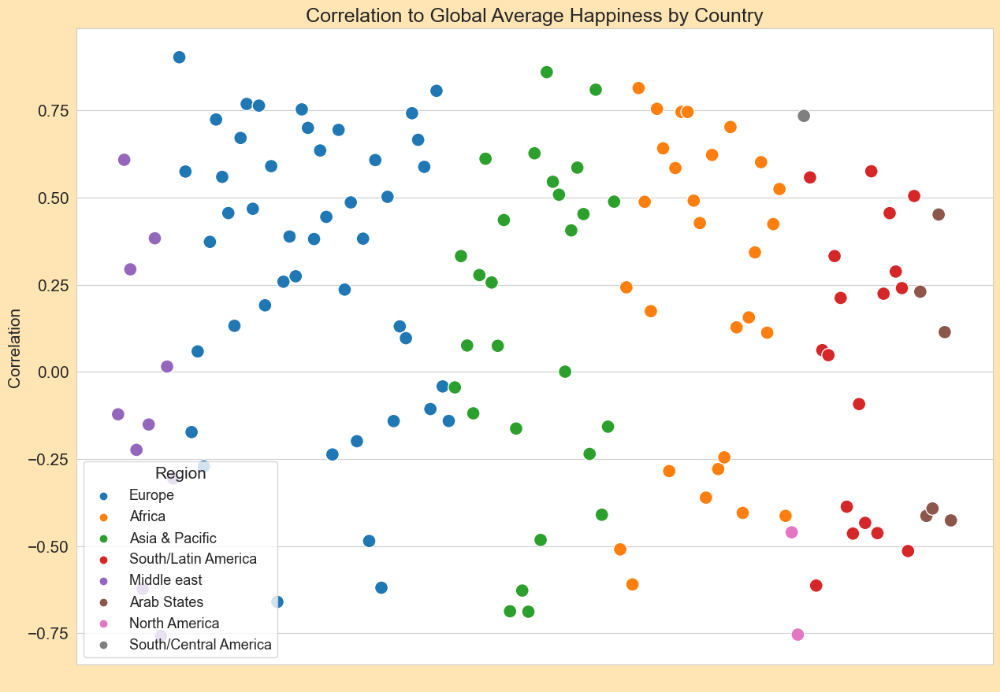

In [86]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_region, x ='index', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region', loc ='lower left', fontsize="13")   
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

Text(717.0833333333334, 0.5, 'Correlation')

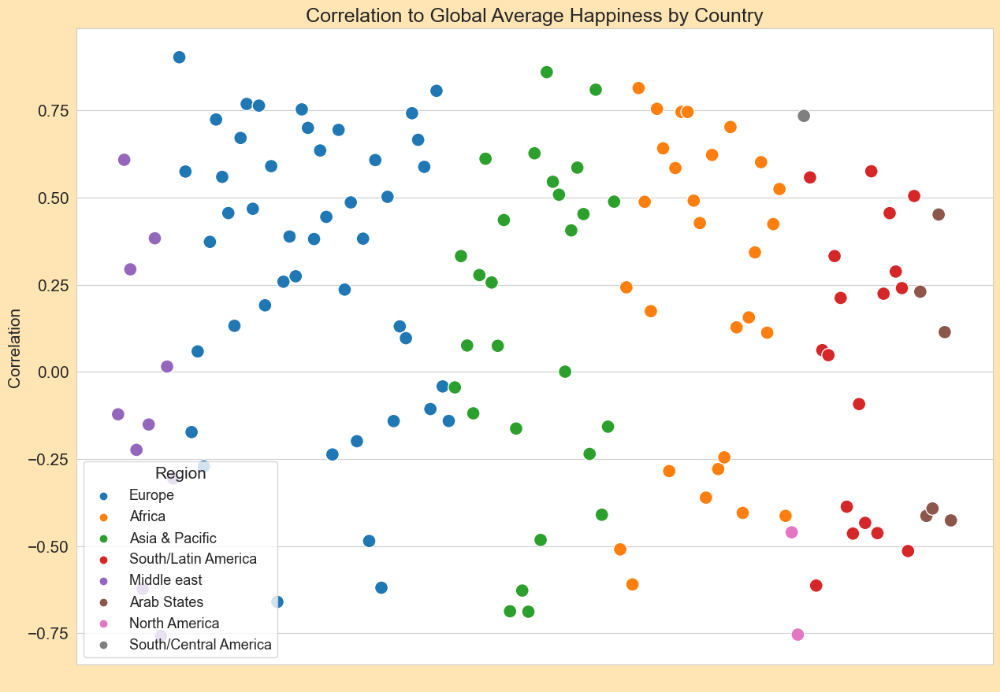

In [87]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_region, x ='index', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150).figure.savefig('output_figure.png',dpi=600)
plt.legend(title='Region', loc ='lower left', fontsize="13")
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

In [88]:
list(test_data_more10reports_pivot.columns)

['year',
 'Afghanistan',
 'Albania',
 'Algeria',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Benin',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Bulgaria',
 'Burkina Faso',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Congo Brazzaville',
 'Costa Rica',
 'Croatia',
 'Cyprus',
 'Czech Republic',
 "Côte D'Ivoire",
 'Denmark',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Estonia',
 'Ethiopia',
 'Finland',
 'France',
 'Gabon',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Guatemala',
 'Guinea',
 'Haiti',
 'Honduras',
 'Hong Kong',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kenya',
 'Kosovo',
 'Kuwait',
 'Kyrgyzstan',
 'Laos',
 'Latvia',
 'Lebanon',
 'Liberia',
 'Lithuania',
 'Luxembourg',
 'Macedonia',
 'Madagascar',
 'Malawi',
 'Malaysia',
 'Mali',

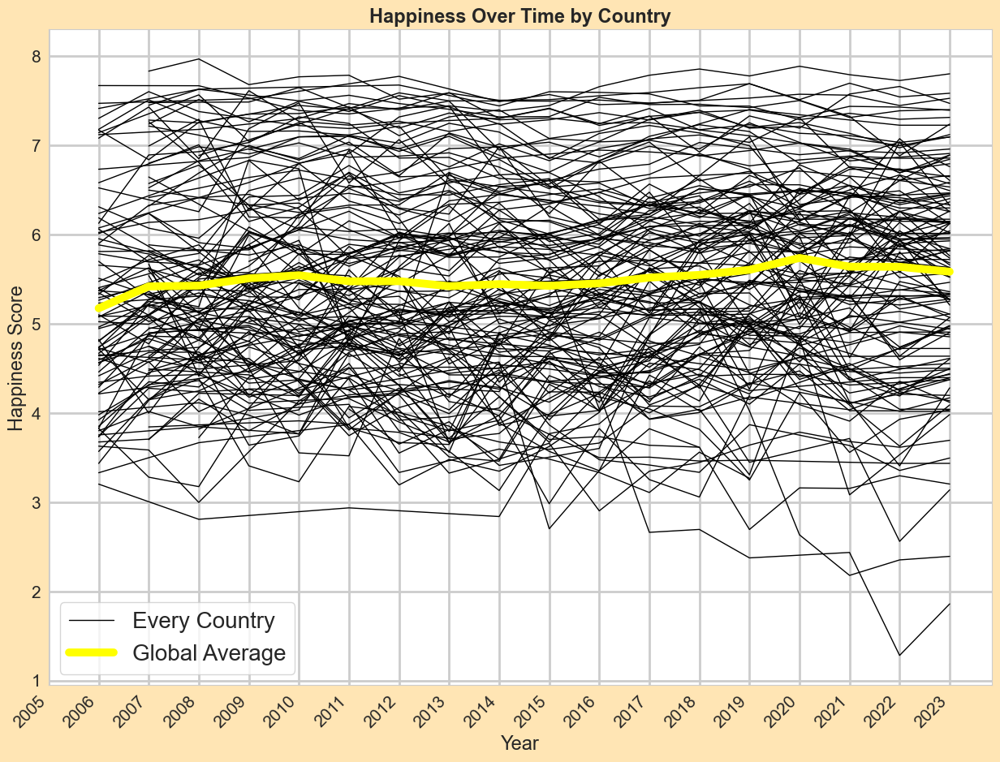

In [89]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Afghanistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Albania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Algeria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Argentina',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Armenia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Australia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Austria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Azerbaijan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bahrain',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bangladesh',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Belarus',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Belgium',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Benin',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bolivia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bosnia and Herzegovina',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Botswana',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Brazil',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bulgaria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Burkina Faso',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cambodia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cameroon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Canada',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Chad',color='black', linewidth=1, label='Every Country')
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Chile',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='China',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Colombia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Congo Brazzaville',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Costa Rica',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Croatia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cyprus',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Czech Republic',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Denmark',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Dominican Republic',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ecuador',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Egypt',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='El Salvador',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Estonia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ethiopia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Finland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='France',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Gabon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Georgia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Germany',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ghana',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Greece',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Guatemala',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Guinea',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Haiti',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Honduras',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Hong Kong',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Hungary',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iceland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='India',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Indonesia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iran',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iraq',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ireland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Israel',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Italy',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Japan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Jordan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kazakhstan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kenya',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kosovo',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kuwait',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kyrgyzstan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Laos',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Lebanon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Liberia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Lithuania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Luxembourg',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Macedonia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Madagascar',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malawi',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malaysia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mali',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malta',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mauritania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mexico',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Moldova',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mongolia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Montenegro',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Morocco',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mozambique',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Myanmar',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nepal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Netherlands',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='New Zealand',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nicaragua',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Niger',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nigeria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Norway',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Pakistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Palestine',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Panama',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Paraguay',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Peru',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Philippines',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Poland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Portugal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Romania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Russia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Rwanda',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Saudi Arabia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Senegal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Serbia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sierra Leone',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Slovakia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Slovenia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='South Korea',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='South Africa',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Spain',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sri Lanka',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Switzerland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sweden',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Taiwan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tajikistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tanzania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Thailand',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Togo',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tunisia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Turkiye',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uganda',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United Arab Emirates',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ukraine',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United Kingdom',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United States',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uruguay',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uzbekistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Venezuela',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Vietnam',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Yemen',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Zambia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Zimbabwe',color='black', linewidth=1)

ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Global Average', color='yellow', linewidth=7, label='Global Average')

ax.set_title('Happiness Over Time by Country',fontweight="bold", size=17)
ax.legend(loc='lower left', fontsize=20)
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [90]:
#################

In [91]:
##### 1 consecutive year
test_data = data
test_data_2 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [92]:
# Find the difference between 1 consecutive years by country

test_data_2['diff']=test_data_2.groupby(['country_name',test_data_2['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
test_data_2.head(20)

,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [93]:
top_1year_index = test_data_2.sort_values('diff', ascending = False).head(5).index.tolist()
bottom_1year_index = test_data_2.sort_values('diff', ascending = True).head(5).index.tolist()

In [94]:
top_1year_index

[132, 627, 2315, 614, 246]

In [95]:
bottom_1year_index

[629, 1196, 2316, 9, 2264]

In [96]:
a = top_1year_index
a = [x - 1 for x in a]
a

[131, 626, 2314, 613, 245]

In [97]:
top_1year_index = top_1year_index + a
top_1year_index.sort()
top_1year_index

[131, 132, 245, 246, 613, 614, 626, 627, 2314, 2315]

In [98]:
top_1year = test_data_2.iloc[top_1year_index].reset_index().drop('index', axis=1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,0.203211
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,-0.033099
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,-0.645637
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,-0.104041
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,-0.734692
9,Zambia,2020,4.837992,1.531196


In [99]:


top_1year['diff'] = top_1year['happiness_score'] - top_1year.groupby('country_name')['happiness_score'].shift(1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,NaN
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,NaN
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,NaN
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,NaN
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,NaN
9,Zambia,2020,4.837992,1.531196


<Axes: xlabel='year', ylabel='happiness_score'>

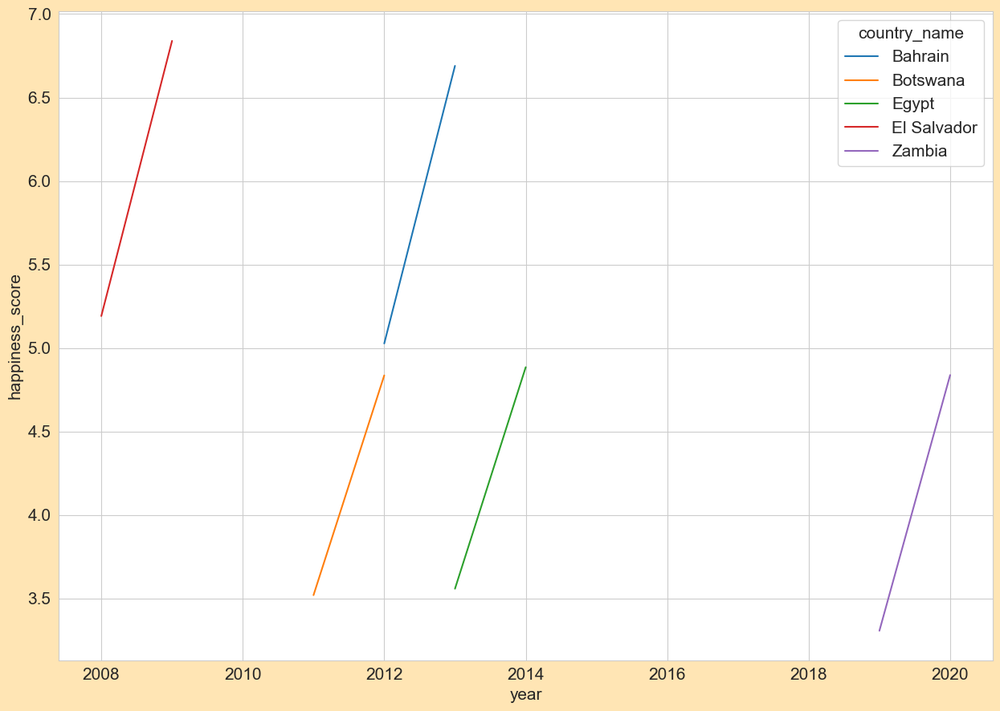

In [100]:
sns.lineplot(data=top_1year, x = 'year', y = 'happiness_score', hue  = 'country_name')

In [101]:
top_1year_countries = top_1year['country_name'].drop_duplicates().tolist()

top_1year_all = test_data_2[test_data_2['country_name'].isin(top_1year_countries)]

<Axes: xlabel='year', ylabel='happiness_score'>

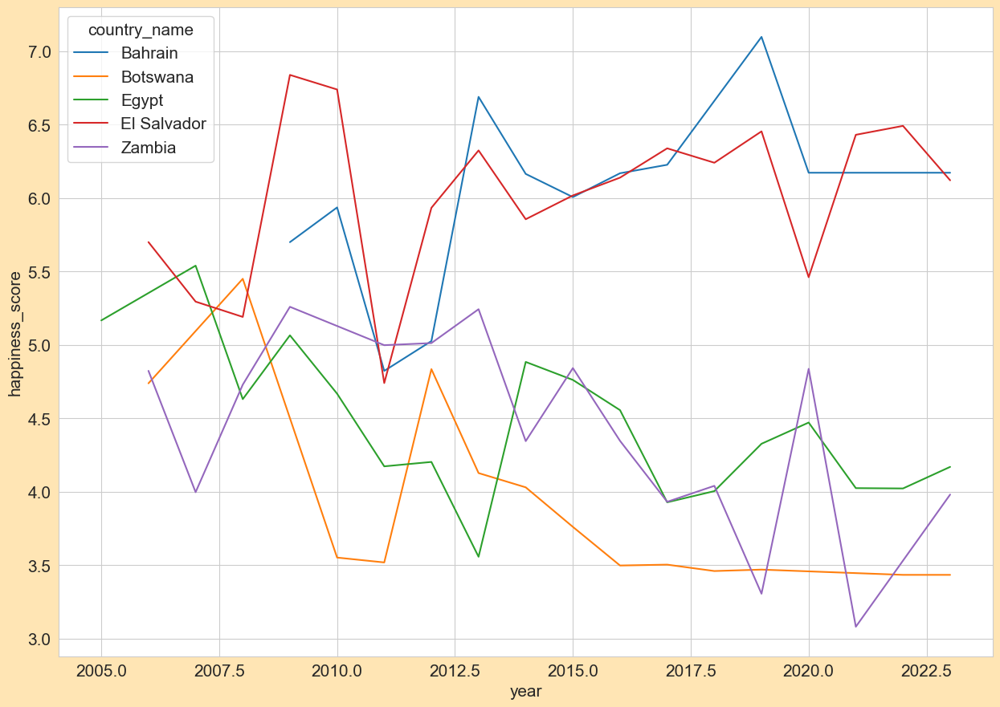

In [102]:
sns.lineplot(data=top_1year_all, x = 'year', y = 'happiness_score', hue = 'country_name')

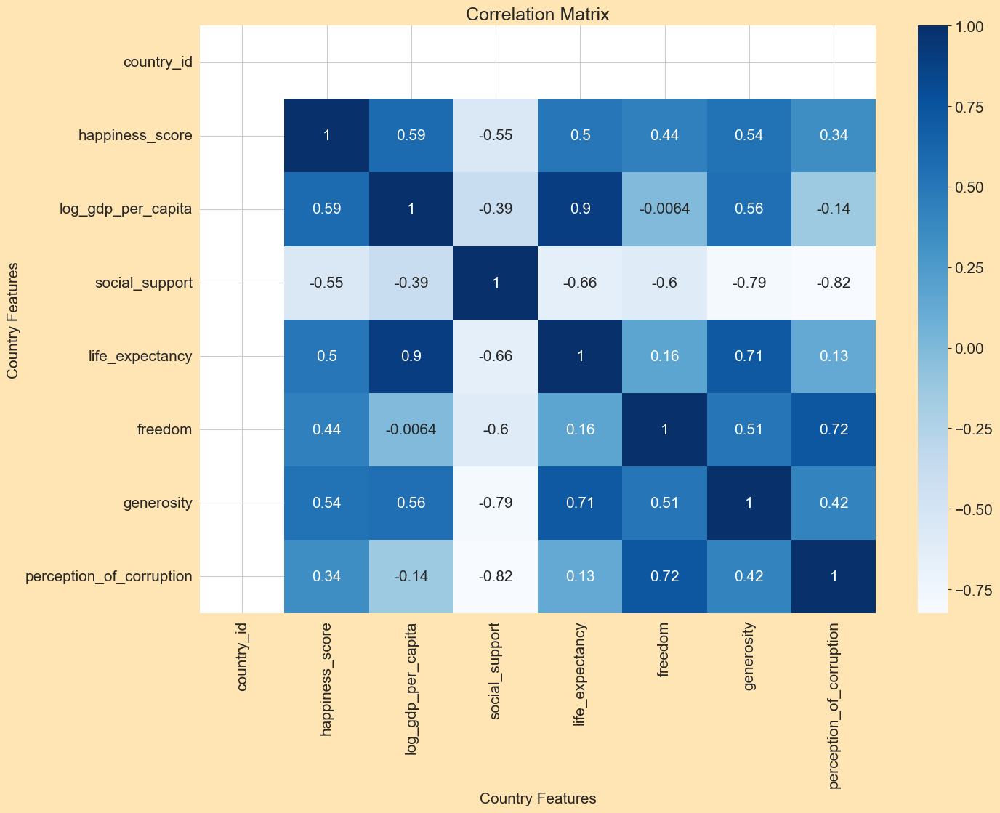

In [103]:
corr = data[data['country_name'] == 'Bahrain'].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

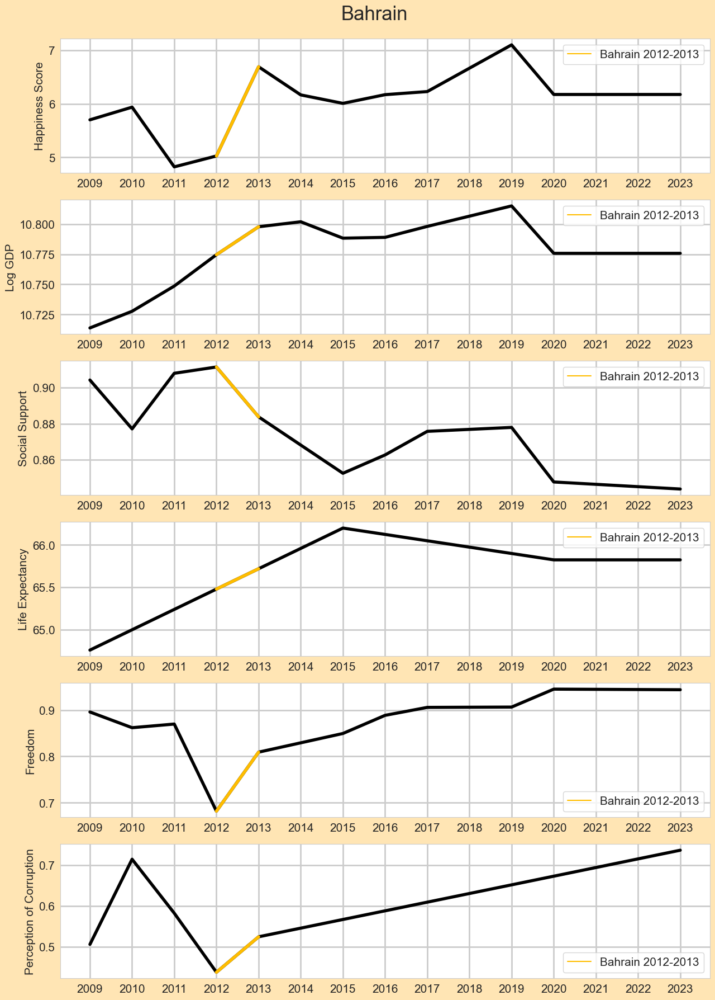

In [104]:
Bahrain_2012_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2012, 2013]) == True)]
Bahrain_2012_2013.loc[Bahrain_2012_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2012-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2012_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')


### 1 consecutive year

In [105]:
test_data = data
con_01 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [106]:
# Find the difference between 2 consecutive years by country

con_01['diff']= con_01.groupby(['country_name',con_01['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
con_01_all_diff = con_01[con_01['diff'].isna() == False]

print(con_01.shape)
con_01.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [107]:
con_01['diff'].describe()

count    1980.000000
mean        0.010683
std         0.378108
min        -1.998616
25%        -0.179920
50%         0.015136
75%         0.208412
max         1.662524
Name: diff, dtype: float64

In [108]:
# Mean and Standard Deviation

con_01_mean = 0.010683
con_01_std = 0.378108

# 2 Standard Deviations

print(con_01_std * 2)

0.756216


In [109]:
# show differences that are unusallly large (2 standard deviations away)

con_01_top = con_01[con_01['diff'] > con_01_mean + (con_01_std * 2)].sort_values('diff', ascending=False)

print(con_01_top.shape)
print(con_01_mean + (con_01_std * 2))
con_01_top.sort_values('diff', ascending=False)

(56, 4)
0.766899


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.662524
627,El Salvador,2009,6.839087,1.647593
2315,Zambia,2020,4.837992,1.531196
614,Egypt,2014,4.885073,1.326552
246,Botswana,2012,4.835939,1.316018
818,Guinea,2017,4.873723,1.270868
1565,Nigeria,2020,5.502948,1.236464
630,El Salvador,2012,5.934371,1.193077
1895,South Africa,2014,4.828456,1.167729
2301,Yemen,2019,4.196913,1.139399


In [110]:
con_01_top_index = con_01_top.index.tolist()
con_01_top_index.sort()

a = [x-1 for x in con_01_top_index]

con_01_top_all_index = con_01_top_index + a
con_01_top_all_index = list(set(con_01_top_all_index)) # Removing overlapping Country Year 
con_01_top_all_index.sort()

print(con_01_top_index[:12])
print(con_01_top_all_index[:12])

[7, 76, 132, 157, 199, 200, 212, 237, 246, 297, 337, 368]
[6, 7, 75, 76, 131, 132, 156, 157, 198, 199, 200, 211]


In [111]:
con_01 = data.iloc[con_01_top_all_index]

print(con_01.shape)
con_01.head(20)

(111, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
6,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
75,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,8,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
156,Bangladesh,9,Asia & Pacific,2022,3.407532,8.743257,0.403708,64.675003,0.864576,-0.054776,0.616872
157,Bangladesh,9,Asia & Pacific,2023,4.282100,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
198,Benin,11,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,11,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235


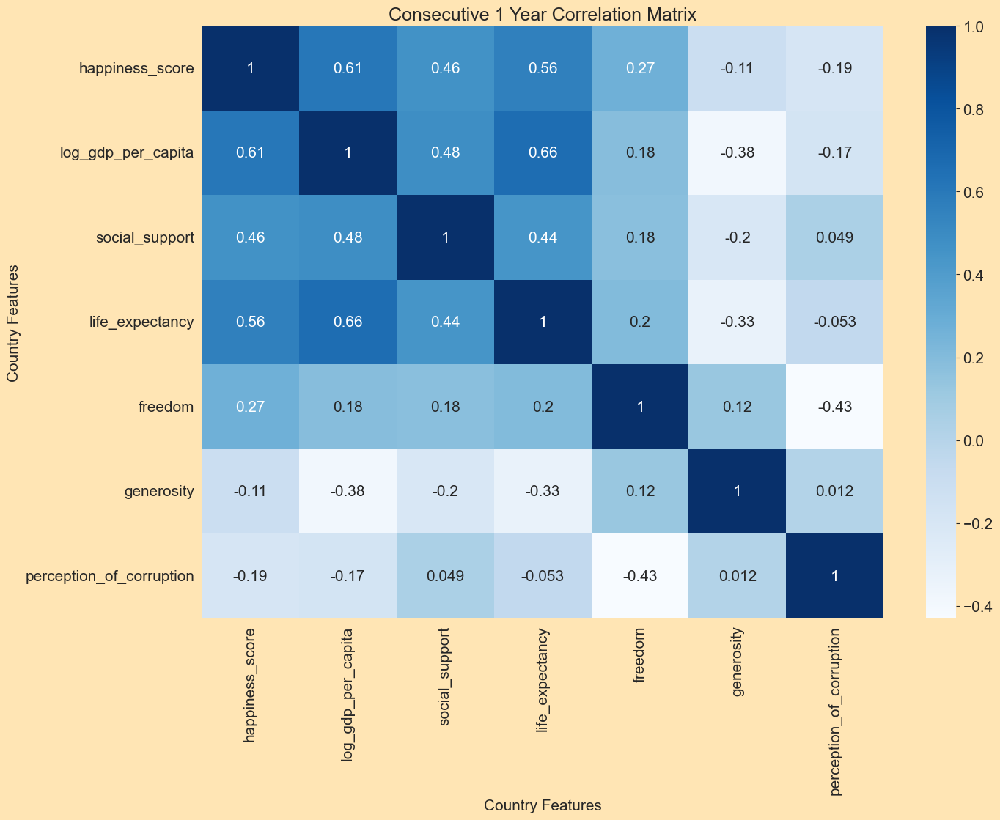

In [112]:
### What country feature correlates with happiness in con_01?

con_01_corr_matrix = con_01.drop(['country_id', 'year'], axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_01_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 1 Year Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [113]:
# Show what correlates to happiness in con_01

con_01_happiness_corr = con_01.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_01_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.605348
life_expectancy             0.563569
social_support              0.458343
freedom                     0.269329
generosity                 -0.106733
country_id                 -0.148957
perception_of_corruption   -0.188676
Name: happiness_score, dtype: float64

In [114]:
# Show all positive correlations in con_01

con_01_corr = con_01.corr(numeric_only = True)
con_01_corr_unstack = con_01_corr.unstack().sort_values()
con_01_high_corr = con_01_corr_unstack.sort_values(ascending=False)
con_01_high_corr = con_01_high_corr[(con_01_high_corr < 1) & (con_01_high_corr > 0.5)].drop_duplicates()
con_01_high_corr

life_expectancy  log_gdp_per_capita    0.661175
happiness_score  log_gdp_per_capita    0.605348
life_expectancy  happiness_score       0.563569
dtype: float64

### 2 consecutive years

In [115]:
test_data = data
con_02 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [116]:
# Find the difference between 2 consecutive years by country

con_02['diff']=con_02.groupby(['country_name',con_02['year'].diff().ne(1).cumsum()])['happiness_score'].diff(2)
con_02_all_diff = con_02[con_02['diff'].isna() == False]

print(con_02.shape)
con_02.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,1.034791
3,Afghanistan,2011,3.831719,-0.570059
4,Afghanistan,2012,3.782938,-0.975443
5,Afghanistan,2013,3.572100,-0.259619
6,Afghanistan,2014,3.130896,-0.652042
7,Afghanistan,2015,3.982855,0.410754
8,Afghanistan,2016,4.220169,1.089273
9,Afghanistan,2017,2.661718,-1.321136


In [117]:
con_02['diff'].describe()

count    1762.000000
mean        0.023076
std         0.453463
min        -2.533434
25%        -0.202323
50%         0.024372
75%         0.260243
max         1.865735
Name: diff, dtype: float64

In [118]:
# Mean and Standard Deviation

con_02_mean = 0.022910
con_02_std = 0.453627

# 2 Standard Deviations

print(con_02_std * 2)

0.907254


In [119]:
# show differences that are unusallly large (2 standard deviations away)

con_02_top = con_02[con_02['diff'] > con_02_mean + (con_02_std * 2)].sort_values('diff', ascending=False)

print(con_02_top.shape)
con_02_top.sort_values('diff', ascending=False)

(48, 4)


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.865735
200,Benin,2018,5.819827,1.812469
1198,Liberia,2017,4.424491,1.722900
819,Guinea,2018,5.252227,1.649372
631,El Salvador,2013,6.325063,1.583768
628,El Salvador,2010,6.739911,1.548417
627,El Salvador,2009,6.839087,1.543552
2322,Zimbabwe,2010,4.681570,1.507306
772,Ghana,2017,5.481311,1.495395
766,Ghana,2011,5.608200,1.410504


In [120]:
con_02_top_index = con_02_top.index.tolist()
con_02_top_index.sort()

a = [x-1 for x in con_02_top_index]
b = [x-2 for x in con_02_top_index]

con_02_top_all_index = con_02_top_index + a + b 
con_02_top_all_index = list(set(con_02_top_all_index)) # Removing overlapping Country Year 
con_02_top_all_index.sort()

print(con_02_top_index[:12])
print(con_02_top_all_index[:12])

[2, 8, 77, 132, 133, 199, 200, 246, 297, 371, 454, 500]
[0, 1, 2, 6, 7, 8, 75, 76, 77, 130, 131, 132]


In [121]:
con_02 = data.iloc[con_02_top_all_index]

print(con_02.shape)
con_02.head(20)

(136, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,1,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,1,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,1,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
6,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,1,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
75,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
77,Armenia,5,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522


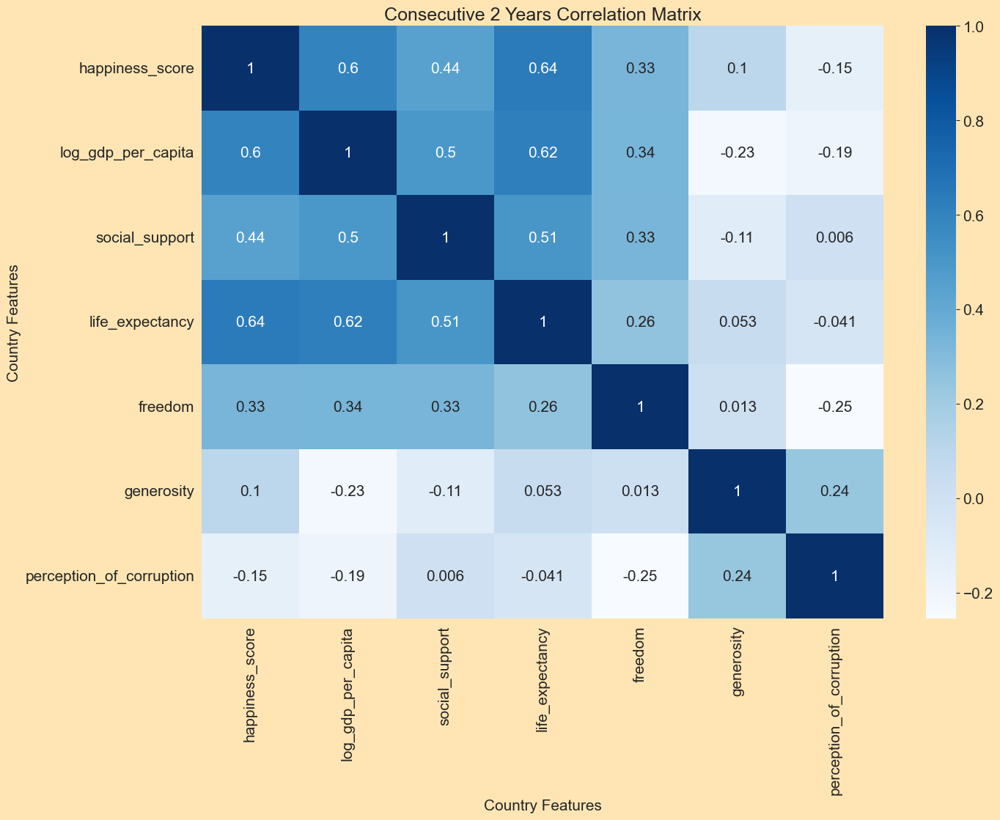

In [122]:
### What country feature correlates with happiness in con_02?

con_02_corr_matrix = con_02.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_02_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 2 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [123]:
# Show what correlates to happiness in con_02

con_02_happiness_corr = con_02.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_02_happiness_corr

happiness_score             1.000000
life_expectancy             0.640779
log_gdp_per_capita          0.599925
social_support              0.441986
freedom                     0.332106
generosity                  0.102097
country_id                  0.036208
perception_of_corruption   -0.146824
Name: happiness_score, dtype: float64

In [124]:
# Show all positive correlations in con_02

con_02_corr = con_02.corr(numeric_only = True)
con_02_corr_unstack = con_02_corr.unstack().sort_values()
con_02_high_corr = con_02_corr_unstack.sort_values(ascending=False)
con_02_high_corr = con_02_high_corr[(con_02_high_corr < 1) & (con_02_high_corr > 0.5)].drop_duplicates()
con_02_high_corr

life_expectancy     happiness_score       0.640779
log_gdp_per_capita  life_expectancy       0.618527
happiness_score     log_gdp_per_capita    0.599925
life_expectancy     social_support        0.505480
dtype: float64

### 3 consecutive years

In [125]:
test_data = data
con_03 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [126]:
# Find the difference between 3 consecutive years by country

con_03['diff']=con_03.groupby(['country_name',con_03['year'].diff().ne(1).cumsum()])['happiness_score'].diff(3)
con_03_all_diff = con_03[con_03['diff'].isna() == False]

print(con_03.shape)
con_03.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,0.108129
4,Afghanistan,2012,3.782938,-0.618841
5,Afghanistan,2013,3.572100,-1.186280
6,Afghanistan,2014,3.130896,-0.700824
7,Afghanistan,2015,3.982855,0.199917
8,Afghanistan,2016,4.220169,0.648068
9,Afghanistan,2017,2.661718,-0.469177


In [127]:
con_03['diff'].describe()

count    1582.000000
mean        0.033344
std         0.501231
min        -2.988377
25%        -0.213992
50%         0.035694
75%         0.314570
max         2.195163
Name: diff, dtype: float64

In [128]:
# Mean and Standard Deviation

con_03_mean = 0.033323
con_03_std = 0.501389

# 2 Standard Deviations

print(con_03_std * 2)

1.002778


In [129]:
# show differences that are unusallly large (2 standard deviations away)

con_03_top = con_03[con_03['diff'] > con_03_mean + (con_03_std * 2)].sort_values('diff', ascending=False)

print(con_03_top.shape)
con_03_top.sort_values('diff', ascending=False)

(31, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.195163
1200,Liberia,2019,5.121461,1.766785
819,Guinea,2018,5.252227,1.747533
2323,Zimbabwe,2011,4.845642,1.671378
772,Ghana,2017,5.481311,1.620960
1909,South Korea,2011,6.946599,1.556974
2079,Togo,2017,4.360805,1.521846
199,Benin,2017,4.853181,1.505762
1549,Niger,2018,5.164007,1.492553
541,Côte D'Ivoire,2017,5.037735,1.467366


In [130]:
con_03_top_index = con_03_top.index.tolist()
con_03_top_index.sort()

a = [x-1 for x in con_03_top_index]
b = [x-2 for x in con_03_top_index]
c = [x-3 for x in con_03_top_index]


con_03_top_all_index = con_03_top_index + a + b + c
con_03_top_all_index = list(set(con_03_top_all_index)) # Removing overlapping Country Year 
con_03_top_all_index.sort()

print(con_03_top_index[:12])
print(con_03_top_all_index[:12])

[77, 121, 133, 199, 200, 299, 380, 455, 500, 541, 627, 628]
[74, 75, 76, 77, 118, 119, 120, 121, 130, 131, 132, 133]


In [131]:
con_03 = data.iloc[con_03_top_all_index]

print(con_03.shape)
con_03.head(10)

(103, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
74,Armenia,5,Europe,2016,4.325472,9.357068,0.709218,66.275002,0.610987,-0.175243,0.921421
75,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
77,Armenia,5,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473
118,Azerbaijan,139,Europe,2010,4.218611,9.552670,0.687001,61.700001,0.501071,-0.125315,0.858347
119,Azerbaijan,139,Europe,2011,4.680470,9.540639,0.725194,61.980000,0.537484,-0.107818,0.795119
120,Azerbaijan,139,Europe,2012,4.910772,9.548773,0.761873,62.259998,0.598859,-0.143209,0.763155
121,Azerbaijan,139,Europe,2013,5.481178,9.592311,0.769690,62.540001,0.671957,-0.171054,0.698820
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915


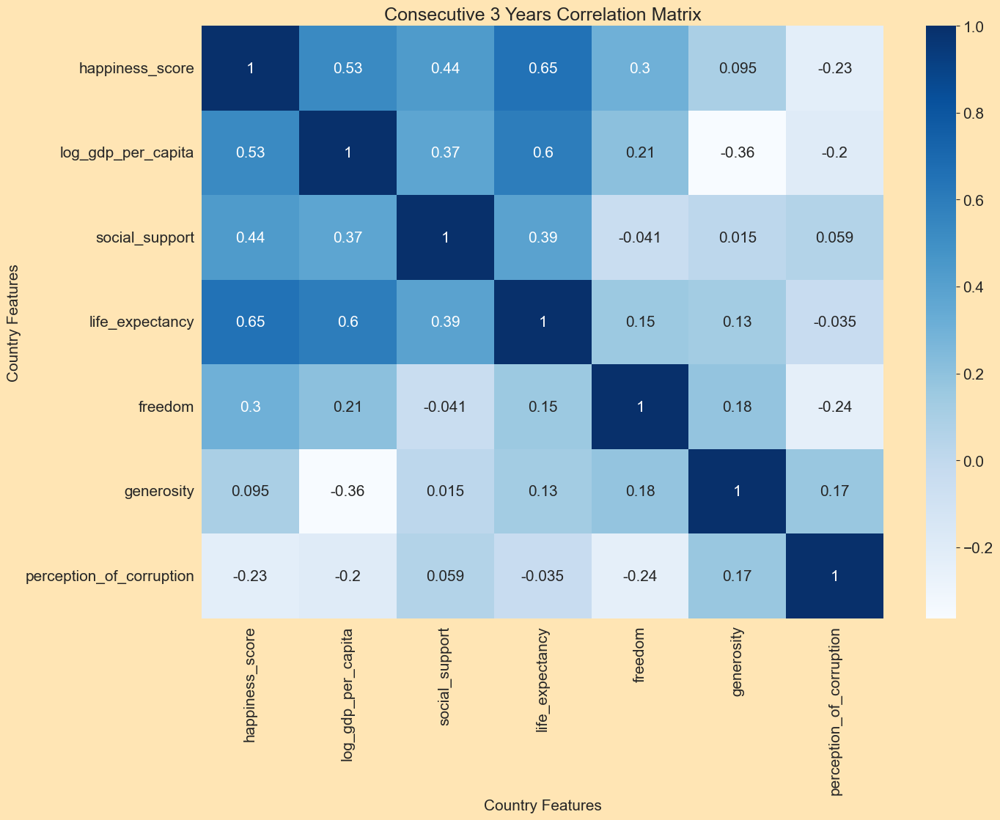

In [132]:
### What country feature correlates with happiness in con_03?

con_03_corr_matrix = con_03.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_03_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 3 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [133]:
# Show what correlates to happiness in con_3

con_03_happiness_corr = con_03.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_03_happiness_corr

happiness_score             1.000000
life_expectancy             0.651544
log_gdp_per_capita          0.529247
social_support              0.435028
freedom                     0.304465
generosity                  0.095338
country_id                 -0.136477
perception_of_corruption   -0.230081
Name: happiness_score, dtype: float64

In [134]:
# Show all positive correlations in con_3

con_03_corr = con_03.corr(numeric_only = True)
con_03_corr_unstack = con_03_corr.unstack().sort_values()
con_03_high_corr = con_03_corr_unstack.sort_values(ascending=False)
con_03_high_corr = con_03_high_corr[(con_03_high_corr < 1) & (con_03_high_corr > 0.5)].drop_duplicates()
con_03_high_corr

happiness_score  life_expectancy       0.651544
life_expectancy  log_gdp_per_capita    0.597965
happiness_score  log_gdp_per_capita    0.529247
dtype: float64

### 4 consecutive years

In [135]:
test_data = data
con_04 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [136]:
# Find the difference between 2 consecutive years by country

con_04['diff']=con_04.groupby(['country_name',con_04['year'].diff().ne(1).cumsum()])['happiness_score'].diff(4)
con_04_all_diff = con_04[con_04['diff'].isna() == False]

print(con_04.shape)
con_04.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,0.059348
5,Afghanistan,2013,3.572100,-0.829678
6,Afghanistan,2014,3.130896,-1.627485
7,Afghanistan,2015,3.982855,0.151135
8,Afghanistan,2016,4.220169,0.437231
9,Afghanistan,2017,2.661718,-0.910382


In [137]:
con_04['diff'].describe()

count    1422.000000
mean        0.045261
std         0.549342
min        -3.025463
25%        -0.244400
50%         0.046376
75%         0.370815
max         2.472408
Name: diff, dtype: float64

In [138]:
# Mean and Standard Deviation

con_04_mean = 0.045261
con_04_std = 0.549342

# 2 Standard Deviations

print(con_04_std * 2)

1.098684


In [139]:
# show differences that are unusallly large (2 standard deviations away)

con_04_top = con_04[con_04['diff'] > con_04_mean + (con_04_std * 2)].sort_values('diff', ascending=False)

print(con_04_top.shape)
con_04_top.sort_values('diff', ascending=False)

(29, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.472408
1200,Liberia,2019,5.121461,2.419870
819,Guinea,2018,5.252227,1.839744
2324,Zimbabwe,2012,4.955101,1.780837
542,Côte D'Ivoire,2018,5.268375,1.698006
2323,Zimbabwe,2011,4.845642,1.565395
300,Burkina Faso,2018,4.927236,1.445888
454,Congo Brazzaville,2018,5.490214,1.434202
1138,Kyrgyzstan,2020,6.249586,1.393052
1107,Kosovo,2018,6.391826,1.391450


In [140]:
con_04_top_index = con_04_top.index.tolist()
con_04_top_index.sort()

a = [x-1 for x in con_04_top_index]
b = [x-2 for x in con_04_top_index]
c = [x-3 for x in con_04_top_index]
d = [x-4 for x in con_04_top_index]

con_04_top_all_index = con_04_top_index + a + b + c + d
con_04_top_all_index = list(set(con_04_top_all_index)) # Removing overlapping Country Year 
con_04_top_all_index.sort()

print(con_04_top_index[:12])
print(con_04_top_all_index[:12])

[134, 199, 200, 201, 299, 300, 322, 454, 541, 542, 633, 819]
[130, 131, 132, 133, 134, 195, 196, 197, 198, 199, 200, 201]


In [141]:
con_04 = data.iloc[con_04_top_all_index]

print(con_04.shape)
con_04.head(10)

(113, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,8,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,8,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,8,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
195,Benin,11,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,11,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,11,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098
198,Benin,11,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,11,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235


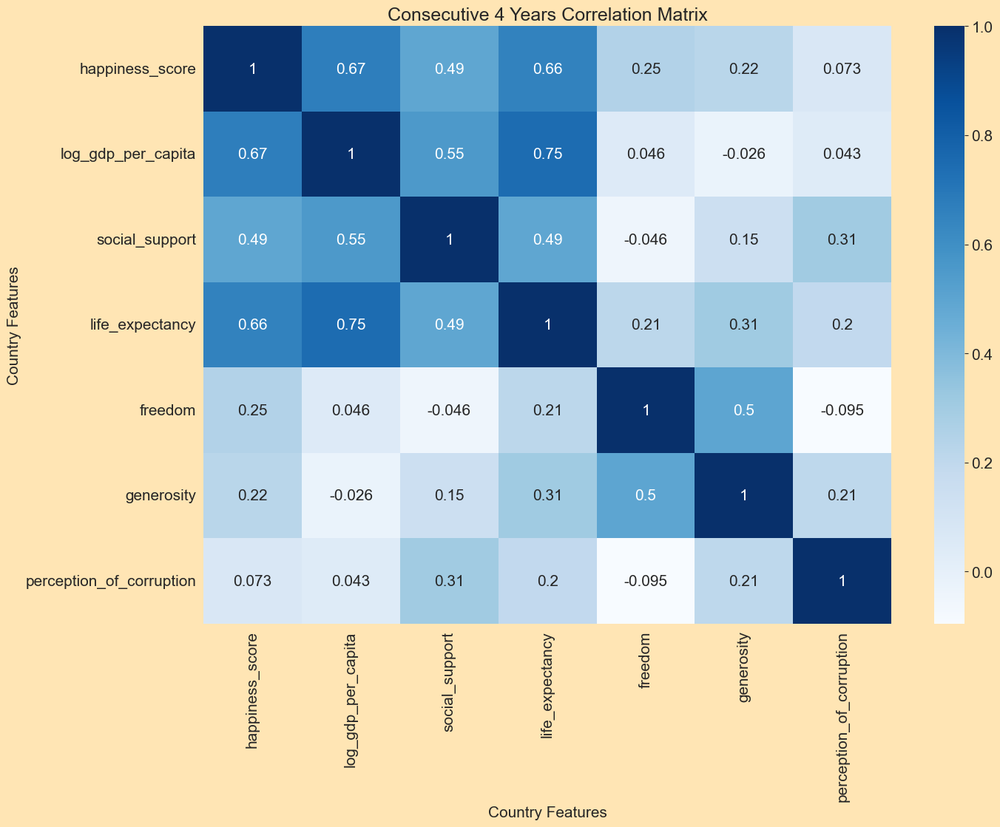

In [142]:
### What country feature correlates with happiness in con_04?

con_04_corr_matrix = con_04.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_04_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 4 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [143]:
# Show what correlates to happiness in con_04

con_04_happiness_corr = con_04.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_04_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.674586
life_expectancy             0.657116
social_support              0.494065
freedom                     0.247808
generosity                  0.224936
perception_of_corruption    0.072863
country_id                 -0.108178
Name: happiness_score, dtype: float64

In [144]:
# Show all positive correlations in con_04

con_04_corr = con_04.corr(numeric_only = True)
con_04_corr_unstack = con_04_corr.unstack().sort_values()
con_04_high_corr = con_04_corr_unstack.sort_values(ascending=False)
con_04_high_corr = con_04_high_corr[(con_04_high_corr < 1) & (con_04_high_corr > 0.5)].drop_duplicates()
con_04_high_corr

life_expectancy     log_gdp_per_capita    0.747210
log_gdp_per_capita  happiness_score       0.674586
life_expectancy     happiness_score       0.657116
log_gdp_per_capita  social_support        0.553703
dtype: float64

### 5 consecutive years

In [145]:
test_data = data
con_05 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [146]:
con_05['diff']=con_05.groupby(['country_name',con_05['year'].diff().ne(1).cumsum()])['happiness_score'].diff(5)
con_05_all_diff = con_05[con_05['diff'].isna() == False]

print(con_05.shape)
con_05.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,-0.151489
6,Afghanistan,2014,3.130896,-1.270883
7,Afghanistan,2015,3.982855,-0.775526
8,Afghanistan,2016,4.220169,0.388449
9,Afghanistan,2017,2.661718,-1.121219


In [147]:
con_05['diff'].describe()

count    1275.000000
mean        0.065848
std         0.591635
min        -3.091914
25%        -0.265868
50%         0.059663
75%         0.429354
max         2.340414
Name: diff, dtype: float64

In [148]:
# Mean and Standard Deviation

con_05_mean = 0.065848
con_05_std = 0.591635

# 2 Standard Deviations

print(con_05_std * 2)

1.18327


In [149]:
con_05_top = con_05[con_05['diff'] > con_05_mean + (con_05_std * 2)].sort_values('diff', ascending=False)

print(con_05_top.shape)
con_05_top.sort_values('diff', ascending=False)

(31, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.340414
543,Côte D'Ivoire,2019,5.392012,1.821644
2324,Zimbabwe,2012,4.955101,1.674854
199,Benin,2017,4.853181,1.659712
201,Benin,2019,4.976361,1.628942
1909,South Korea,2011,6.946599,1.614421
300,Burkina Faso,2018,4.927236,1.601286
454,Congo Brazzaville,2018,5.490214,1.535264
542,Côte D'Ivoire,2018,5.268375,1.529009
2325,Zimbabwe,2013,4.690188,1.515924


In [150]:
con_05_top_index = con_05_top.index.tolist()
con_05_top_index.sort()

a = [x-1 for x in con_05_top_index]
b = [x-2 for x in con_05_top_index]
c = [x-3 for x in con_05_top_index]
d = [x-4 for x in con_05_top_index]
e = [x-5 for x in con_05_top_index]

con_05_top_all_index = con_05_top_index + a + b + c + d + e
con_05_top_all_index = list(set(con_05_top_all_index)) # Removing overlapping Country Year 
con_05_top_all_index.sort()

print(con_05_top_index[:12])
print(con_05_top_all_index[:12])

[135, 199, 200, 201, 300, 301, 322, 454, 500, 542, 543, 634]
[130, 131, 132, 133, 134, 135, 194, 195, 196, 197, 198, 199]


In [151]:
con_05 = data.iloc[con_05_top_all_index]

print(con_05.shape)
con_05.head(10)

(141, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,8,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,8,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,8,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
135,Bahrain,8,Arab States,2016,6.169673,10.789037,0.862700,66.125000,0.888691,0.083302,NaN
194,Benin,11,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,11,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,11,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,11,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098


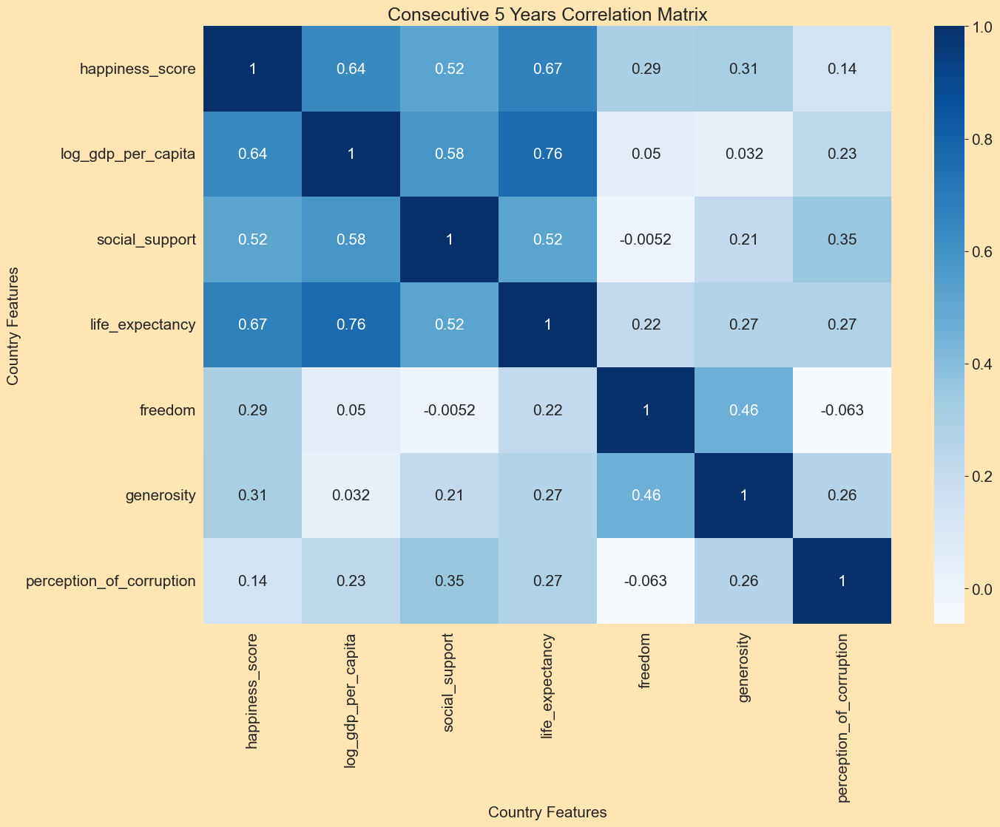

In [152]:
### What country feature correlates with happiness in con_05?

con_05_corr_matrix = con_05.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_05_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 5 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [153]:
# Show what correlates to happiness in con_05

con_05_happiness_corr = con_05.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_05_happiness_corr

happiness_score             1.000000
life_expectancy             0.669275
log_gdp_per_capita          0.638646
social_support              0.515857
generosity                  0.305687
freedom                     0.293084
perception_of_corruption    0.138979
country_id                  0.023888
Name: happiness_score, dtype: float64

In [154]:
# Show all positive correlations in con_05

con_05_corr = con_05.corr(numeric_only = True)
con_05_corr_unstack = con_05_corr.unstack().sort_values()
con_05_high_corr = con_05_corr_unstack.sort_values(ascending=False)
con_05_high_corr = con_05_high_corr[(con_05_high_corr < 1) & (con_05_high_corr > 0.5)].drop_duplicates()
con_05_high_corr

log_gdp_per_capita  life_expectancy       0.762204
happiness_score     life_expectancy       0.669275
                    log_gdp_per_capita    0.638646
social_support      log_gdp_per_capita    0.584694
life_expectancy     social_support        0.516787
happiness_score     social_support        0.515857
dtype: float64

### 6 consecutive years

In [155]:
test_data = data
con_06 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [156]:
con_06['diff']=con_06.groupby(['country_name',con_06['year'].diff().ne(1).cumsum()])['happiness_score'].diff(6)
con_06_all_diff = con_06[con_06['diff'].isna() == False]

print(con_06.shape)
con_06.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,-0.592694
7,Afghanistan,2015,3.982855,-0.418924
8,Afghanistan,2016,4.220169,-0.538212
9,Afghanistan,2017,2.661718,-1.170001


In [157]:
con_06['diff'].describe()

count    1136.000000
mean        0.087080
std         0.627010
min        -3.437340
25%        -0.249512
50%         0.072237
75%         0.468112
max         2.626358
Name: diff, dtype: float64

In [158]:
# Mean and Standard Deviation

con_06_mean = 0.087080
con_06_std = 0.627010

# 2 Standard Deviations

print(con_06_std * 2)

1.25402


In [159]:
con_06_top = con_06[con_06['diff'] > con_06_mean + (con_06_std * 2)].sort_values('diff', ascending=False)

print(con_06_top.shape)
con_06_top.sort_values('diff', ascending=False)

(23, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.626358
2270,Venezuela,2022,5.948992,1.907877
1800,Senegal,2019,5.488737,1.841370
823,Guinea,2022,5.317493,1.714638
544,Côte D'Ivoire,2020,5.256504,1.686135
458,Congo Brazzaville,2022,5.804919,1.685425
543,Côte D'Ivoire,2019,5.392012,1.652647
819,Guinea,2018,5.252227,1.600672
635,El Salvador,2017,6.339318,1.598023
1110,Kosovo,2021,6.648499,1.571039


In [160]:
con_06_top_index = con_06_top.index.tolist()
con_06_top_index.sort()

a = [x-1 for x in con_06_top_index]
b = [x-2 for x in con_06_top_index]
c = [x-3 for x in con_06_top_index]
d = [x-4 for x in con_06_top_index]
e = [x-5 for x in con_06_top_index]
f = [x-6 for x in con_06_top_index]

con_06_top_all_index = con_06_top_index + a + b + c + d + e + f
con_06_top_all_index = list(set(con_06_top_all_index)) # Removing overlapping Country Year 
con_06_top_all_index.sort()

print(con_06_top_index[:12])
print(con_06_top_all_index[:12])

[136, 200, 201, 301, 454, 458, 543, 544, 635, 775, 819, 821]
[130, 131, 132, 133, 134, 135, 136, 194, 195, 196, 197, 198]


In [161]:
con_06 = data.iloc[con_06_top_all_index]

print(con_06.shape)
con_06.head(10)

(129, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,8,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,8,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,8,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
135,Bahrain,8,Arab States,2016,6.169673,10.789037,0.862700,66.125000,0.888691,0.083302,NaN
136,Bahrain,8,Arab States,2017,6.227321,10.798135,0.875747,66.050003,0.905859,0.130106,NaN
194,Benin,11,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,11,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,11,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827


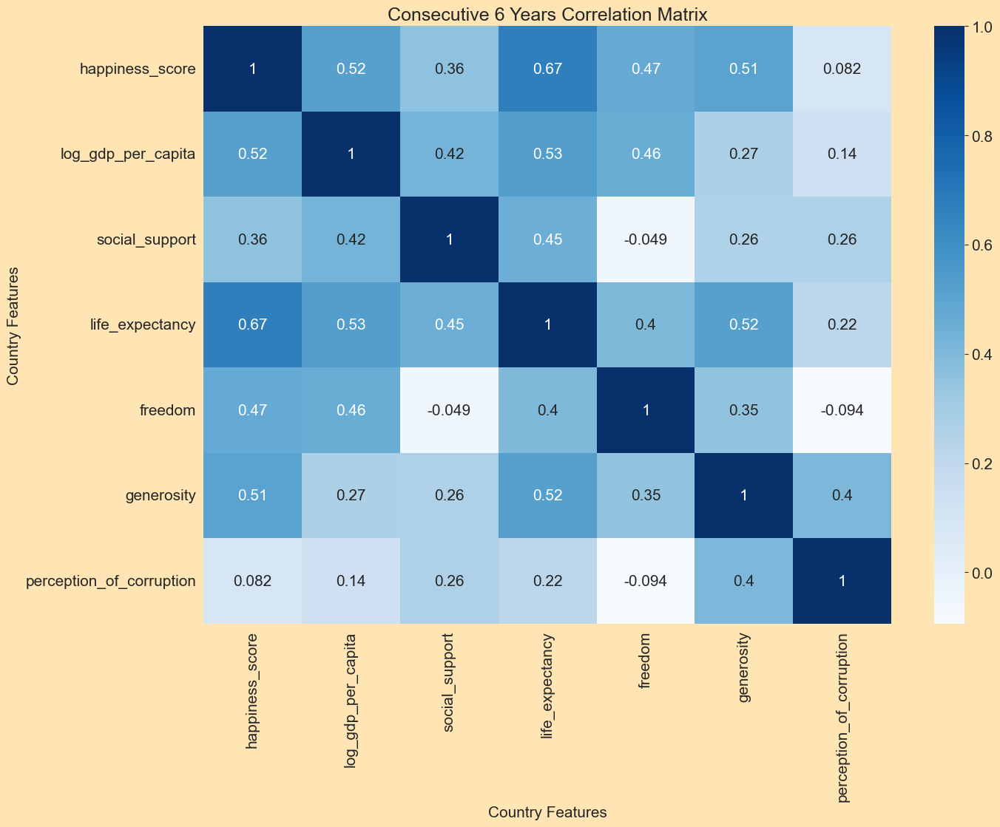

In [162]:
### What country feature correlates with happiness in con_06?

con_06_corr_matrix = con_06.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_06_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 6 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [163]:
# Show what correlates to happiness in con_06

con_06_happiness_corr = con_06.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_06_happiness_corr

happiness_score             1.000000
life_expectancy             0.670599
log_gdp_per_capita          0.518991
generosity                  0.509662
freedom                     0.470413
social_support              0.355116
perception_of_corruption    0.081593
country_id                  0.007860
Name: happiness_score, dtype: float64

In [164]:
# Show all positive correlations in con_06

con_06_corr = con_06.corr(numeric_only = True)
con_06_corr_unstack = con_06_corr.unstack().sort_values()
con_06_high_corr = con_06_corr_unstack.sort_values(ascending=False)
con_06_high_corr = con_06_high_corr[(con_06_high_corr < 1) & (con_06_high_corr > 0.5)].drop_duplicates()
con_06_high_corr

life_expectancy     happiness_score       0.670599
country_id          social_support        0.604398
log_gdp_per_capita  life_expectancy       0.531636
generosity          life_expectancy       0.522730
happiness_score     log_gdp_per_capita    0.518991
generosity          happiness_score       0.509662
dtype: float64

### 7 consecutive years

In [165]:
test_data = data
con_07 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [166]:
con_07['diff']=con_07.groupby(['country_name',con_07['year'].diff().ne(1).cumsum()])['happiness_score'].diff(7)
con_07_all_diff = con_07[con_07['diff'].isna() == False]

print(con_07.shape)
con_07.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,0.259265
8,Afghanistan,2016,4.220169,-0.181610
9,Afghanistan,2017,2.661718,-2.096663


In [167]:
con_07['diff'].describe()

count    1002.000000
mean        0.107698
std         0.648259
min        -3.147688
25%        -0.250718
50%         0.106192
75%         0.519246
max         1.949548
Name: diff, dtype: float64

In [168]:
# Mean and Standard Deviation

con_07_mean = 0.107698
con_07_std = 0.648259

# 2 Standard Deviations

print(con_07_std * 2)

1.296518


In [169]:
con_07_top = con_07[con_07['diff'] > con_07_mean + (con_07_std * 2)].sort_values('diff', ascending=False)

print(con_07_top.shape)
con_07_top.sort_values('diff', ascending=False)

(14, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,1.949548
1800,Senegal,2019,5.488737,1.820000
823,Guinea,2022,5.317493,1.812799
201,Benin,2019,4.976361,1.782892
1735,Romania,2020,6.785142,1.703558
1110,Kosovo,2021,6.648499,1.648124
285,Bulgaria,2020,5.597723,1.604702
1107,Kosovo,2018,6.391826,1.532324
822,Guinea,2021,4.944540,1.532057
544,Côte D'Ivoire,2020,5.256504,1.517138


In [170]:
con_07_top_index = con_07_top.index.tolist()
con_07_top_index.sort()

a = [x-1 for x in con_07_top_index]
b = [x-2 for x in con_07_top_index]
c = [x-3 for x in con_07_top_index]
d = [x-4 for x in con_07_top_index]
e = [x-5 for x in con_07_top_index]
f = [x-6 for x in con_07_top_index]
g = [x-7 for x in con_07_top_index]

con_07_top_all_index = con_07_top_index + a + b + c + d + e + f + g
con_07_top_all_index = list(set(con_07_top_all_index)) # Removing overlapping Country Year 
con_07_top_all_index.sort()

print(con_07_top_index[:12])
print(con_07_top_all_index[:12])

[200, 201, 285, 544, 545, 636, 822, 823, 824, 1107, 1110, 1735]
[193, 194, 195, 196, 197, 198, 199, 200, 201, 278, 279, 280]


In [171]:
con_07 = data.iloc[con_07_top_all_index]

print(con_07.shape)
con_07.head(10)

(79, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
193,Benin,11,Africa,2011,3.870280,7.876235,0.477494,53.259998,0.772919,-0.142097,0.849472
194,Benin,11,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,11,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,11,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,11,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098
198,Benin,11,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,11,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235
200,Benin,11,Africa,2018,5.819827,8.019668,0.503544,55.200001,0.713264,0.002967,0.746511
201,Benin,11,Africa,2019,4.976361,8.057199,0.442154,55.500000,0.770360,-0.015219,0.698347
278,Bulgaria,16,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047


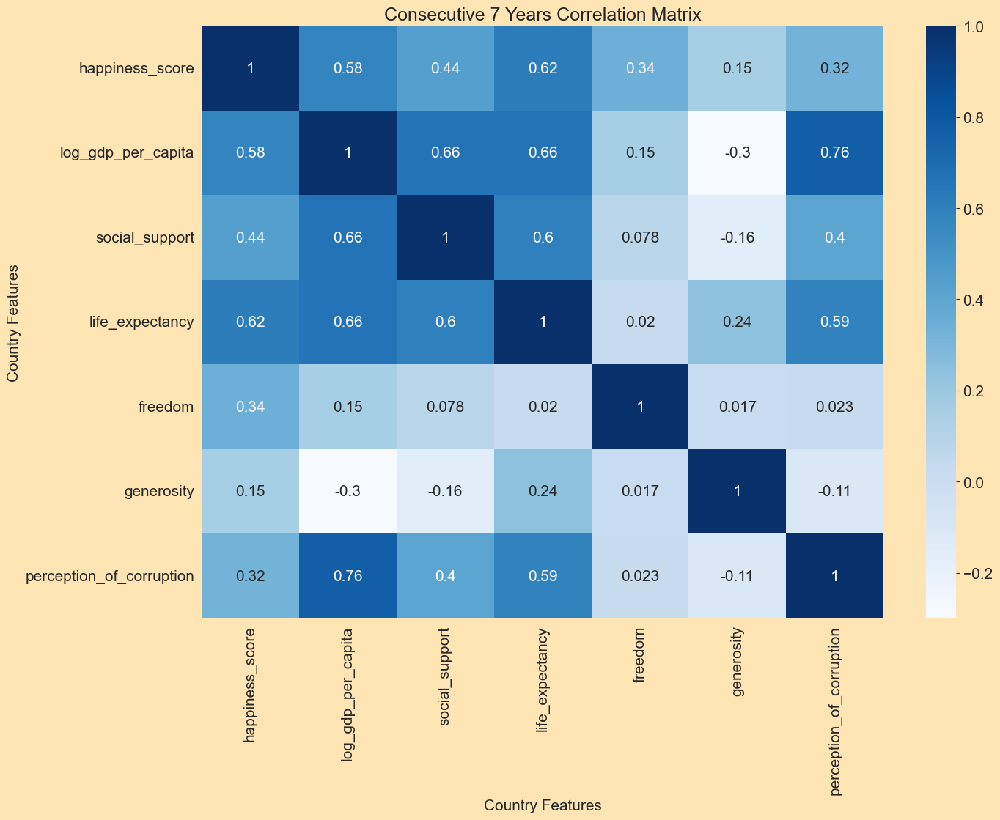

In [172]:
### What country feature correlates with happiness in con_07?

con_07_corr_matrix = con_07.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_07_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 7 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [173]:
# Show what correlates to happiness in con_07

con_07_happiness_corr = con_07.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_07_happiness_corr

happiness_score             1.000000
life_expectancy             0.616786
log_gdp_per_capita          0.579583
social_support              0.441358
freedom                     0.341853
perception_of_corruption    0.321987
country_id                  0.195127
generosity                  0.152653
Name: happiness_score, dtype: float64

In [174]:
# Show all positive correlations in con_07

con_07_corr = con_07.corr(numeric_only = True)
con_07_corr_unstack = con_07_corr.unstack().sort_values()
con_07_high_corr = con_07_corr_unstack.sort_values(ascending=False)
con_07_high_corr = con_07_high_corr[(con_07_high_corr < 1) & (con_07_high_corr > 0.5)].drop_duplicates()
con_07_high_corr

perception_of_corruption  log_gdp_per_capita          0.763797
log_gdp_per_capita        life_expectancy             0.664332
social_support            log_gdp_per_capita          0.660466
life_expectancy           happiness_score             0.616786
                          social_support              0.600690
                          perception_of_corruption    0.591794
log_gdp_per_capita        happiness_score             0.579583
dtype: float64

### 8 consecutive years

In [175]:
test_data = data
con_08 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [176]:
con_08['diff']=con_08.groupby(['country_name',con_08['year'].diff().ne(1).cumsum()])['happiness_score'].diff(8)
con_08_all_diff = con_08[con_08['diff'].isna() == False]

print(con_08.shape)
con_08.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,0.496579
9,Afghanistan,2017,2.661718,-1.740060


In [177]:
con_08['diff'].describe()

count    873.000000
mean       0.117230
std        0.673061
min       -2.880598
25%       -0.253854
50%        0.128982
75%        0.531732
max        1.937927
Name: diff, dtype: float64

In [178]:
# Mean and Standard Deviation

con_08_mean = 0.117230
con_08_std = 0.673061

# 2 Standard Deviations

print(con_08_std * 2)

1.346122


In [179]:
con_08_top = con_08[con_08['diff'] > con_08_mean + (con_08_std * 2)].sort_values('diff', ascending=False)

print(con_08_top.shape)
con_08_top.sort_values('diff', ascending=False)

(13, 4)


,country_name,year,happiness_score,diff
1902,South Africa,2021,5.598654,1.937927
823,Guinea,2022,5.317493,1.905010
1527,Nicaragua,2014,6.275267,1.815108
1481,Nepal,2020,5.982410,1.749166
458,Congo Brazzaville,2022,5.804919,1.748906
637,El Salvador,2019,6.454821,1.713526
1800,Senegal,2019,5.488737,1.654535
1480,Nepal,2019,5.448725,1.639280
1735,Romania,2020,6.785142,1.618268
824,Guinea,2023,5.071700,1.567007


In [180]:
con_08_top_index = con_08_top.index.tolist()
con_08_top_index.sort()

a = [x-1 for x in con_08_top_index]
b = [x-2 for x in con_08_top_index]
c = [x-3 for x in con_08_top_index]
d = [x-4 for x in con_08_top_index]
e = [x-5 for x in con_08_top_index]
f = [x-6 for x in con_08_top_index]
g = [x-7 for x in con_08_top_index]
h = [x-8 for x in con_08_top_index]

con_08_top_all_index = con_08_top_index + a + b + c + d + e + f + g + h
con_08_top_all_index = list(set(con_08_top_all_index)) # Removing overlapping Country Year 
con_08_top_all_index.sort()

print(con_08_top_index[:12])
print(con_08_top_all_index[:12])

[458, 637, 823, 824, 1108, 1480, 1481, 1527, 1735, 1736, 1800, 1815]
[450, 451, 452, 453, 454, 455, 456, 457, 458, 629, 630, 631]


In [181]:
con_08 = data.iloc[con_08_top_all_index]

print(con_08.shape)
con_08.head(10)

(93, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
450,Congo Brazzaville,26,Africa,2014,4.056013,8.579113,0.685935,54.520000,0.661638,-0.136911,0.808413
451,Congo Brazzaville,26,Africa,2015,4.690830,8.519078,0.642136,54.900002,0.850172,-0.125980,0.841359
452,Congo Brazzaville,26,Africa,2016,4.119493,8.381088,0.615449,55.224998,0.785907,-0.087659,0.790386
453,Congo Brazzaville,26,Africa,2017,4.883991,8.312363,0.655441,55.549999,0.777783,-0.144619,0.762783
454,Congo Brazzaville,26,Africa,2018,5.490214,8.239174,0.620623,55.875000,0.698700,-0.101779,0.738020
455,Congo Brazzaville,26,Africa,2019,5.212623,8.214752,0.624768,56.200001,0.686452,-0.056287,0.740589
456,Congo Brazzaville,26,Africa,2020,5.079139,8.127007,0.596515,56.525002,0.760728,-0.021083,0.727796
457,Congo Brazzaville,26,Africa,2021,4.920531,8.081596,0.567651,56.849998,0.737661,-0.019420,0.732730
458,Congo Brazzaville,26,Africa,2022,5.804919,8.077151,0.646345,57.174999,0.697694,0.027624,0.759754
629,El Salvador,37,South/Latin America,2011,4.741295,8.944544,0.731278,64.220001,0.747246,-0.129944,0.706553


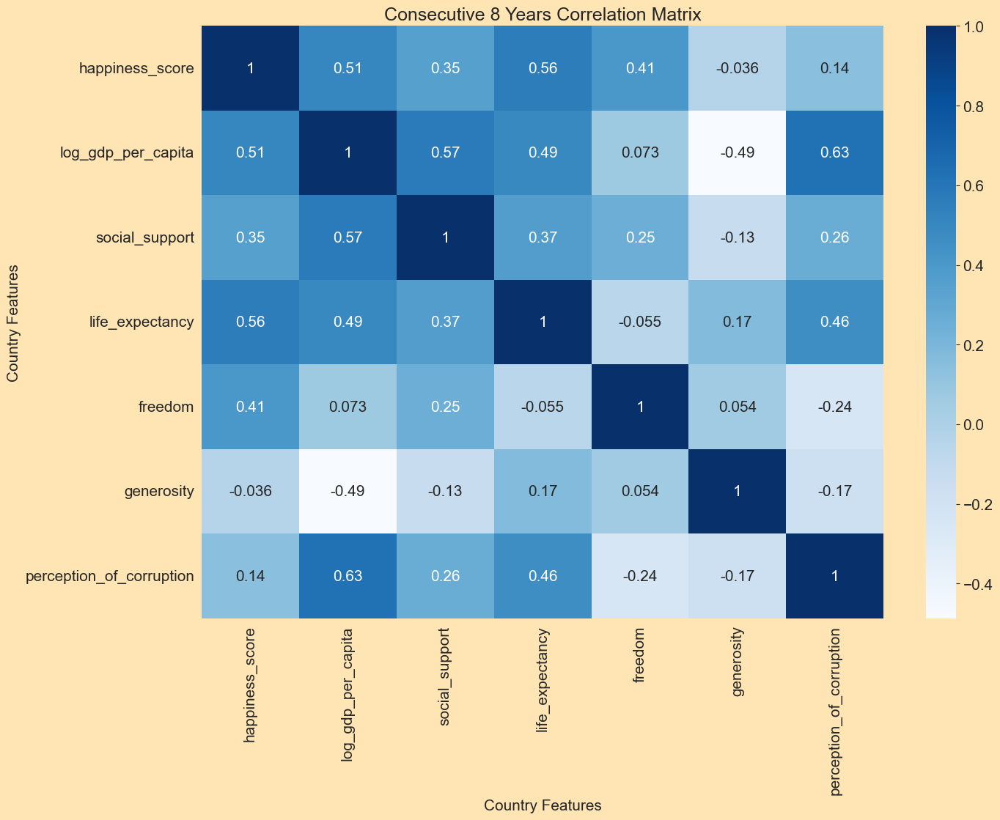

In [182]:
### What country feature correlates with happiness in con_08?

con_08_corr_matrix = con_08.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_08_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 8 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [183]:
# Show what correlates to happiness in con_08

con_08_happiness_corr = con_08.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_08_happiness_corr

happiness_score             1.000000
life_expectancy             0.563788
log_gdp_per_capita          0.508142
freedom                     0.405733
social_support              0.354644
perception_of_corruption    0.141865
generosity                 -0.036006
country_id                 -0.089904
Name: happiness_score, dtype: float64

In [184]:
# Show all positive correlations in con_08

con_08_corr = con_08.corr(numeric_only = True)
con_08_corr_unstack = con_08_corr.unstack().sort_values()
con_08_high_corr = con_08_corr_unstack.sort_values(ascending=False)
con_08_high_corr = con_08_high_corr[(con_08_high_corr < 1) & (con_08_high_corr > 0.5)].drop_duplicates()
con_08_high_corr

log_gdp_per_capita  perception_of_corruption    0.625659
country_id          social_support              0.613183
log_gdp_per_capita  social_support              0.570496
happiness_score     life_expectancy             0.563788
                    log_gdp_per_capita          0.508142
dtype: float64

### 9 consecutive years

In [185]:
test_data = data
con_09 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [186]:
con_09['diff']= con_09.groupby(['country_name',con_09['year'].diff().ne(1).cumsum()])['happiness_score'].diff(9)
con_09_all_diff = con_09[con_09['diff'].isna() == False]

print(con_09.shape)
con_09.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,-1.061872


In [187]:
con_09['diff'].describe()

count    745.000000
mean       0.124556
std        0.697727
min       -2.840826
25%       -0.261887
50%        0.111084
75%        0.559139
max        2.172966
Name: diff, dtype: float64

In [188]:
# Mean and Standard Deviation

con_09_mean = 0.124556
con_09_std = 0.697727

# 2 Standard Deviations

print(con_09_std * 2)

1.395454


In [189]:
con_09_top = con_09[con_09['diff'] > con_09_mean + (con_09_std * 2)].sort_values('diff', ascending=False)

print(con_09_top.shape)
con_09_top.sort_values('diff', ascending=False)

(8, 4)


,country_name,year,happiness_score,diff
1481,Nepal,2020,5.982410,2.172966
458,Congo Brazzaville,2022,5.804919,1.849968
1816,Serbia,2019,6.241407,1.780103
1735,Romania,2020,6.785142,1.762385
285,Bulgaria,2020,5.597723,1.722341
824,Guinea,2023,5.071700,1.659218
1815,Serbia,2018,5.936493,1.556181
881,Hungary,2021,6.226648,1.543290


In [190]:
con_09_top_index = con_09_top.index.tolist()
con_09_top_index.sort()

a = [x-1 for x in con_09_top_index]
b = [x-2 for x in con_09_top_index]
c = [x-3 for x in con_09_top_index]
d = [x-4 for x in con_09_top_index]
e = [x-5 for x in con_09_top_index]
f = [x-6 for x in con_09_top_index]
g = [x-7 for x in con_09_top_index]
h = [x-8 for x in con_09_top_index]
i = [x-9 for x in con_09_top_index]

con_09_top_all_index = con_09_top_index + a + b + c + d + e + f + g + h + i
con_09_top_all_index = list(set(con_09_top_all_index)) # Removing overlapping Country Year 
con_09_top_all_index.sort()

print(con_09_top_index[:12])
print(con_09_top_all_index[:12])

[285, 458, 824, 881, 1481, 1735, 1815, 1816]
[276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 449, 450]


In [191]:
con_09 = data.iloc[con_09_top_all_index]

print(con_09.shape)
con_09.head(10)

(71, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
276,Bulgaria,16,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,16,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,16,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,16,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,16,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,16,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,16,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,16,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,16,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806
285,Bulgaria,16,Europe,2020,5.597723,10.020541,0.916242,66.400002,0.818225,-0.010107,0.900633


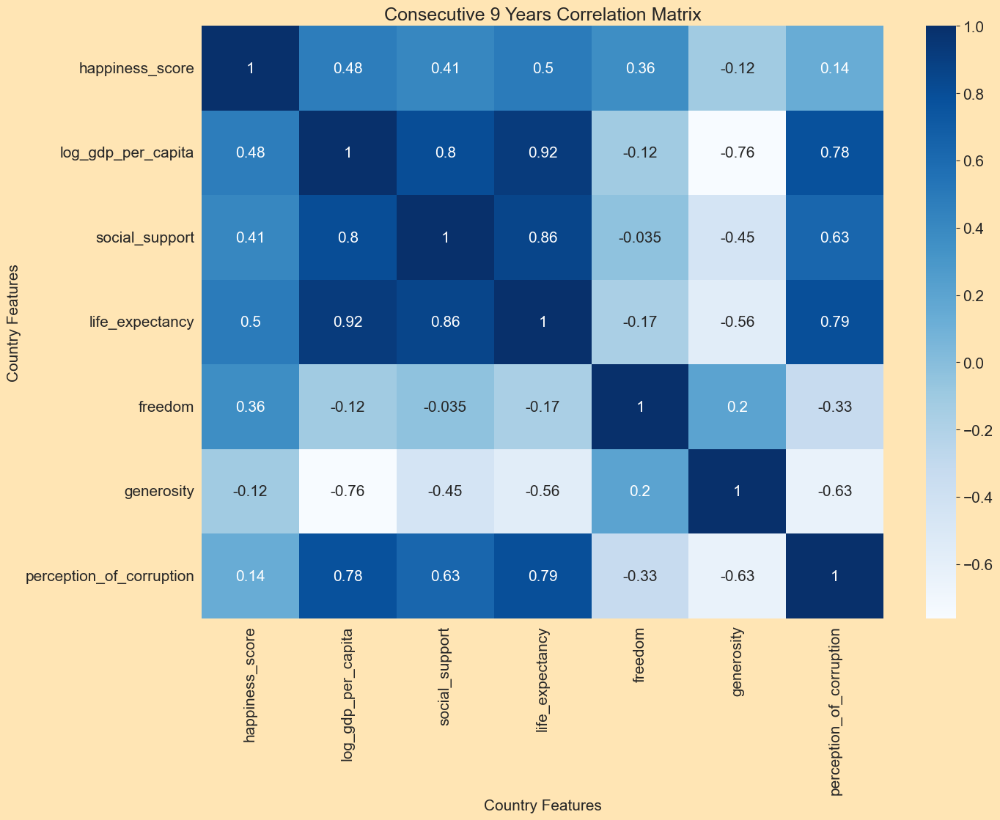

In [192]:
### What country feature correlates with happiness in con_09?

con_09_corr_matrix = con_09.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_09_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 9 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [193]:
# Show what correlates to happiness in con_09

con_09_happiness_corr = con_09.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_09_happiness_corr

happiness_score             1.000000
life_expectancy             0.496474
log_gdp_per_capita          0.482268
social_support              0.409962
freedom                     0.362443
country_id                  0.333087
perception_of_corruption    0.137365
generosity                 -0.118308
Name: happiness_score, dtype: float64

In [194]:
# Show all positive correlations in con_09

con_09_corr = con_09.corr(numeric_only = True)
con_09_corr_unstack = con_09_corr.unstack().sort_values()
con_09_high_corr = con_09_corr_unstack.sort_values(ascending=False)
con_09_high_corr = con_09_high_corr[(con_09_high_corr < 1) & (con_09_high_corr > 0.5)].drop_duplicates()
con_09_high_corr

log_gdp_per_capita        life_expectancy             0.918635
social_support            life_expectancy             0.862368
log_gdp_per_capita        social_support              0.804543
perception_of_corruption  life_expectancy             0.791614
log_gdp_per_capita        perception_of_corruption    0.778007
perception_of_corruption  social_support              0.629482
dtype: float64

### 10 consecutive years

In [195]:
test_data = data
con_10 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [196]:
con_10['diff']= con_10.groupby(['country_name',con_10['year'].diff().ne(1).cumsum()])['happiness_score'].diff(10)
con_10_all_diff = con_10[con_10['diff'].isna() == False]

print(con_10.shape)
con_10.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [197]:
con_10['diff'].describe()

count    627.000000
mean       0.130076
std        0.718312
min       -3.008762
25%       -0.277050
50%        0.163187
75%        0.596876
max        1.885577
Name: diff, dtype: float64

In [198]:
# Mean and Standard Deviation

con_10_mean = 0.130076
con_10_std = 0.718312

# 2 Standard Deviations

print(con_10_std * 2)

1.436624


In [199]:
con_10_top = con_10[con_10['diff'] > con_10_mean + (con_10_std * 2)].sort_values('diff', ascending=False)

print(con_10_top.shape)
con_10_top.sort_values('diff', ascending=False)

(9, 4)


,country_name,year,happiness_score,diff
458,Congo Brazzaville,2022,5.804919,1.885577
1735,Romania,2020,6.785142,1.875977
1816,Serbia,2019,6.241407,1.861095
1110,Kosovo,2021,6.648499,1.788998
639,El Salvador,2021,6.431447,1.690152
285,Bulgaria,2020,5.597723,1.685447
823,Guinea,2022,5.317493,1.665938
1481,Nepal,2020,5.982410,1.632735
1817,Serbia,2020,6.041546,1.580242


In [200]:
con_10_top_index = con_10_top.index.tolist()
con_10_top_index.sort()

a = [x-1 for x in con_10_top_index]
b = [x-2 for x in con_10_top_index]
c = [x-3 for x in con_10_top_index]
d = [x-4 for x in con_10_top_index]
e = [x-5 for x in con_10_top_index]
f = [x-6 for x in con_10_top_index]
g = [x-7 for x in con_10_top_index]
h = [x-8 for x in con_10_top_index]
i = [x-9 for x in con_10_top_index]
j = [x-10 for x in con_10_top_index]


con_10_top_all_index = con_10_top_index + a + b + c + d + e + f + g + h + i + j
con_10_top_all_index = list(set(con_10_top_all_index)) # Removing overlapping Country Year 
con_10_top_all_index.sort()

print(con_10_top_index[:12])
print(con_10_top_all_index[:12])

[285, 458, 639, 823, 1110, 1481, 1735, 1816, 1817]
[275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 448]


In [201]:
con_10 = data.iloc[con_10_top_all_index]

print(con_10.shape)
con_10.head(10)

(89, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
275,Bulgaria,16,Europe,2010,3.912276,9.807190,0.843272,65.199997,0.544536,-0.150703,0.940970
276,Bulgaria,16,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,16,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,16,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,16,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,16,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,16,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,16,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,16,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,16,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806


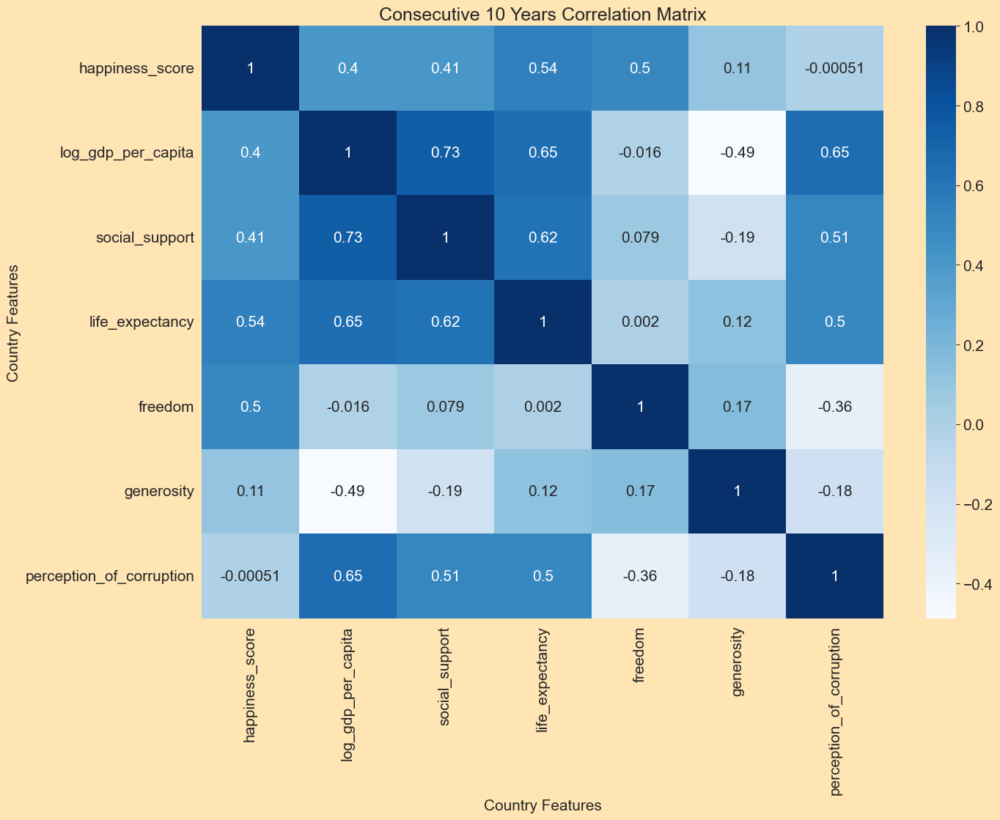

In [202]:
### What country feature correlates with happiness in con_10?

con_10_corr_matrix = con_10.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_10_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 10 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [203]:
# Show what correlates to happiness in con_10

con_10_happiness_corr = con_10.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_10_happiness_corr

happiness_score             1.000000
life_expectancy             0.544906
freedom                     0.501153
social_support              0.412884
log_gdp_per_capita          0.401828
country_id                  0.228180
generosity                  0.105646
perception_of_corruption   -0.000509
Name: happiness_score, dtype: float64

In [204]:
# Show all positive correlations in con_10

con_10_corr = con_10.corr(numeric_only = True)
con_10_corr_unstack = con_10_corr.unstack().sort_values()
con_10_high_corr = con_10_corr_unstack.sort_values(ascending=False)
con_10_high_corr = con_10_high_corr[(con_10_high_corr < 1) & (con_10_high_corr > 0.5)].drop_duplicates()
con_10_high_corr

log_gdp_per_capita        social_support              0.734404
perception_of_corruption  log_gdp_per_capita          0.648746
log_gdp_per_capita        life_expectancy             0.645279
life_expectancy           social_support              0.617645
happiness_score           life_expectancy             0.544906
perception_of_corruption  social_support              0.507651
life_expectancy           perception_of_corruption    0.504049
freedom                   happiness_score             0.501153
dtype: float64

### 11 consecutive years

In [205]:
test_data = data
con_11 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [206]:
con_11['diff']=con_11.groupby(['country_name',con_11['year'].diff().ne(1).cumsum()])['happiness_score'].diff(11)
con_11_all_diff = con_11[con_11['diff'].isna() == False]

print(con_11.shape)
con_11.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [207]:
con_11['diff'].describe()

count    515.000000
mean       0.131745
std        0.736659
min       -2.853090
25%       -0.279125
50%        0.144520
75%        0.601762
max        2.016198
Name: diff, dtype: float64

In [208]:
# Mean and Standard Deviation

con_11_mean = 0.131745
con_11_std = 0.736659

# 2 Standard Deviations

print(con_11_std * 2)

1.473318


In [209]:
con_11_top = con_11[con_11['diff'] > con_11_mean + (con_11_std * 2)].sort_values('diff', ascending=False)

print(con_11_top.shape)
con_11_top.sort_values('diff', ascending=False)

(9, 4)


,country_name,year,happiness_score,diff
1530,Nicaragua,2017,6.476357,2.016198
1224,Lithuania,2021,6.864573,1.798748
1818,Serbia,2021,6.245267,1.783963
640,El Salvador,2022,6.492156,1.750861
1680,Philippines,2019,6.267745,1.678680
1483,Nepal,2022,5.474176,1.664731
1817,Serbia,2020,6.041546,1.661234
1736,Romania,2021,6.548726,1.639560
1225,Lithuania,2022,7.037577,1.605140


In [210]:
con_11_top_index = con_11_top.index.tolist()
con_11_top_index.sort()

a = [x-1 for x in con_11_top_index]
b = [x-2 for x in con_11_top_index]
c = [x-3 for x in con_11_top_index]
d = [x-4 for x in con_11_top_index]
e = [x-5 for x in con_11_top_index]
f = [x-6 for x in con_11_top_index]
g = [x-7 for x in con_11_top_index]
h = [x-8 for x in con_11_top_index]
i = [x-9 for x in con_11_top_index]
j = [x-10 for x in con_11_top_index]
k = [x-11 for x in con_11_top_index]

con_11_top_all_index = con_11_top_index + a + b + c + d + e + f + g + h + i + j + k
con_11_top_all_index = list(set(con_11_top_all_index)) # Removing overlapping Country Year 
con_11_top_all_index.sort()

print(con_11_top_index[:12])
print(con_11_top_all_index[:12])

[640, 1224, 1225, 1483, 1530, 1680, 1736, 1817, 1818]
[629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640]


In [211]:
con_11 = data.iloc[con_11_top_all_index]

print(con_11.shape)
con_11.head(10)

(86, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
629,El Salvador,37,South/Latin America,2011,4.741295,8.944544,0.731278,64.220001,0.747246,-0.129944,0.706553
630,El Salvador,37,South/Latin America,2012,5.934371,8.968486,0.806015,64.040001,0.682745,-0.158484,0.786295
631,El Salvador,37,South/Latin America,2013,6.325063,8.986650,0.826859,63.860001,0.715570,-0.153323,0.771751
632,El Salvador,37,South/Latin America,2014,5.856524,8.999740,0.797612,63.680000,0.778015,-0.197871,0.781460
633,El Salvador,37,South/Latin America,2015,6.018496,9.019994,0.790755,63.500000,0.733356,-0.160052,0.804544
634,El Salvador,37,South/Latin America,2016,6.139825,9.041951,0.793660,63.849998,0.799847,-0.188904,0.797312
635,El Salvador,37,South/Latin America,2017,6.339318,9.061599,0.828953,64.199997,0.757827,-0.176094,0.777749
636,El Salvador,37,South/Latin America,2018,6.241199,9.083893,0.820300,64.550003,0.863335,-0.099741,0.800700
637,El Salvador,37,South/Latin America,2019,6.454821,9.107358,0.764391,64.900002,0.877391,-0.113695,0.681576
638,El Salvador,37,South/Latin America,2020,5.461927,9.020058,0.695624,65.250000,0.923945,-0.129366,0.583036


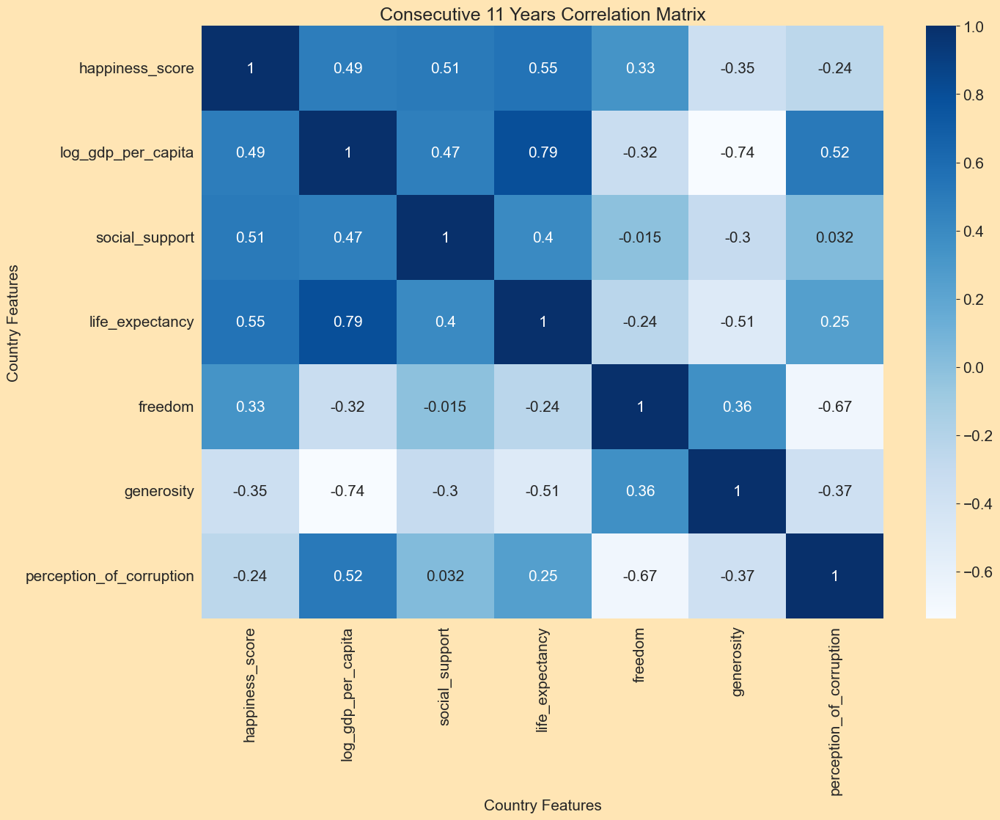

In [212]:
### What country feature correlates with happiness in con_11?

con_11_corr_matrix = con_11.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_11_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 11 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [213]:
# Show what correlates to happiness in con_11

con_11_happiness_corr = con_11.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_11_happiness_corr

happiness_score             1.000000
life_expectancy             0.551412
social_support              0.509441
log_gdp_per_capita          0.486428
freedom                     0.330826
perception_of_corruption   -0.244832
country_id                 -0.346358
generosity                 -0.352265
Name: happiness_score, dtype: float64

In [214]:
# Show all positive correlations in con_11

con_11_corr = con_11.corr(numeric_only = True)
con_11_corr_unstack = con_11_corr.unstack().sort_values()
con_11_high_corr = con_11_corr_unstack.sort_values(ascending=False)
con_11_high_corr = con_11_high_corr[(con_11_high_corr < 1) & (con_11_high_corr > 0.5)].drop_duplicates()
con_11_high_corr

life_expectancy     log_gdp_per_capita          0.790502
                    happiness_score             0.551412
log_gdp_per_capita  perception_of_corruption    0.517392
happiness_score     social_support              0.509441
dtype: float64

### 12 consecutive years

In [215]:
test_data = data
con_12 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [216]:
con_12['diff']= con_12.groupby(['country_name',con_12['year'].diff().ne(1).cumsum()])['happiness_score'].diff(12)
con_12_all_diff = con_12[con_12['diff'].isna() == False]

print(con_12.shape)
con_12.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [217]:
con_12['diff'].describe()

count    408.000000
mean       0.115730
std        0.736799
min       -3.027189
25%       -0.292052
50%        0.145449
75%        0.586084
max        1.971752
Name: diff, dtype: float64

In [218]:
# Mean and Standard Deviation

con_12_mean = 0.115730
con_12_std = 0.736799

# 2 Standard Deviations

print(con_12_std * 2)

1.473598


In [219]:
con_12_top = con_12[con_12['diff'] > con_12_mean + (con_12_std * 2)].sort_values('diff', ascending=False)

print(con_12_top.shape)
con_12_top.sort_values('diff', ascending=False)

(3, 4)


,country_name,year,happiness_score,diff
1225,Lithuania,2022,7.037577,1.971752
1818,Serbia,2021,6.245267,1.864955
288,Bulgaria,2023,5.466100,1.590718


In [220]:
con_12_top_index = con_12_top.index.tolist()
con_12_top_index.sort()

a = [x-1 for x in con_12_top_index]
b = [x-2 for x in con_12_top_index]
c = [x-3 for x in con_12_top_index]
d = [x-4 for x in con_12_top_index]
e = [x-5 for x in con_12_top_index]
f = [x-6 for x in con_12_top_index]
g = [x-7 for x in con_12_top_index]
h = [x-8 for x in con_12_top_index]
i = [x-9 for x in con_12_top_index]
j = [x-10 for x in con_12_top_index]
k = [x-11 for x in con_12_top_index]
l = [x-12 for x in con_12_top_index]

con_12_top_all_index = con_12_top_index + a + b + c + d + e + f + g + h + i + j + k + l
con_12_top_all_index = list(set(con_12_top_all_index)) # Removing overlapping Country Year 
con_12_top_all_index.sort()

print(con_12_top_index[:12])
print(con_12_top_all_index[:12])

[288, 1225, 1818]
[276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287]


In [221]:
con_12 = data.iloc[con_12_top_all_index]

print(con_12.shape)
con_12.head(10)

(39, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
276,Bulgaria,16,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,16,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,16,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,16,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,16,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,16,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,16,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,16,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,16,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806
285,Bulgaria,16,Europe,2020,5.597723,10.020541,0.916242,66.400002,0.818225,-0.010107,0.900633


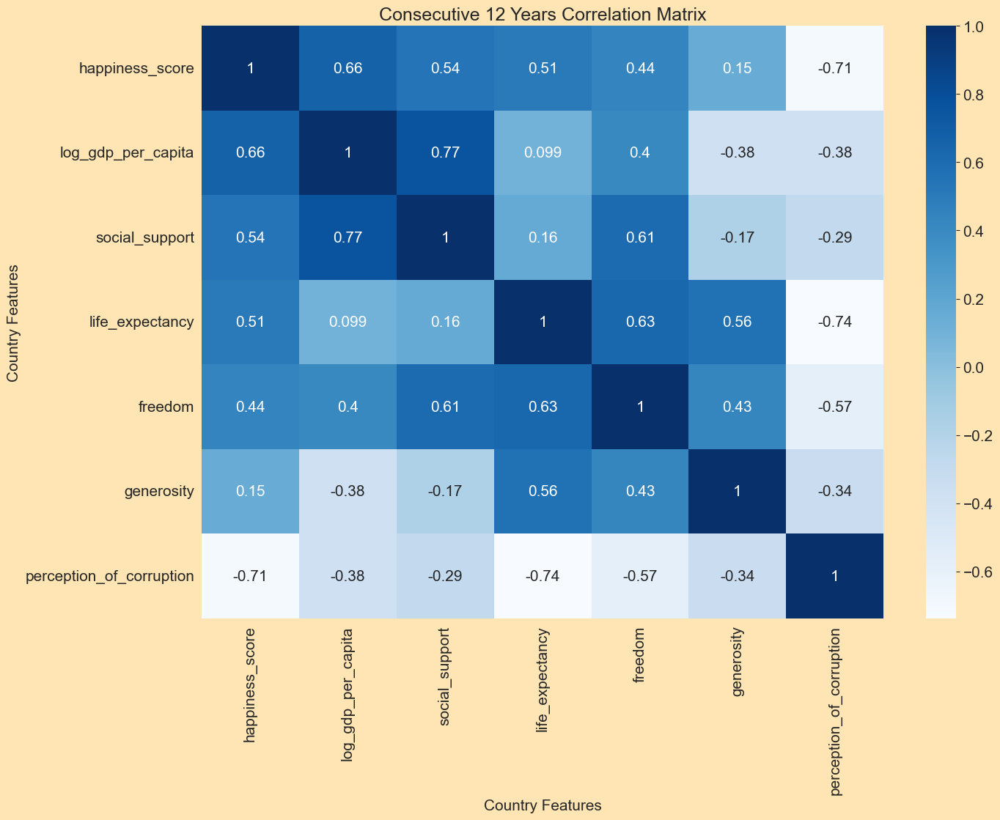

In [222]:
### What country feature correlates with happiness in con_12?

con_12_corr_matrix = con_12.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_12_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 12 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [223]:
# Show what correlates to happiness in con_12

con_12_happiness_corr = con_12.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_12_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.662678
social_support              0.539948
life_expectancy             0.510479
freedom                     0.440201
country_id                  0.333945
generosity                  0.147374
perception_of_corruption   -0.708543
Name: happiness_score, dtype: float64

In [224]:
# Show all positive correlations in con_12

con_12_corr = con_12.corr(numeric_only = True)
con_12_corr_unstack = con_12_corr.unstack().sort_values()
con_12_high_corr = con_12_corr_unstack.sort_values(ascending=False)
con_12_high_corr = con_12_high_corr[(con_12_high_corr < 1) & (con_12_high_corr > 0.5)].drop_duplicates()
con_12_high_corr

log_gdp_per_capita  social_support        0.768052
happiness_score     log_gdp_per_capita    0.662678
freedom             life_expectancy       0.631343
                    social_support        0.608118
generosity          life_expectancy       0.559708
social_support      happiness_score       0.539948
happiness_score     life_expectancy       0.510479
dtype: float64

### 13 consecutive years

In [225]:
test_data = data
con_13 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [226]:
con_13['diff']= con_13.groupby(['country_name',con_13['year'].diff().ne(1).cumsum()])['happiness_score'].diff(13)
con_13_all_diff = con_13[con_13['diff'].isna() == False]

print(con_13.shape)
con_13.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [227]:
con_13['diff'].describe()

count    306.000000
mean       0.113862
std        0.742909
min       -2.853571
25%       -0.272836
50%        0.113154
75%        0.580346
max        1.697175
Name: diff, dtype: float64

In [228]:
# Mean and Standard Deviation

con_13_mean = 0.113862
con_13_std = 0.742909

# 2 Standard Deviations

print(con_13_std * 2)

1.485818


In [229]:
con_13_top = con_13[con_13['diff'] > con_13_mean + (con_13_std * 2)].sort_values('diff', ascending=False)

print(con_13_top.shape)
con_13_top.sort_values('diff', ascending=False)

(3, 4)


,country_name,year,happiness_score,diff
1226,Lithuania,2023,6.763000,1.697175
1738,Romania,2023,6.589100,1.679934
1532,Nicaragua,2019,6.112545,1.652387


In [230]:
con_13_top_index = con_13_top.index.tolist()
con_13_top_index.sort()

a = [x-1 for x in con_13_top_index]
b = [x-2 for x in con_13_top_index]
c = [x-3 for x in con_13_top_index]
d = [x-4 for x in con_13_top_index]
e = [x-5 for x in con_13_top_index]
f = [x-6 for x in con_13_top_index]
g = [x-7 for x in con_13_top_index]
h = [x-8 for x in con_13_top_index]
i = [x-9 for x in con_13_top_index]
j = [x-10 for x in con_13_top_index]
k = [x-11 for x in con_13_top_index]
l = [x-12 for x in con_13_top_index]
m = [x-13 for x in con_13_top_index]

con_13_top_all_index = con_13_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m
con_13_top_all_index = list(set(con_13_top_all_index)) # Removing overlapping Country Year 
con_13_top_all_index.sort()

print(con_13_top_index[:12])
print(con_13_top_all_index[:20])

[1226, 1532, 1738]
[1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1519, 1520, 1521, 1522, 1523, 1524]


In [231]:
con_13 = data.iloc[con_13_top_all_index]

print(con_13.shape)
con_13.head(10)

(42, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1213,Lithuania,72,Europe,2010,5.065825,10.083422,0.881811,64.300003,0.519352,-0.278437,0.962167
1214,Lithuania,72,Europe,2011,5.432437,10.164642,0.911411,64.500000,0.565797,-0.151547,0.963512
1215,Lithuania,72,Europe,2012,5.771037,10.215773,0.918690,64.699997,0.503027,-0.276897,0.956959
1216,Lithuania,72,Europe,2013,5.595689,10.260778,0.912514,64.900002,0.555815,-0.240327,0.936336
1217,Lithuania,72,Europe,2014,6.125724,10.304135,0.908240,65.099998,0.507947,-0.267209,0.956348
1218,Lithuania,72,Europe,2015,5.711378,10.333587,0.928524,65.300003,0.641470,-0.257425,0.924174
1219,Lithuania,72,Europe,2016,5.865552,10.371170,0.937873,65.650002,0.614239,-0.270125,0.949393
1220,Lithuania,72,Europe,2017,6.272941,10.427088,0.926317,66.000000,0.749307,-0.177431,0.789710
1221,Lithuania,72,Europe,2018,6.308879,10.475785,0.929350,66.349998,0.698945,-0.240819,0.851745
1222,Lithuania,72,Europe,2019,6.064098,10.523646,0.917578,66.699997,0.780266,-0.255955,0.782501


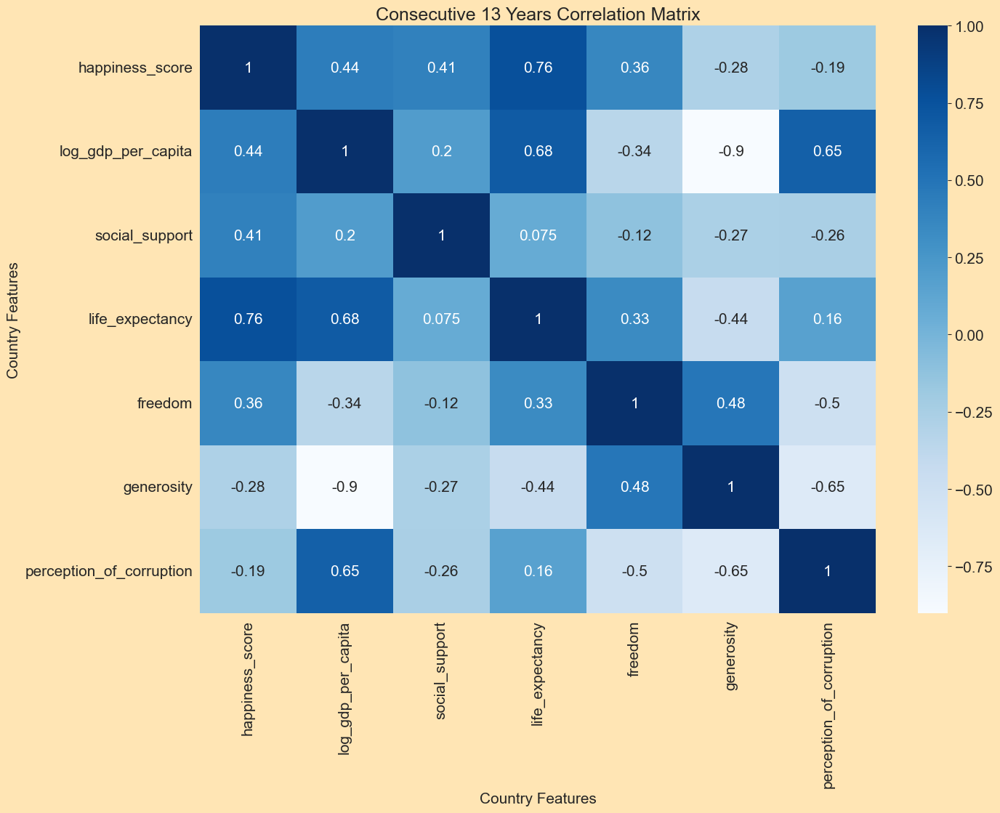

In [232]:
### What country feature correlates with happiness in con_13?

con_13_corr_matrix = con_13.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_13_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 13 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [233]:
# Show what correlates to happiness in con_13

con_13_happiness_corr = con_13.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_13_happiness_corr

happiness_score             1.000000
life_expectancy             0.762713
log_gdp_per_capita          0.438759
social_support              0.411240
freedom                     0.363639
country_id                 -0.185079
perception_of_corruption   -0.188263
generosity                 -0.278459
Name: happiness_score, dtype: float64

In [234]:
# Show all positive correlations in con_13

con_13_corr = con_13.corr(numeric_only = True)
con_13_corr_unstack = con_13_corr.unstack().sort_values()
con_13_high_corr = con_13_corr_unstack.sort_values(ascending=False)
con_13_high_corr = con_13_high_corr[(con_13_high_corr < 1) & (con_13_high_corr > 0.5)].drop_duplicates()
con_13_high_corr

happiness_score           life_expectancy       0.762713
log_gdp_per_capita        life_expectancy       0.682661
perception_of_corruption  log_gdp_per_capita    0.650845
country_id                freedom               0.507859
dtype: float64

### 14 consecutive years

In [235]:
test_data = data
con_14 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [236]:
con_14['diff']= con_14.groupby(['country_name',con_14['year'].diff().ne(1).cumsum()])['happiness_score'].diff(14)
con_14_all_diff = con_14[con_14['diff'].isna() == False]

print(con_14.shape)
con_14.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [237]:
con_14['diff'].describe()

count    214.000000
mean       0.104612
std        0.747060
min       -2.813799
25%       -0.374635
50%        0.191475
75%        0.607261
max        1.826732
Name: diff, dtype: float64

In [238]:
# Mean and Standard Deviation

con_14_mean = 0.104612
con_14_std = 0.747060

# 2 Standard Deviations

print(con_14_std * 2)

1.49412


In [239]:
con_14_top = con_14[con_14['diff'] > con_14_mean + (con_14_std * 2)].sort_values('diff', ascending=False)

print(con_14_top.shape)
con_14_top.sort_values('diff', ascending=False)

(2, 4)


,country_name,year,happiness_score,diff
1533,Nicaragua,2020,6.286890,1.826732
1138,Kyrgyzstan,2020,6.249586,1.608187


In [240]:
con_14_top_index = con_14_top.index.tolist()
con_14_top_index.sort()

a = [x-1 for x in con_14_top_index]
b = [x-2 for x in con_14_top_index]
c = [x-3 for x in con_14_top_index]
d = [x-4 for x in con_14_top_index]
e = [x-5 for x in con_14_top_index]
f = [x-6 for x in con_14_top_index]
g = [x-7 for x in con_14_top_index]
h = [x-8 for x in con_14_top_index]
i = [x-9 for x in con_14_top_index]
j = [x-10 for x in con_14_top_index]
k = [x-11 for x in con_14_top_index]
l = [x-12 for x in con_14_top_index]
m = [x-13 for x in con_14_top_index]
n = [x-14 for x in con_14_top_index]

con_14_top_all_index = con_14_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n
con_14_top_all_index = list(set(con_14_top_all_index)) # Removing overlapping Country Year 
con_14_top_all_index.sort()

print(con_14_top_index[:12])
print(con_14_top_all_index[:20])

[1138, 1533]
[1124, 1125, 1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136, 1137, 1138, 1519, 1520, 1521, 1522, 1523]


In [241]:
con_14 = data.iloc[con_14_top_all_index]

print(con_14.shape)
con_14.head(10)

(30, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1124,Kyrgyzstan,67,Asia & Pacific,2006,4.641399,8.185375,0.844137,59.919998,0.677572,-0.142217,0.878633
1125,Kyrgyzstan,67,Asia & Pacific,2007,4.697762,8.257814,0.833098,60.340000,0.683523,-0.093482,0.929055
1126,Kyrgyzstan,67,Asia & Pacific,2008,4.736588,8.328985,0.792133,60.759998,0.719029,-0.101964,0.922627
1127,Kyrgyzstan,67,Asia & Pacific,2009,5.069054,8.345366,0.854936,61.180000,0.698920,-0.142075,0.896227
1128,Kyrgyzstan,67,Asia & Pacific,2010,4.996411,8.328712,0.885363,61.599998,0.720051,-0.073847,0.925794
1129,Kyrgyzstan,67,Asia & Pacific,2011,4.921049,8.374398,0.891404,62.020000,0.747808,-0.156829,0.932497
1130,Kyrgyzstan,67,Asia & Pacific,2012,5.207786,8.356864,0.856182,62.439999,0.702732,-0.081130,0.892037
1131,Kyrgyzstan,67,Asia & Pacific,2013,5.402427,8.440616,0.850716,62.860001,0.755037,-0.087396,0.899560
1132,Kyrgyzstan,67,Asia & Pacific,2014,5.252193,8.460006,0.898025,63.279999,0.736290,0.353036,0.896767
1133,Kyrgyzstan,67,Asia & Pacific,2015,4.905376,8.477442,0.856585,63.700001,0.813176,0.197422,0.857725


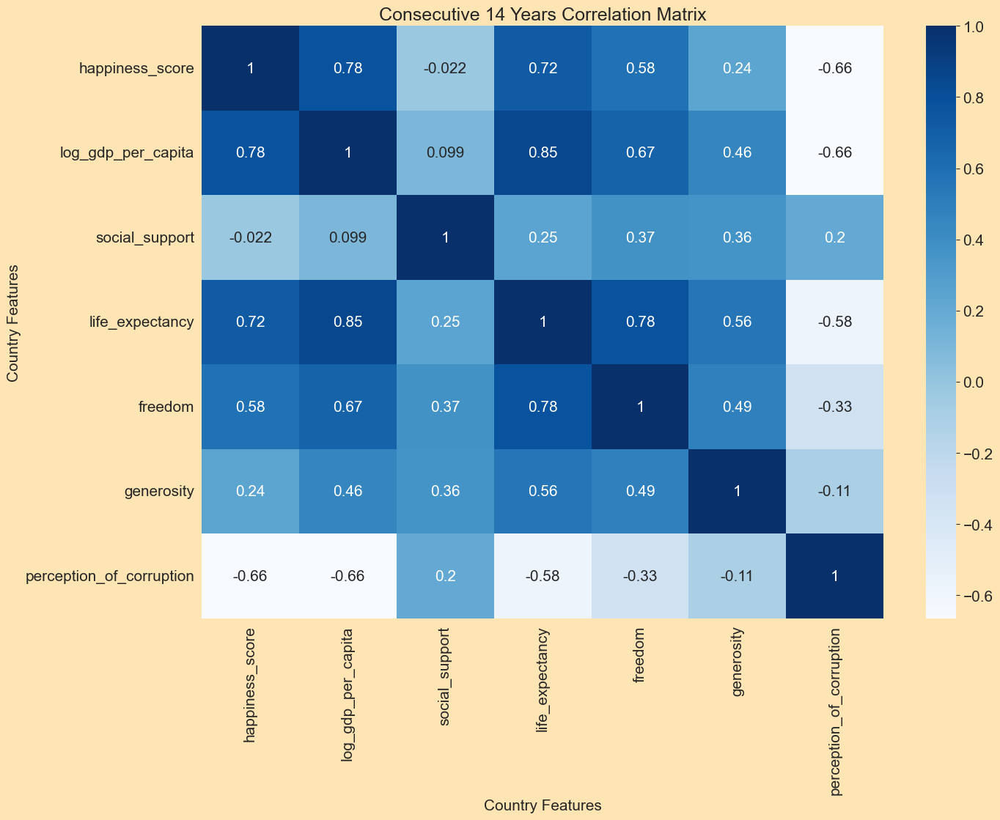

In [242]:
### What country feature correlates with happiness in con_14?

con_14_corr_matrix = con_14.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_14_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 14 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [243]:
# Show what correlates to happiness in con_14

con_14_happiness_corr = con_14.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_14_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.784836
life_expectancy             0.723550
freedom                     0.583744
country_id                  0.459416
generosity                  0.238174
social_support             -0.022171
perception_of_corruption   -0.660125
Name: happiness_score, dtype: float64

In [244]:
# Show all positive correlations in con_14

con_14_corr = con_14.corr(numeric_only = True)
con_14_corr_unstack = con_14_corr.unstack().sort_values()
con_14_high_corr = con_14_corr_unstack.sort_values(ascending=False)
con_14_high_corr = con_14_high_corr[(con_14_high_corr < 1) & (con_14_high_corr > 0.5)].drop_duplicates()
con_14_high_corr

log_gdp_per_capita  life_expectancy       0.851396
happiness_score     log_gdp_per_capita    0.784836
freedom             life_expectancy       0.779116
happiness_score     life_expectancy       0.723550
freedom             log_gdp_per_capita    0.668554
                    happiness_score       0.583744
country_id          life_expectancy       0.580138
generosity          life_expectancy       0.555912
country_id          log_gdp_per_capita    0.524000
dtype: float64

### 15 consecutive years

In [245]:
test_data = data
con_15 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [246]:
con_15['diff']= con_15.groupby(['country_name',con_15['year'].diff().ne(1).cumsum()])['happiness_score'].diff(15)
con_15_all_diff = con_15[con_15['diff'].isna() == False]

print(con_15.shape)
con_15.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [247]:
con_15['diff'].describe()

count    141.000000
mean       0.168370
std        0.715128
min       -2.202651
25%       -0.346765
50%        0.226833
75%        0.725892
max        1.635190
Name: diff, dtype: float64

In [248]:
# Mean and Standard Deviation

con_15_mean = 0.168370
con_15_std = 0.715128

# 2 Standard Deviations

print(con_15_std * 2)

1.430256


In [249]:
con_15_top = con_15[con_15['diff'] > con_15_mean + (con_15_std * 2)].sort_values('diff', ascending=False)

print(con_15_top.shape)
con_15_top.sort_values('diff', ascending=False)

(1, 4)


,country_name,year,happiness_score,diff
1534,Nicaragua,2021,6.095349,1.63519


In [250]:
con_15_top_index = con_15_top.index.tolist()
con_15_top_index.sort()

a = [x-1 for x in con_15_top_index]
b = [x-2 for x in con_15_top_index]
c = [x-3 for x in con_15_top_index]
d = [x-4 for x in con_15_top_index]
e = [x-5 for x in con_15_top_index]
f = [x-6 for x in con_15_top_index]
g = [x-7 for x in con_15_top_index]
h = [x-8 for x in con_15_top_index]
i = [x-9 for x in con_15_top_index]
j = [x-10 for x in con_15_top_index]
k = [x-11 for x in con_15_top_index]
l = [x-12 for x in con_15_top_index]
m = [x-13 for x in con_15_top_index]
n = [x-14 for x in con_15_top_index]
o = [x-15 for x in con_15_top_index]

con_15_top_all_index = con_15_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n + o
con_15_top_all_index = list(set(con_15_top_all_index)) # Removing overlapping Country Year 
con_15_top_all_index.sort()

print(con_15_top_index[:12])
print(con_15_top_all_index[:20])

[1534]
[1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532, 1533, 1534]


In [251]:
con_15 = data.iloc[con_15_top_all_index]

print(con_15.shape)
con_15.head(10)

(16, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1519,Nicaragua,93,South/Central America,2006,4.460158,8.395246,0.877170,64.300003,0.745456,0.007598,0.844391
1520,Nicaragua,93,South/Central America,2007,4.944091,8.430822,0.866213,64.400002,0.835560,0.138307,0.825799
1521,Nicaragua,93,South/Central America,2008,5.103827,8.450392,0.857186,64.500000,0.790831,0.073447,0.818949
1522,Nicaragua,93,South/Central America,2009,5.352805,8.402441,0.834688,64.599998,0.746065,0.068298,0.794487
1523,Nicaragua,93,South/Central America,2010,5.686699,8.430954,0.863152,64.699997,0.791773,0.016336,0.801729
1524,Nicaragua,93,South/Central America,2011,5.385705,8.477496,0.800305,64.800003,0.778591,-0.021449,0.760243
1525,Nicaragua,93,South/Central America,2012,5.448006,8.525718,0.894054,64.900002,0.850305,0.015352,0.643579
1526,Nicaragua,93,South/Central America,2013,5.772275,8.559204,0.868216,65.000000,0.859149,0.037441,0.636247
1527,Nicaragua,93,South/Central America,2014,6.275267,8.591465,0.838567,65.099998,0.817321,0.102353,0.698808
1528,Nicaragua,93,South/Central America,2015,5.924113,8.623894,0.826909,65.199997,0.809259,0.075562,0.727998


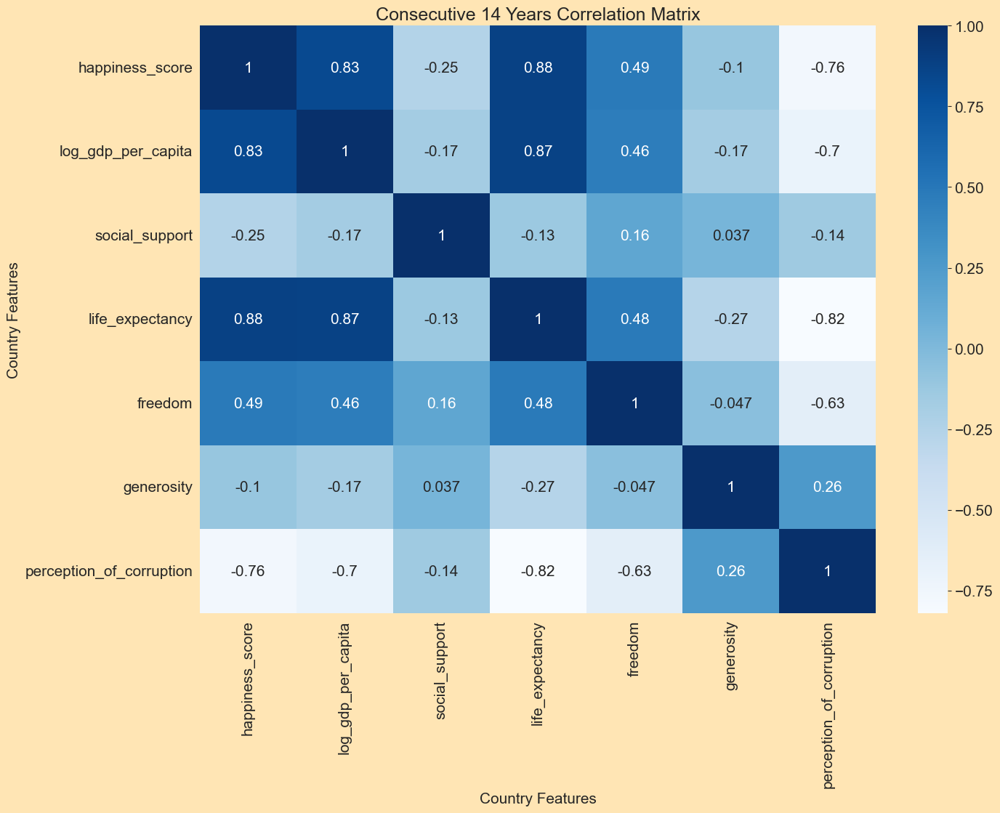

In [252]:
### What country feature correlates with happiness in con_15?

con_15_corr_matrix = con_15.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_15_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 14 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [253]:
# Show what correlates to happiness in con_15

con_15_happiness_corr = con_15.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_15_happiness_corr

happiness_score             1.000000
life_expectancy             0.884801
log_gdp_per_capita          0.829322
freedom                     0.485684
generosity                 -0.102868
social_support             -0.251648
perception_of_corruption   -0.763785
country_id                       NaN
Name: happiness_score, dtype: float64

In [254]:
# Show all positive correlations in con_15

con_15_corr = con_15.corr(numeric_only = True)
con_15_corr_unstack = con_15_corr.unstack().sort_values()
con_15_high_corr = con_15_corr_unstack.sort_values(ascending=False)
con_15_high_corr = con_15_high_corr[(con_15_high_corr < 1) & (con_15_high_corr > 0.5)].drop_duplicates()
con_15_high_corr

happiness_score     life_expectancy       0.884801
life_expectancy     log_gdp_per_capita    0.873658
log_gdp_per_capita  happiness_score       0.829322
dtype: float64

### 16 consecutive years

In [255]:
test_data = data
con_16 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [256]:
con_16['diff']= con_16.groupby(['country_name',con_16['year'].diff().ne(1).cumsum()])['happiness_score'].diff(16)
con_16_all_diff = con_16[con_16['diff'].isna() == False]

print(con_16.shape)
con_16.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [257]:
con_16['diff'].describe()

count    82.000000
mean      0.234378
std       0.697721
min      -1.478257
25%      -0.192104
50%       0.274733
75%       0.670579
max       1.932099
Name: diff, dtype: float64

In [258]:
# Mean and Standard Deviation

con_16_mean = 0.234378
con_16_std = 0.697721

# 2 Standard Deviations

print(con_16_std * 2)

1.395442


In [259]:
con_16_top = con_16[con_16['diff'] > con_16_mean + (con_16_std * 2)].sort_values('diff', ascending=False)

print(con_16_top.shape)
con_16_top.sort_values('diff', ascending=False)

(1, 4)


,country_name,year,happiness_score,diff
1535,Nicaragua,2022,6.392258,1.932099


In [260]:
con_16_top_index = con_16_top.index.tolist()
con_16_top_index.sort()

a = [x-1 for x in con_16_top_index]
b = [x-2 for x in con_16_top_index]
c = [x-3 for x in con_16_top_index]
d = [x-4 for x in con_16_top_index]
e = [x-5 for x in con_16_top_index]
f = [x-6 for x in con_16_top_index]
g = [x-7 for x in con_16_top_index]
h = [x-8 for x in con_16_top_index]
i = [x-9 for x in con_16_top_index]
j = [x-10 for x in con_16_top_index]
k = [x-11 for x in con_16_top_index]
l = [x-12 for x in con_16_top_index]
m = [x-13 for x in con_16_top_index]
n = [x-14 for x in con_16_top_index]
o = [x-15 for x in con_16_top_index]
p = [x-16 for x in con_16_top_index]


con_16_top_all_index = con_16_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n + o + p
con_16_top_all_index = list(set(con_16_top_all_index)) # Removing overlapping Country Year 
con_16_top_all_index.sort()

print(con_16_top_index[:12])
print(con_16_top_all_index[:20])

[1535]
[1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532, 1533, 1534, 1535]


In [261]:
con_16 = data.iloc[con_16_top_all_index]

print(con_16.shape)
con_16.head(10)

(17, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1519,Nicaragua,93,South/Central America,2006,4.460158,8.395246,0.877170,64.300003,0.745456,0.007598,0.844391
1520,Nicaragua,93,South/Central America,2007,4.944091,8.430822,0.866213,64.400002,0.835560,0.138307,0.825799
1521,Nicaragua,93,South/Central America,2008,5.103827,8.450392,0.857186,64.500000,0.790831,0.073447,0.818949
1522,Nicaragua,93,South/Central America,2009,5.352805,8.402441,0.834688,64.599998,0.746065,0.068298,0.794487
1523,Nicaragua,93,South/Central America,2010,5.686699,8.430954,0.863152,64.699997,0.791773,0.016336,0.801729
1524,Nicaragua,93,South/Central America,2011,5.385705,8.477496,0.800305,64.800003,0.778591,-0.021449,0.760243
1525,Nicaragua,93,South/Central America,2012,5.448006,8.525718,0.894054,64.900002,0.850305,0.015352,0.643579
1526,Nicaragua,93,South/Central America,2013,5.772275,8.559204,0.868216,65.000000,0.859149,0.037441,0.636247
1527,Nicaragua,93,South/Central America,2014,6.275267,8.591465,0.838567,65.099998,0.817321,0.102353,0.698808
1528,Nicaragua,93,South/Central America,2015,5.924113,8.623894,0.826909,65.199997,0.809259,0.075562,0.727998


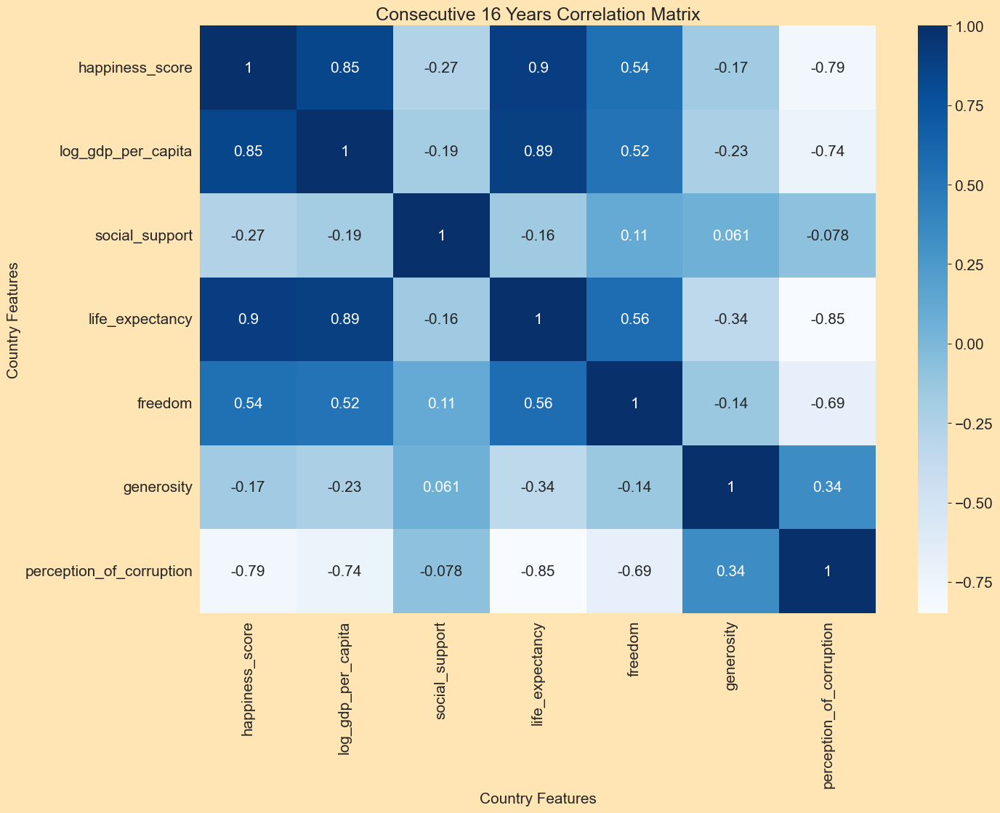

In [262]:
### What country feature correlates with happiness in con_16?

con_16_corr_matrix = con_16.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_16_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 16 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [263]:
# Show what correlates to happiness in con_16

con_16_happiness_corr = con_16.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_16_happiness_corr

happiness_score             1.000000
life_expectancy             0.895099
log_gdp_per_capita          0.845067
freedom                     0.544189
generosity                 -0.170682
social_support             -0.269135
perception_of_corruption   -0.785742
country_id                       NaN
Name: happiness_score, dtype: float64

In [264]:
# Show all positive correlations in con_16

con_16_corr = con_16.corr(numeric_only = True)
con_16_corr_unstack = con_16_corr.unstack().sort_values()
con_16_high_corr = con_16_corr_unstack.sort_values(ascending=False)
con_16_high_corr = con_16_high_corr[(con_16_high_corr < 1) & (con_16_high_corr > 0.5)].drop_duplicates()
con_16_high_corr

happiness_score     life_expectancy       0.895099
life_expectancy     log_gdp_per_capita    0.885610
log_gdp_per_capita  happiness_score       0.845067
life_expectancy     freedom               0.560761
happiness_score     freedom               0.544189
freedom             log_gdp_per_capita    0.523309
dtype: float64

In [265]:
con_01_top= con_01_top.reset_index().drop('index', axis=1)
con_01_top['consecutive_years'] = 'con_02'

con_02_top= con_02_top.reset_index().drop('index', axis=1)
con_02_top['consecutive_years'] = 'con_02'

con_03_top = con_03_top.reset_index().drop('index', axis=1)
con_03_top['consecutive_years'] = 'con_03'

con_04_top = con_04_top.reset_index().drop('index', axis=1)
con_04_top['consecutive_years'] = 'con_04'

con_05_top = con_05_top.reset_index().drop('index', axis=1)
con_05_top['consecutive_years'] = 'con_05'

con_06_top = con_06_top.reset_index().drop('index', axis=1)
con_06_top['consecutive_years'] = 'con_06'

con_07_top = con_07_top.reset_index().drop('index', axis=1)
con_07_top['consecutive_years'] = 'con_07'

con_08_top = con_08_top.reset_index().drop('index', axis=1)
con_08_top['consecutive_years'] = 'con_08'

con_09_top = con_09_top.reset_index().drop('index', axis=1)
con_09_top['consecutive_years'] = 'con_09'

con_10_top = con_10_top.reset_index().drop('index', axis=1)
con_10_top['consecutive_years'] = 'con_10'

con_11_top = con_11_top.reset_index().drop('index', axis=1)
con_11_top['consecutive_years'] = 'con_11'

con_12_top = con_12_top.reset_index().drop('index', axis=1)
con_12_top['consecutive_years'] = 'con_12'

con_13_top = con_14_top.reset_index().drop('index', axis=1)
con_13_top['consecutive_years'] = 'con_13'

con_14_top = con_14_top.reset_index().drop('index', axis=1)
con_14_top['consecutive_years'] = 'con_14'

con_15_top = con_15_top.reset_index().drop('index', axis=1)
con_15_top['consecutive_years'] = 'con_15'

con_16_top = con_16_top.reset_index().drop('index', axis=1)
con_16_top['consecutive_years'] = 'con_16'

con_top_all = pd.concat([con_02_top, con_03_top, con_04_top, con_05_top, con_06_top, con_07_top, con_08_top, con_09_top, con_10_top, con_11_top, con_12_top, con_13_top, con_14_top, con_15_top, con_16_top])

print(con_top_all.shape)
con_top_all.sort_values('diff', ascending=False).reset_index().drop('index', axis=1).head(10)

(224, 5)


,country_name,year,happiness_score,diff,consecutive_years
0,Benin,2018,5.819827,2.626358,con_06
1,Benin,2018,5.819827,2.472408,con_04
2,Liberia,2019,5.121461,2.419870,con_04
3,Benin,2018,5.819827,2.340414,con_05
4,Benin,2018,5.819827,2.195163,con_03
5,Nepal,2020,5.982410,2.172966,con_09
6,Nicaragua,2017,6.476357,2.016198,con_11
7,Lithuania,2022,7.037577,1.971752,con_12
8,Benin,2018,5.819827,1.949548,con_07
9,South Africa,2021,5.598654,1.937927,con_08


In [266]:
con_top_all.describe()

,happiness_score,diff
count,224.000000,224.000000
mean,5.635688,1.475326
std,0.747607,0.295859
min,3.878578,0.936035
25%,5.005134,1.262885
50%,5.543969,1.464191
75%,6.241407,1.660093
max,7.478455,2.626358


In [267]:
con_01 = con_01.reset_index().drop('index', axis=1)
con_01['consecutive_years'] = 'con_01'

con_02 = con_02.reset_index().drop('index', axis=1)
con_02['consecutive_years'] = 'con_02'

con_03 = con_03.reset_index().drop('index', axis=1)
con_03['consecutive_years'] = 'con_03'

con_04 = con_04.reset_index().drop('index', axis=1)
con_04['consecutive_years'] = 'con_04'

con_05 = con_05.reset_index().drop('index', axis=1)
con_05['consecutive_years'] = 'con_05'

con_06 = con_06.reset_index().drop('index', axis=1)
con_06['consecutive_years'] = 'con_06'

con_07 = con_07.reset_index().drop('index', axis=1)
con_07['consecutive_years'] = 'con_07'

con_08 = con_08.reset_index().drop('index', axis=1)
con_08['consecutive_years'] = 'con_08'

con_09 = con_09.reset_index().drop('index', axis=1)
con_09['consecutive_years'] = 'con_09'

con_10 = con_10.reset_index().drop('index', axis=1)
con_10['consecutive_years'] = 'con_10'

con_11 = con_11.reset_index().drop('index', axis=1)
con_11['consecutive_years'] = 'con_11'

con_12 = con_12.reset_index().drop('index', axis=1)
con_12['consecutive_years'] = 'con_12'

con_13 = con_13.reset_index().drop('index', axis=1)
con_13['consecutive_years'] = 'con_13'

con_14 = con_14.reset_index().drop('index', axis=1)
con_14['consecutive_years'] = 'con_14'

con_15 = con_15.reset_index().drop('index', axis=1)
con_15['consecutive_years'] = 'con_15'

con_16 = con_16.reset_index().drop('index', axis=1)
con_16['consecutive_years'] = 'con_16'

con_all = pd.concat([con_02, con_03, con_04, con_05, con_06, con_07, con_08, con_09, con_10, con_11, con_12, con_13, con_14, con_15, con_16])

print(con_all.shape)
con_all.head(10)

(1184, 12)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,consecutive_years
0,Afghanistan,1,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,con_02
1,Afghanistan,1,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,con_02
2,Afghanistan,1,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,con_02
3,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,con_02
4,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,con_02
5,Afghanistan,1,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,con_02
6,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683,con_02
7,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826,con_02
8,Armenia,5,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473,con_02
9,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522,con_02


In [268]:
con_all.describe()

,country_id,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,1184.000000,1184.000000,1178.000000,1179.000000,1184.000000,1179.000000,1163.000000,1168.000000
mean,70.282939,5.090160,8.775618,0.769456,61.437245,0.722346,-0.023920,0.820650
std,39.418815,0.901178,0.995509,0.116589,7.096351,0.117933,0.130836,0.094340
min,1.000000,2.701591,5.526723,0.372908,41.599998,0.294612,-0.278437,0.437915
25%,37.000000,4.542546,7.984066,0.695624,54.900002,0.663361,-0.117055,0.762783
50%,67.000000,5.077461,8.556049,0.793660,63.680000,0.732098,-0.043919,0.817115
75%,105.000000,5.777491,9.582840,0.856638,65.940002,0.799746,0.057594,0.907405
max,165.000000,7.478455,10.801981,0.952761,79.022000,0.963775,0.550825,0.976917


In [269]:
con_all.groupby('consecutive_years')['happiness_score'].count()

consecutive_years
con_02    136
con_03    103
con_04    113
con_05    141
con_06    129
con_07     79
con_08     93
con_09     71
con_10     89
con_11     86
con_12     39
con_13     42
con_14     30
con_15     16
con_16     17
Name: happiness_score, dtype: int64

(1184, 12)


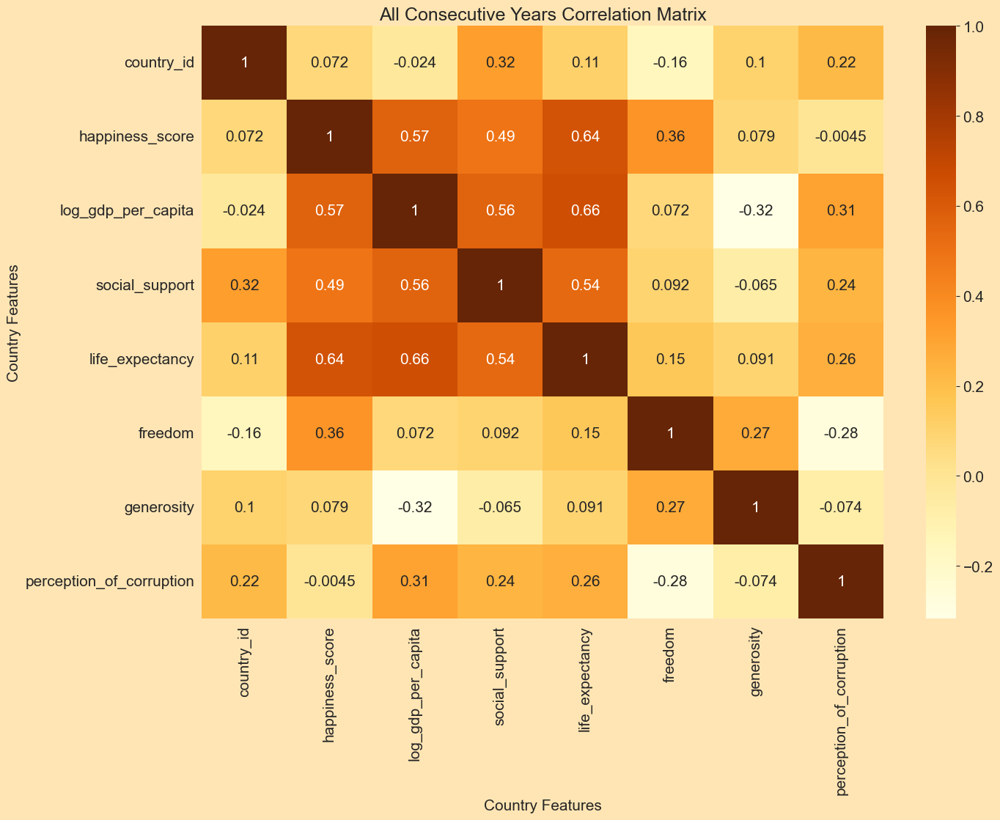

In [270]:
con_all_corr_matrix = con_all.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_all_corr_matrix, annot=True, cmap="YlOrBr")

plt.title('All Consecutive Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

print(con_all.shape)
plt.show()

In [271]:
distinct_con_all = con_all.drop_duplicates(subset=['country_name', 'year'], keep='first')
print(distinct_con_all.shape)
distinct_con_all.describe()

(377, 12)


,country_id,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,377.000000,377.000000,374.000000,376.000000,377.000000,376.000000,371.000000,370.000000
mean,72.320955,5.083809,8.793824,0.774918,61.148931,0.719213,-0.020325,0.824742
std,41.768045,0.921667,1.020628,0.118891,6.561673,0.127097,0.138488,0.091355
min,1.000000,2.701591,5.526723,0.372908,41.599998,0.294612,-0.278437,0.437915
25%,36.000000,4.461304,7.978022,0.700509,55.500000,0.653734,-0.117537,0.770945
50%,72.000000,5.062449,8.579643,0.796859,61.980000,0.725750,-0.044104,0.826638
75%,108.000000,5.767276,9.610397,0.862813,65.800003,0.812680,0.056598,0.900365
max,165.000000,7.478455,10.801981,0.952761,79.022000,0.963775,0.550825,0.976917


In [272]:
distinct_con_all.groupby('consecutive_years')['happiness_score'].count()

consecutive_years
con_02    136
con_03     37
con_04     46
con_05     35
con_06     21
con_07     22
con_08     17
con_09      8
con_10      4
con_11     31
con_12      3
con_13      5
con_14     10
con_15      1
con_16      1
Name: happiness_score, dtype: int64

In [273]:
distinct_con_all.groupby('consecutive_years')['happiness_score'].mean().sort_values(ascending=False)

consecutive_years
con_16    6.392258
con_13    6.344114
con_15    6.095349
con_11    5.698950
con_12    5.422047
con_08    5.361609
con_07    5.228880
con_09    5.212685
con_14    5.121156
con_06    5.101161
con_04    5.073255
con_02    4.956108
con_05    4.955286
con_10    4.803166
con_03    4.680699
Name: happiness_score, dtype: float64

(377, 12)


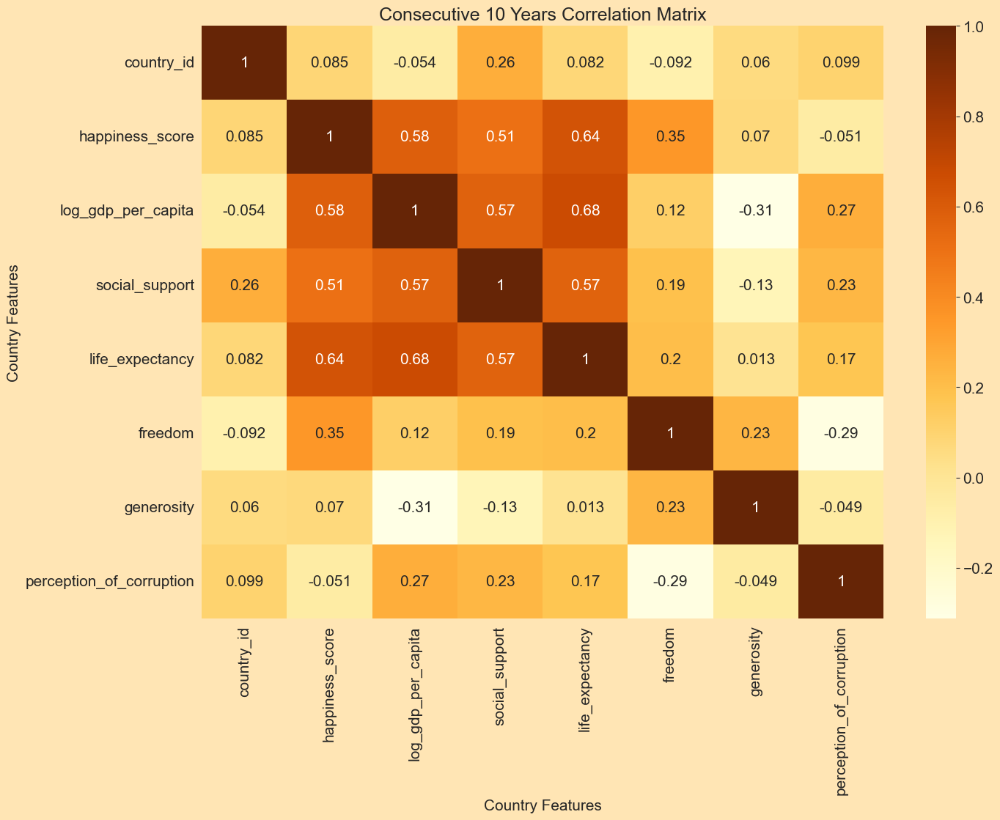

In [274]:

distinct_con_all_corr_matrix = distinct_con_all.corr(numeric_only = True, method = "pearson")
sns.heatmap(distinct_con_all_corr_matrix, annot=True, cmap="YlOrBr")

plt.title('Consecutive 10 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

print(distinct_con_all.shape)
plt.show()

In [275]:
con_01_all_diff = con_01_all_diff.reset_index().drop('index', axis=1)
con_01_all_diff['consecutive_years'] = 'con_01'

con_02_all_diff = con_02_all_diff.reset_index().drop('index', axis=1)
con_02_all_diff['consecutive_years'] = 'con_02'

con_03_all_diff = con_03_all_diff.reset_index().drop('index', axis=1)
con_03_all_diff['consecutive_years'] = 'con_03'

con_04_all_diff = con_04_all_diff.reset_index().drop('index', axis=1)
con_04_all_diff['consecutive_years'] = 'con_04'

con_05_all_diff = con_05_all_diff.reset_index().drop('index', axis=1)
con_05_all_diff['consecutive_years'] = 'con_05'

con_06_all_diff = con_06_all_diff.reset_index().drop('index', axis=1)
con_06_all_diff['consecutive_years'] = 'con_06'

con_07_all_diff = con_07_all_diff.reset_index().drop('index', axis=1)
con_07_all_diff['consecutive_years'] = 'con_07'

con_08_all_diff = con_08_all_diff.reset_index().drop('index', axis=1)
con_08_all_diff['consecutive_years'] = 'con_08'

con_09_all_diff = con_09_all_diff.reset_index().drop('index', axis=1)
con_09_all_diff['consecutive_years'] = 'con_09'

con_10_all_diff = con_10_all_diff.reset_index().drop('index', axis=1)
con_10_all_diff['consecutive_years'] = 'con_10'

con_11_all_diff = con_11_all_diff.reset_index().drop('index', axis=1)
con_11_all_diff['consecutive_years'] = 'con_11'

con_12_all_diff = con_12_all_diff.reset_index().drop('index', axis=1)
con_12_all_diff['consecutive_years'] = 'con_12'

con_13_all_diff = con_13_all_diff.reset_index().drop('index', axis=1)
con_13_all_diff['consecutive_years'] = 'con_13'

con_14_all_diff = con_14_all_diff.reset_index().drop('index', axis=1)
con_14_all_diff['consecutive_years'] = 'con_14'

con_15_all_diff = con_15_all_diff.reset_index().drop('index', axis=1)
con_15_all_diff['consecutive_years'] = 'con_15'

con_16_all_diff = con_16_all_diff.reset_index().drop('index', axis=1)
con_16_all_diff['consecutive_years'] = 'con_16'

con_all_diff = pd.concat([con_01_all_diff, con_02_all_diff, con_03_all_diff, con_04_all_diff, con_05_all_diff, con_06_all_diff, con_07_all_diff, con_08_all_diff, con_09_all_diff, con_10_all_diff, con_11_all_diff, con_12_all_diff, con_13_all_diff, con_14_all_diff, con_15_all_diff, con_16_all_diff])

print(con_all_diff.shape)
con_all_diff.sort_values('diff', ascending=False).reset_index().drop('index', axis=1).head(10)

(14070, 5)


,country_name,year,happiness_score,diff,consecutive_years
0,Benin,2018,5.819827,2.626358,con_06
1,Benin,2018,5.819827,2.472408,con_04
2,Liberia,2019,5.121461,2.419870,con_04
3,Benin,2018,5.819827,2.340414,con_05
4,Benin,2018,5.819827,2.195163,con_03
5,Nepal,2020,5.982410,2.172966,con_09
6,Nicaragua,2017,6.476357,2.016198,con_11
7,Lithuania,2022,7.037577,1.971752,con_12
8,Benin,2018,5.819827,1.949548,con_07
9,South Africa,2021,5.598654,1.937927,con_08


In [276]:
con_all_diff.describe()

,happiness_score,diff
count,14070.000000,14070.000000
mean,5.596594,0.068349
std,1.076589,0.583583
min,1.281271,-3.437340
25%,4.844028,-0.229961
50%,5.686612,0.058782
75%,6.379925,0.396194
max,7.970892,2.626358


In [277]:
con_all_diff.groupby('consecutive_years')['diff'].mean().sort_values(ascending=False)

consecutive_years
con_16    0.234378
con_15    0.168370
con_11    0.131745
con_10    0.130076
con_09    0.124556
con_08    0.117230
con_12    0.115730
con_13    0.113862
con_07    0.107698
con_14    0.104612
con_06    0.087080
con_05    0.065848
con_04    0.045261
con_03    0.033344
con_02    0.023076
con_01    0.010683
Name: diff, dtype: float64

In [278]:
m_con_01 = con_01_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'1'})
m_con_02 = con_02_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'2'})
m_con_03 = con_03_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'3'})
m_con_04 = con_04_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'4'})
m_con_05 = con_05_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'5'})
m_con_06 = con_06_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'6'})
m_con_07 = con_07_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'7'})
m_con_08 = con_08_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'8'})
m_con_09 = con_09_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'9'})
m_con_10 = con_10_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'10'})
m_con_11 = con_11_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'11'})
m_con_12 = con_12_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'12'})
m_con_13 = con_13_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'13'})
m_con_14 = con_14_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'14'})
m_con_15 = con_15_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'15'})
m_con_16 = con_16_corr_matrix['happiness_score'].reset_index().rename(columns={'happiness_score':'16'})

In [279]:
m_con = m_con_01.merge(m_con_02, on='index')
m_con = m_con.merge(m_con_03, on='index')
m_con = m_con.merge(m_con_04, on='index')
m_con = m_con.merge(m_con_05, on='index')
m_con = m_con.merge(m_con_06, on='index')
m_con = m_con.merge(m_con_07, on='index')
m_con = m_con.merge(m_con_08, on='index')
m_con = m_con.merge(m_con_09, on='index')
m_con = m_con.merge(m_con_10, on='index')
m_con = m_con.merge(m_con_11, on='index')
m_con = m_con.merge(m_con_12, on='index')
m_con = m_con.merge(m_con_13, on='index')
m_con = m_con.merge(m_con_14, on='index')
m_con = m_con.merge(m_con_15, on='index')
m_con = m_con.merge(m_con_16, on='index')

m_con

,index,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,happiness_score,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,log_gdp_per_capita,0.605348,0.599925,0.529247,0.674586,0.638646,0.518991,0.579583,0.508142,0.482268,0.401828,0.486428,0.662678,0.438759,0.784836,0.829322,0.845067
2,social_support,0.458343,0.441986,0.435028,0.494065,0.515857,0.355116,0.441358,0.354644,0.409962,0.412884,0.509441,0.539948,0.411240,-0.022171,-0.251648,-0.269135
3,life_expectancy,0.563569,0.640779,0.651544,0.657116,0.669275,0.670599,0.616786,0.563788,0.496474,0.544906,0.551412,0.510479,0.762713,0.723550,0.884801,0.895099
4,freedom,0.269329,0.332106,0.304465,0.247808,0.293084,0.470413,0.341853,0.405733,0.362443,0.501153,0.330826,0.440201,0.363639,0.583744,0.485684,0.544189
5,generosity,-0.106733,0.102097,0.095338,0.224936,0.305687,0.509662,0.152653,-0.036006,-0.118308,0.105646,-0.352265,0.147374,-0.278459,0.238174,-0.102868,-0.170682
6,perception_of_corruption,-0.188676,-0.146824,-0.230081,0.072863,0.138979,0.081593,0.321987,0.141865,0.137365,-0.000509,-0.244832,-0.708543,-0.188263,-0.660125,-0.763785,-0.785742


In [280]:
m_con = m_con.transpose().reset_index().rename(columns={'index':'consecutive_years',0:'happiness_score',1:'log_gdp_per_capita',2:'social_support',3:'life_expectancy',4:'freedom',5:'generosity',6:'perception_of_corruption'}).drop(index=0).reset_index().drop(['index','happiness_score'], axis=1)
m_con

,consecutive_years,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,1,0.605348,0.458343,0.563569,0.269329,-0.106733,-0.188676
1,2,0.599925,0.441986,0.640779,0.332106,0.102097,-0.146824
2,3,0.529247,0.435028,0.651544,0.304465,0.095338,-0.230081
3,4,0.674586,0.494065,0.657116,0.247808,0.224936,0.072863
4,5,0.638646,0.515857,0.669275,0.293084,0.305687,0.138979
5,6,0.518991,0.355116,0.670599,0.470413,0.509662,0.081593
6,7,0.579583,0.441358,0.616786,0.341853,0.152653,0.321987
7,8,0.508142,0.354644,0.563788,0.405733,-0.036006,0.141865
8,9,0.482268,0.409962,0.496474,0.362443,-0.118308,0.137365
9,10,0.401828,0.412884,0.544906,0.501153,0.105646,-0.000509


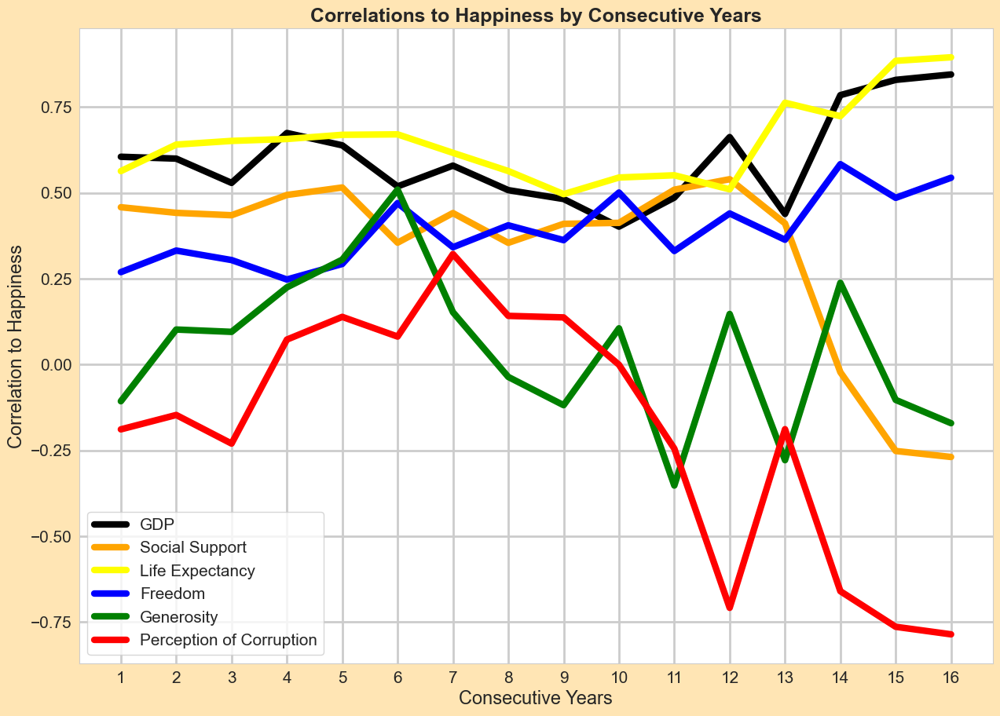

In [281]:
ax = sns.lineplot(data=m_con, x='consecutive_years',y='log_gdp_per_capita', linewidth=6.0, color='black', label='GDP')
ax = sns.lineplot(data=m_con, x='consecutive_years',y='social_support', linewidth=6.0, color='orange', label='Social Support')
ax = sns.lineplot(data=m_con, x='consecutive_years',y='life_expectancy', linewidth=6.0, color='yellow', label='Life Expectancy')
ax = sns.lineplot(data=m_con, x='consecutive_years',y='freedom', linewidth=6.0, color='blue', label='Freedom')
ax = sns.lineplot(data=m_con, x='consecutive_years',y='generosity', linewidth=6.0, color='green', label='Generosity')
ax = sns.lineplot(data=m_con, x='consecutive_years',y='perception_of_corruption', linewidth=6.0, color='red', label='Perception of Corruption')

ax.set_title('Correlations to Happiness by Consecutive Years',fontweight="bold")
ax.set_xlabel('Consecutive Years', size=17)
ax.set_ylabel('Correlation to Happiness', size=17)
ax.legend(loc='lower left')
ax.tick_params(labelsize=15)
ax.grid(linewidth=2)

#### Create a diagram where the change in happiness is shown.

In [324]:
test_data_3 = data[['country_name', 'country_id', 'region', 'year', 'happiness_score']].copy()

In [325]:
test_data_3['year'] = test_data_3['year'].astype('int64')
test_data_3.dtypes

country_name        object
country_id           int64
region              object
year                 int64
happiness_score    float64
dtype: object

In [326]:
test_data_3.head(20)

,country_name,country_id,region,year,happiness_score
0,Afghanistan,1,Asia & Pacific,2008,3.723590
1,Afghanistan,1,Asia & Pacific,2009,4.401778
2,Afghanistan,1,Asia & Pacific,2010,4.758381
3,Afghanistan,1,Asia & Pacific,2011,3.831719
4,Afghanistan,1,Asia & Pacific,2012,3.782938
5,Afghanistan,1,Asia & Pacific,2013,3.572100
6,Afghanistan,1,Asia & Pacific,2014,3.130896
7,Afghanistan,1,Asia & Pacific,2015,3.982855
8,Afghanistan,1,Asia & Pacific,2016,4.220169
9,Afghanistan,1,Asia & Pacific,2017,2.661718


In [366]:
# 01 year

In [444]:
happiness_diff_01 = test_data_3
happiness_diff_01['year_shift'] = happiness_diff_01.groupby('country_name')['year'].shift(1)
happiness_diff_01['year_diff'] = happiness_diff_01['year'] - happiness_diff_01['year_shift']
happiness_diff_01['happiness_shift'] = happiness_diff_01['happiness_score'].shift(1)
happiness_diff_01['happiness_diff'] = happiness_diff_01['happiness_shift'] - happiness_diff_01['happiness_score']

In [445]:
happiness_diff_01 = happiness_diff_01[happiness_diff_01['year_diff'] == 1][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [446]:
happiness_diff_01['happiness_diff'].describe()

count    1980.000000
mean       -0.010683
std         0.378108
min        -1.662524
25%        -0.208412
50%        -0.015136
75%         0.179920
max         1.998616
Name: happiness_diff, dtype: float64

In [447]:
# 02 year

In [448]:
happiness_diff_02 = test_data_3
happiness_diff_02['year_shift'] = happiness_diff_02.groupby('country_name')['year'].shift(2)
happiness_diff_02['year_diff'] = happiness_diff_02['year'] - happiness_diff_02['year_shift']
happiness_diff_02['happiness_shift'] = happiness_diff_02['happiness_score'].shift(2)
happiness_diff_02['happiness_diff'] = happiness_diff_02['happiness_shift'] - happiness_diff_02['happiness_score']

In [449]:
happiness_diff_02 = happiness_diff_02[happiness_diff_02['year_diff'] == 2][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [450]:
happiness_diff_02['happiness_diff'].describe()

count    1762.000000
mean       -0.023076
std         0.453463
min        -1.865735
25%        -0.260243
50%        -0.024372
75%         0.202323
max         2.533434
Name: happiness_diff, dtype: float64

In [451]:
# 03 year

In [452]:
happiness_diff_03 = test_data_3
happiness_diff_03['year_shift'] = happiness_diff_03.groupby('country_name')['year'].shift(3)
happiness_diff_03['year_diff'] = happiness_diff_03['year'] - happiness_diff_03['year_shift']
happiness_diff_03['happiness_shift'] = happiness_diff_03['happiness_score'].shift(3)
happiness_diff_03['happiness_diff'] = happiness_diff_03['happiness_shift'] - happiness_diff_03['happiness_score']

In [453]:
happiness_diff_03 = happiness_diff_03[happiness_diff_03['year_diff'] == 3][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [454]:
happiness_diff_03['happiness_diff'].describe()

count    1582.000000
mean       -0.033344
std         0.501231
min        -2.195163
25%        -0.314570
50%        -0.035694
75%         0.213992
max         2.988377
Name: happiness_diff, dtype: float64

In [455]:
# 04 year

In [456]:
happiness_diff_04 = test_data_3
happiness_diff_04['year_shift'] = happiness_diff_04.groupby('country_name')['year'].shift(4)
happiness_diff_04['year_diff'] = happiness_diff_04['year'] - happiness_diff_04['year_shift']
happiness_diff_04['happiness_shift'] = happiness_diff_04['happiness_score'].shift(4)
happiness_diff_04['happiness_diff'] = happiness_diff_04['happiness_shift'] - happiness_diff_04['happiness_score']

In [457]:
happiness_diff_04 = happiness_diff_04[happiness_diff_04['year_diff'] == 4][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [458]:
happiness_diff_04['happiness_diff'].describe()

count    1422.000000
mean       -0.045261
std         0.549342
min        -2.472408
25%        -0.370815
50%        -0.046376
75%         0.244400
max         3.025463
Name: happiness_diff, dtype: float64

In [459]:
# 05 year

In [460]:
happiness_diff_05 = test_data_3
happiness_diff_05['year_shift'] = happiness_diff_05.groupby('country_name')['year'].shift(5)
happiness_diff_05['year_diff'] = happiness_diff_05['year'] - happiness_diff_05['year_shift']
happiness_diff_05['happiness_shift'] = happiness_diff_05['happiness_score'].shift(5)
happiness_diff_05['happiness_diff'] = happiness_diff_05['happiness_shift'] - happiness_diff_05['happiness_score']

In [461]:
happiness_diff_05 = happiness_diff_05[happiness_diff_05['year_diff'] == 5][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [462]:
happiness_diff_05['happiness_diff'].describe()

count    1275.000000
mean       -0.065848
std         0.591635
min        -2.340414
25%        -0.429354
50%        -0.059663
75%         0.265868
max         3.091914
Name: happiness_diff, dtype: float64

In [463]:
# 06 year

In [464]:
happiness_diff_06 = test_data_3
happiness_diff_06['year_shift'] = happiness_diff_06.groupby('country_name')['year'].shift(6)
happiness_diff_06['year_diff'] = happiness_diff_06['year'] - happiness_diff_06['year_shift']
happiness_diff_06['happiness_shift'] = happiness_diff_06['happiness_score'].shift(6)
happiness_diff_06['happiness_diff'] = happiness_diff_06['happiness_shift'] - happiness_diff_01['happiness_score']

In [465]:
happiness_diff_06 = happiness_diff_06[happiness_diff_06['year_diff'] == 6][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [466]:
happiness_diff_06['happiness_diff'].describe()

count    1136.000000
mean       -0.087080
std         0.627010
min        -2.626358
25%        -0.468112
50%        -0.072237
75%         0.249512
max         3.437340
Name: happiness_diff, dtype: float64

In [467]:
# 07 year

In [468]:
happiness_diff_07 = test_data_3
happiness_diff_07['year_shift'] = happiness_diff_07.groupby('country_name')['year'].shift(7)
happiness_diff_07['year_diff'] = happiness_diff_07['year'] - happiness_diff_07['year_shift']
happiness_diff_07['happiness_shift'] = happiness_diff_07['happiness_score'].shift(7)
happiness_diff_07['happiness_diff'] = happiness_diff_07['happiness_shift'] - happiness_diff_07['happiness_score']

In [469]:
happiness_diff_07 = happiness_diff_07[happiness_diff_07['year_diff'] == 7][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [470]:
happiness_diff_07['happiness_diff'].describe()

count    1002.000000
mean       -0.107698
std         0.648259
min        -1.949548
25%        -0.519246
50%        -0.106192
75%         0.250718
max         3.147688
Name: happiness_diff, dtype: float64

In [471]:
# 08 year

In [472]:
happiness_diff_08 = test_data_3
happiness_diff_08['year_shift'] = happiness_diff_08.groupby('country_name')['year'].shift(8)
happiness_diff_08['year_diff'] = happiness_diff_08['year'] - happiness_diff_08['year_shift']
happiness_diff_08['happiness_shift'] = happiness_diff_08['happiness_score'].shift(8)
happiness_diff_08['happiness_diff'] = happiness_diff_08['happiness_shift'] - happiness_diff_08['happiness_score']

In [473]:
happiness_diff_08 = happiness_diff_08[happiness_diff_08['year_diff'] == 8][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [474]:
happiness_diff_08['happiness_diff'].describe()

count    873.000000
mean      -0.117230
std        0.673061
min       -1.937927
25%       -0.531732
50%       -0.128982
75%        0.253854
max        2.880598
Name: happiness_diff, dtype: float64

In [475]:
# 09 year

In [476]:
happiness_diff_09 = test_data_3
happiness_diff_09['year_shift'] = happiness_diff_09.groupby('country_name')['year'].shift(9)
happiness_diff_09['year_diff'] = happiness_diff_09['year'] - happiness_diff_09['year_shift']
happiness_diff_09['happiness_shift'] = happiness_diff_09['happiness_score'].shift(9)
happiness_diff_09['happiness_diff'] = happiness_diff_09['happiness_shift'] - happiness_diff_01['happiness_score']

In [477]:
happiness_diff_09 = happiness_diff_09[happiness_diff_09['year_diff'] == 9][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [478]:
happiness_diff_09['happiness_diff'].describe()

count    745.000000
mean      -0.124556
std        0.697727
min       -2.172966
25%       -0.559139
50%       -0.111084
75%        0.261887
max        2.840826
Name: happiness_diff, dtype: float64

In [479]:
# 10 year

In [480]:
happiness_diff_10 = test_data_3
happiness_diff_10['year_shift'] = happiness_diff_10.groupby('country_name')['year'].shift(10)
happiness_diff_10['year_diff'] = happiness_diff_10['year'] - happiness_diff_10['year_shift']
happiness_diff_10['happiness_shift'] = happiness_diff_10['happiness_score'].shift(10)
happiness_diff_10['happiness_diff'] = happiness_diff_10['happiness_shift'] - happiness_diff_10['happiness_score']

In [481]:
happiness_diff_10 = happiness_diff_10[happiness_diff_10['year_diff'] == 10][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [482]:
happiness_diff_10['happiness_diff'].describe()

count    627.000000
mean      -0.130076
std        0.718312
min       -1.885577
25%       -0.596876
50%       -0.163187
75%        0.277050
max        3.008762
Name: happiness_diff, dtype: float64

In [483]:
# 11 year

In [484]:
happiness_diff_11 = test_data_3
happiness_diff_11['year_shift'] = happiness_diff_11.groupby('country_name')['year'].shift(11)
happiness_diff_11['year_diff'] = happiness_diff_11['year'] - happiness_diff_11['year_shift']
happiness_diff_11['happiness_shift'] = happiness_diff_11['happiness_score'].shift(11)
happiness_diff_11['happiness_diff'] = happiness_diff_11['happiness_shift'] - happiness_diff_11['happiness_score']

In [485]:
happiness_diff_11 = happiness_diff_11[happiness_diff_11['year_diff'] == 11][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [486]:
happiness_diff_11['happiness_diff'].describe()

count    515.000000
mean      -0.131745
std        0.736659
min       -2.016198
25%       -0.601762
50%       -0.144520
75%        0.279125
max        2.853090
Name: happiness_diff, dtype: float64

In [487]:
# 12 year

In [488]:
happiness_diff_12 = test_data_3
happiness_diff_12['year_shift'] = happiness_diff_12.groupby('country_name')['year'].shift(12)
happiness_diff_12['year_diff'] = happiness_diff_12['year'] - happiness_diff_12['year_shift']
happiness_diff_12['happiness_shift'] = happiness_diff_12['happiness_score'].shift(12)
happiness_diff_12['happiness_diff'] = happiness_diff_12['happiness_shift'] - happiness_diff_12['happiness_score']

In [489]:
happiness_diff_12 = happiness_diff_12[happiness_diff_12['year_diff'] == 12][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [490]:
happiness_diff_12['happiness_diff'].describe()

count    408.000000
mean      -0.115730
std        0.736799
min       -1.971752
25%       -0.586084
50%       -0.145449
75%        0.292052
max        3.027189
Name: happiness_diff, dtype: float64

In [491]:
# 13 year

In [492]:
happiness_diff_13 = test_data_3
happiness_diff_13['year_shift'] = happiness_diff_13.groupby('country_name')['year'].shift(13)
happiness_diff_13['year_diff'] = happiness_diff_13['year'] - happiness_diff_13['year_shift']
happiness_diff_13['happiness_shift'] = happiness_diff_13['happiness_score'].shift(13)
happiness_diff_13['happiness_diff'] = happiness_diff_13['happiness_shift'] - happiness_diff_13['happiness_score']

In [493]:
happiness_diff_13 = happiness_diff_13[happiness_diff_13['year_diff'] == 13][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [494]:
happiness_diff_13['happiness_diff'].describe()

count    306.000000
mean      -0.113862
std        0.742909
min       -1.697175
25%       -0.580346
50%       -0.113154
75%        0.272836
max        2.853571
Name: happiness_diff, dtype: float64

In [495]:
# 14 year

In [496]:
happiness_diff_14 = test_data_3
happiness_diff_14['year_shift'] = happiness_diff_14.groupby('country_name')['year'].shift(14)
happiness_diff_14['year_diff'] = happiness_diff_14['year'] - happiness_diff_14['year_shift']
happiness_diff_14['happiness_shift'] = happiness_diff_14['happiness_score'].shift(14)
happiness_diff_14['happiness_diff'] = happiness_diff_14['happiness_shift'] - happiness_diff_14['happiness_score']

In [497]:
happiness_diff_14 = happiness_diff_14[happiness_diff_14['year_diff'] == 14][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [498]:
happiness_diff_14['happiness_diff'].describe()

count    214.000000
mean      -0.104612
std        0.747060
min       -1.826732
25%       -0.607261
50%       -0.191475
75%        0.374635
max        2.813799
Name: happiness_diff, dtype: float64

In [499]:
# 15 year

In [500]:
happiness_diff_15 = test_data_3
happiness_diff_15['year_shift'] = happiness_diff_15.groupby('country_name')['year'].shift(15)
happiness_diff_15['year_diff'] = happiness_diff_15['year'] - happiness_diff_15['year_shift']
happiness_diff_15['happiness_shift'] = happiness_diff_15['happiness_score'].shift(15)
happiness_diff_15['happiness_diff'] = happiness_diff_15['happiness_shift'] - happiness_diff_15['happiness_score']

In [501]:
happiness_diff_15 = happiness_diff_15[happiness_diff_15['year_diff'] == 15][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [502]:
happiness_diff_15['happiness_diff'].describe()

count    141.000000
mean      -0.168370
std        0.715128
min       -1.635190
25%       -0.725892
50%       -0.226833
75%        0.346765
max        2.202651
Name: happiness_diff, dtype: float64

In [503]:
# 16 year

In [504]:
happiness_diff_16 = test_data_3
happiness_diff_16['year_shift'] = happiness_diff_16.groupby('country_name')['year'].shift(16)
happiness_diff_16['year_diff'] = happiness_diff_16['year'] - happiness_diff_16['year_shift']
happiness_diff_16['happiness_shift'] = happiness_diff_16['happiness_score'].shift(16)
happiness_diff_16['happiness_diff'] = happiness_diff_16['happiness_shift'] - happiness_diff_16['happiness_score']

In [505]:
happiness_diff_16 = happiness_diff_16[happiness_diff_16['year_diff'] == 16][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [506]:
happiness_diff_16['happiness_diff'].describe()

count    82.000000
mean     -0.234378
std       0.697721
min      -1.932099
25%      -0.670579
50%      -0.274733
75%       0.192104
max       1.478257
Name: happiness_diff, dtype: float64

In [507]:
# 17 year

In [508]:
happiness_diff_17 = test_data_3
happiness_diff_17['year_shift'] = happiness_diff_17.groupby('country_name')['year'].shift(17)
happiness_diff_17['year_diff'] = happiness_diff_17['year'] - happiness_diff_17['year_shift']
happiness_diff_17['happiness_shift'] = happiness_diff_17['happiness_score'].shift(17)
happiness_diff_17['happiness_diff'] = happiness_diff_17['happiness_shift'] - happiness_diff_17['happiness_score']

In [509]:
happiness_diff_17 = happiness_diff_17[happiness_diff_17['year_diff'] == 17][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [510]:
happiness_diff_17['happiness_diff'].describe()

count    34.000000
mean     -0.369291
std       0.614335
min      -1.798642
25%      -0.713299
50%      -0.429209
75%       0.010112
max       1.312459
Name: happiness_diff, dtype: float64

In [511]:
# 18 year

In [512]:
happiness_diff_18 = test_data_3
happiness_diff_18['year_shift'] = happiness_diff_18.groupby('country_name')['year'].shift(18)
happiness_diff_18['year_diff'] = happiness_diff_18['year'] - happiness_diff_18['year_shift']
happiness_diff_18['happiness_shift'] = happiness_diff_18['happiness_score'].shift(18)
happiness_diff_18['happiness_diff'] = happiness_diff_18['happiness_shift'] - happiness_diff_18['happiness_score']

In [513]:
happiness_diff_18 = happiness_diff_18[happiness_diff_18['year_diff'] == 18][['country_name', 'region', 'year', 'happiness_score', 'happiness_diff', 'year_diff']]

In [514]:
happiness_diff_18['happiness_diff'].describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: happiness_diff, dtype: float64

In [519]:
happiness_difference = pd.concat([
    happiness_diff_01,
    happiness_diff_02,
    happiness_diff_03,
    happiness_diff_04,
    happiness_diff_05,
    happiness_diff_06,
    happiness_diff_07,
    happiness_diff_08,
    happiness_diff_09,
    happiness_diff_10,
    happiness_diff_11,
    happiness_diff_12,
    happiness_diff_13,
    happiness_diff_14,
    happiness_diff_15,
    happiness_diff_16,
    happiness_diff_17,
    happiness_diff_18,], axis=0)

In [293]:
test_data_3['year'] = pd.to_numeric(test_data_3['year'])

In [294]:
test_data_3.pivot(index='country_name', columns='year', values='happiness_score').reset_index().head(30)

year,country_name,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,NaN,NaN,NaN,3.723590,4.401778,4.758381,3.831719,3.782938,3.572100,3.130896,3.982855,4.220169,2.661718,2.694303,2.375092,NaN,2.436034,1.281271,1.8590
1,Albania,NaN,NaN,4.634252,NaN,5.485470,5.268937,5.867422,5.510124,4.550648,4.813763,4.606651,4.511101,4.639548,5.004403,4.995318,5.364910,5.255482,5.212213,5.2773
2,Algeria,NaN,NaN,NaN,NaN,NaN,5.463567,5.317194,5.604596,NaN,6.354898,NaN,5.340854,5.248912,5.043086,4.744627,5.437755,5.217018,NaN,5.3291
3,Angola,NaN,NaN,NaN,NaN,NaN,NaN,5.589001,4.360250,3.937107,3.794838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Argentina,NaN,6.312925,6.073158,5.961034,6.424133,6.441067,6.775805,6.468387,6.582260,6.671114,6.697131,6.427221,6.039330,5.792797,6.085561,5.900567,5.908279,6.260993,6.0237
5,Armenia,NaN,4.289311,4.881516,4.651972,4.177582,4.367811,4.260491,4.319712,4.277191,4.453083,4.348320,4.325472,4.287736,5.062449,5.488087,NaN,5.300569,5.381943,5.3417
6,Australia,7.340688,NaN,7.285391,7.253757,NaN,7.450047,7.405616,7.195586,7.364169,7.288550,7.309061,7.250080,7.257038,7.176993,7.233995,7.137368,7.111599,7.034696,7.0946
7,Austria,NaN,7.122211,NaN,7.180954,NaN,7.302679,7.470513,7.400689,7.498803,6.950000,7.076447,7.048072,7.293728,7.396002,7.195361,7.213489,7.079641,6.998997,7.0973
8,Azerbaijan,NaN,4.727871,4.568160,4.817189,4.573725,4.218611,4.680470,4.910772,5.481178,5.251530,5.146775,5.303895,5.152279,5.167995,5.173389,NaN,NaN,NaN,NaN
9,Bahrain,NaN,NaN,NaN,NaN,5.700523,5.936869,4.823976,5.027187,6.689711,6.165134,6.007375,6.169673,6.227321,NaN,7.098012,6.173176,NaN,NaN,6.1732


In [295]:
Find the difference between consecutuve year differences.

SyntaxError: invalid syntax (3939661270.py, line 1)

In [ ]:
# Mean and Standard Deviation

con_all_diff_mean = 0.062161
con_all_diff_std = 0.564237

# 2 Standard Deviations

print(con_all_diff_std * 2)
print(con_all_diff_std * 3)

In [ ]:
con_all_diff_top2std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 2)].sort_values('diff', ascending=False)

print(con_all_diff_top2std.shape)
con_all_diff_top2std.sort_values('diff', ascending=False).head(10)

In [ ]:
con_all_diff_top2std.groupby('consecutive_years')['consecutive_years'].count().sort_values(ascending=False)

In [ ]:
con_all_diff_top2std.groupby('consecutive_years')['consecutive_years'].count().sort_values(ascending=False).describe()

In [ ]:
con_all_diff_top3std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 3)].sort_values('diff', ascending=False)

print(con_all_diff_top3std.shape)
con_all_diff_top3std.sort_values('diff', ascending=False).head(10)

In [ ]:
con_all_diff_top3std.groupby('consecutive_years')['consecutive_years'].count()

In [ ]:
con_all_diff_top4std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 4)].sort_values('diff', ascending=False)

print(con_all_diff_top4std.shape)
con_all_diff_top4std.sort_values('diff', ascending=False)

In [ ]:
Beans

In [ ]:
Bahrain_2011_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2011, 2012, 2013]) == True)]
Bahrain_2011_2013.loc[Bahrain_2011_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2011-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')

In [ ]:
Benin_2016_2018 = data[(data['country_name'] == 'Benin') & (data['year'].isin([2016, 2017, 2018]) == True)]
Benin_2016_2018.loc[Benin_2016_2018['country_name'] == 'Benin', 'country_name'] = 'Benin 2016-2018'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Benin', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2005]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Benin_2016_2018, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Benin_2016_2018, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Benin_2016_2018, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Benin_2016_2018, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Benin_2016_2018, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
Liberia_2015_2017 = data[(data['country_name'] == 'Liberia') & (data['year'].isin([2015, 2016, 2017]) == True)]
Liberia_2015_2017.loc[Liberia_2015_2017['country_name'] == 'Liberia', 'country_name'] = 'Liberia 2015-2017'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Liberia', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2006]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Liberia_2015_2017, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Liberia_2015_2017, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Liberia_2015_2017, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Liberia_2015_2017, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Liberia_2015_2017, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
Bahrain_2011_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2011, 2012, 2013]) == True)]
Bahrain_2011_2013.loc[Bahrain_2011_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2011-2013'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
%whos DataFrame

In [ ]:
corr_matrix_global